# Trabajo Fin de Master

---

**Nombre y apellidos:** JOHAN DAVID HERNANDEZ RAMIREZ

**Usuario VIU:** jhernandezr@student.universidadviu.com

---

---
# Inicialización
---

## Importación de Librerias y carga de dataset

In [2]:
# Imports generales

import io
import pandas as pd
import numpy as np
import holidays
from datetime import timedelta
from numpy import corrcoef, transpose, arange

import matplotlib.pyplot as plt
from plotly.subplots import make_subplots
import plotly.graph_objects as go
import plotly.graph_objs as go
import plotly.offline as pyo # para exportar en html
import plotly.express as px
import seaborn as sns
from fitter import Fitter
from scipy.stats import beta
from scipy import stats

from pycaret import clustering
from pycaret.clustering import *

from scipy.stats import chi2_contingency

from sklearn.impute import KNNImputer
from sklearn.cluster import DBSCAN
from sklearn.decomposition import PCA
from sklearn.preprocessing import MinMaxScaler
from sklearn import preprocessing
from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
from sklearn.datasets import make_moons
from sklearn.cluster import SpectralClustering
from sklearn.mixture._gaussian_mixture import GaussianMixture
from sklearn.metrics import silhouette_score
from sklearn.manifold import TSNE

from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier  
from sklearn.metrics import accuracy_score, classification_report  

from mpl_toolkits.mplot3d import Axes3D

## Funciones

In [2]:
# Función para calcular cuartiles Q1 y Q3 y tratar outliers por límites superior e inferior
def treat_outliers(df, column_name, column_name_new):
    column = df[column_name]

    q1 = np.percentile(column, 25)
    q3 = np.percentile(column, 75)
    iqr = q3 - q1

    lower_limit = q1 - 1.5 * iqr
    upper_limit = q3 + 1.5 * iqr

    # Reemplazar valores atípicos en la columna especificada
    df[column_name_new] = np.where(column < lower_limit, lower_limit,
                                    np.where(column > upper_limit, upper_limit, column))

    return df

# Está función fue creada para la entrega de la primera práctica de la asignatura Míneria de Datos

In [3]:
df_original = pd.read_csv('data/Preprocess_df_1_exp2.csv')

In [4]:
df_original.shape

(1557277, 55)

In [5]:
df_original.head(3)

,NumeroFactura,Ano,FechaIngreso,HoraIngreso,FechaSalida,HoraSalida,cod_unificado,CodigoPrestador,Nombre prestador,Prestador:publica/privada,...,Día de la semana,Mes,Rango horario ingreso,Rango horario salida,Día del mes,Es fin de semana,Clasificación estancia,Grupo etario,ClasificaciónSalida,ClasificaciónSalidaCrítica
0,288306,2019,2019-12-26,2025-02-01 23:38:00,2019-12-27,2025-02-01 13:55:00,501,50010217203,CLINICA MEDELLIN OCCIDENTE,IPS Privadas,...,Thursday,December,Noche,Tarde,26,N,Corta,Adulto,Transmisión alimentaria,SI
1,4129237242,2019,2019-12-21,2025-02-01 05:17:00,2019-12-21,2025-02-01 07:33:00,501,50010425930,IPS SURA LAS VEGAS MEDELLIN,IPS Privadas,...,Saturday,December,Madrugada,Mañana,21,S,Corta,Adulto,Signos y síntomas generales,NO
2,4129237242,2019,2019-12-23,2025-02-01 07:29:00,2019-12-23,2025-02-01 11:25:00,501,50010425930,IPS SURA LAS VEGAS MEDELLIN,IPS Privadas,...,Monday,December,Mañana,Mañana,23,N,Corta,Adulto,Trastorno urinario,NO


In [6]:
df_original.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1557277 entries, 0 to 1557276
Data columns (total 55 columns):
 #   Column                                    Non-Null Count    Dtype  
---  ------                                    --------------    -----  
 0   NumeroFactura                             1557277 non-null  object 
 1   Ano                                       1557277 non-null  int64  
 2   FechaIngreso                              1557277 non-null  object 
 3   HoraIngreso                               1557277 non-null  object 
 4   FechaSalida                               1557277 non-null  object 
 5   HoraSalida                                1557277 non-null  object 
 6   cod_unificado                             1557277 non-null  int64  
 7   CodigoPrestador                           1557277 non-null  int64  
 8   Nombre prestador                          1557277 non-null  object 
 9   Prestador:publica/privada                 1557277 non-null  object 
 10  Tipo P

In [7]:
df_original.isnull().sum()

NumeroFactura                                    0
Ano                                              0
FechaIngreso                                     0
HoraIngreso                                      0
FechaSalida                                      0
HoraSalida                                       0
cod_unificado                                    0
CodigoPrestador                                  0
Nombre prestador                                 0
Prestador:publica/privada                        0
Tipo Prestador                                   0
CodMunicipio                                     0
Municipio                                        0
Clasifiación casos municipio                     0
CodDepto                                         0
Departamento                                     0
Region_departamento                              0
Cobertura servicios básicos departamento         0
CausaExterna                                     0
CodigoDiagnosticoPrincipalSalid

##  Análisis univariante

In [8]:
Preprocess_df = df_original.copy()

In [9]:
Preprocess_df.columns

Index(['NumeroFactura', 'Ano', 'FechaIngreso', 'HoraIngreso', 'FechaSalida',
       'HoraSalida', 'cod_unificado', 'CodigoPrestador', 'Nombre prestador',
       'Prestador:publica/privada', 'Tipo Prestador', 'CodMunicipio',
       'Municipio', 'Clasifiación casos municipio', 'CodDepto', 'Departamento',
       'Region_departamento', 'Cobertura servicios básicos departamento',
       'CausaExterna', 'CodigoDiagnosticoPrincipalSalida',
       'CodigoDiagnosticoRelN1Salida', 'CodigoDiagnosticoRelN2Salida',
       'CodigoDiagnosticoRelN3Salida', 'DestinoUsuario', 'EstadoSalida',
       'CausaBasicaMuerteUrgencias', 'CodigoEAPB', 'TipoUsuario', 'Edad',
       'UnidadMedidaEdad', 'Sexo', 'ZonaResidencia',
       'Prestador:1.publica/0.privada', 'CausaExternaNueva', 'nom_ase',
       'count', 'Clasificación aseguradora', 'TpoUsuario_nuevo', 'Año', 'Hora',
       'HoraSalidaHora', 'TiempoDeEstancia horas', 'Es festivo (S/N)',
       'Es víspera (S/N)', 'Día Laborable', 'Día de la semana', 'Mes'

### Departamento

In [10]:
# Contar el número de registros por departamento
registros_por_departamento = Preprocess_df.groupby('Departamento').size().reset_index()
registros_por_departamento = registros_por_departamento.rename(columns={0:'Cantidad'})
registros_por_departamento =registros_por_departamento.sort_values(by='Cantidad', ascending=False)

# Mostrar el resultado
registros_por_departamento

,Departamento,Cantidad
1,ANTIOQUIA,1542804
11,CHOCO,3798
26,SANTA FE DE BOGOTÁ,1782
12,CORDOBA,1297
27,SANTANDER,1000
4,BOLIVAR,963
30,VALLE DEL CAUCA,647
5,BOYACA,549
6,CALDAS,549
13,CUNDINAMARCA,476


In [11]:
# registros_por_departamento.to_csv('depar.csv', index=False)

In [12]:
import json
from urllib.request import urlopen
with urlopen('https://gist.githubusercontent.com/john-guerra/43c7656821069d00dcbc/raw/be6a6e239cd5b5b803c6e7c2ec405b793a9064dd/Colombia.geo.json') as response:
    counties = json.load(response)

In [13]:
locs = registros_por_departamento['Departamento']

for loc in counties['features']:
    loc['id'] = loc['properties']['NOMBRE_DPT']
fig = go.Figure(go.Choroplethmapbox(
                    geojson=counties,
                    locations=locs,
                    z=registros_por_departamento['Cantidad'],
                    colorscale='Viridis',
                    colorbar_title="Cantidad"))
fig.update_layout(mapbox_style="carto-positron",
                        mapbox_zoom=3.4,
                        mapbox_center = {"lat": 4.570868, "lon": -74.2973328})
fig.show()

In [14]:
# Contar el número de registros por departamento
registros_por_departamento_2 = Preprocess_df[Preprocess_df['Departamento']!='ANTIOQUIA']

# Contar el número de registros por departamento
registros_por_departamento_2 = registros_por_departamento_2.groupby('Departamento').size().reset_index()
registros_por_departamento_2 = registros_por_departamento_2.rename(columns={0:'Cantidad'})
registros_por_departamento_2 = registros_por_departamento_2.sort_values(by='Cantidad', ascending=False)

# Mostrar el resultado
registros_por_departamento_2

,Departamento,Cantidad
10,CHOCO,3798
25,SANTA FE DE BOGOTÁ,1782
11,CORDOBA,1297
26,SANTANDER,1000
3,BOLIVAR,963
29,VALLE DEL CAUCA,647
5,CALDAS,549
4,BOYACA,549
12,CUNDINAMARCA,476
2,ATLANTICO,460


In [15]:
locs = registros_por_departamento_2['Departamento']

for loc in counties['features']:
    loc['id'] = loc['properties']['NOMBRE_DPT']
fig = go.Figure(go.Choroplethmapbox(
                    geojson=counties,
                    locations=locs,
                    z=registros_por_departamento_2['Cantidad'],
                    colorscale='Viridis',
                    colorbar_title="Cantidad"))
fig.update_layout(mapbox_style="carto-positron",
                        mapbox_zoom=3.4,
                        mapbox_center = {"lat": 4.570868, "lon": -74.2973328})
fig.show()

In [16]:
Preprocess_df.Municipio.unique()

array(['MEDELLIN',
       'BARRANQUILLA (DISTRITO ESPECIAL  INDUSTRIAL Y PORTUARIO DE BARRANQUILLA)',
       'BELLO', 'CALDAS', 'SABANETA', 'MANIZALES', 'ENVIGADO',
       'SANTA FE DE BOGOTA, D. C.', 'ITAGUI', 'LA ESTRELLA', 'APARTADO',
       'COPACABANA', 'GIRARDOTA', 'ABEJORRAL', 'URRAO', 'ANDES',
       'CAUCASIA', 'TARSO', 'SAN LUIS', 'NARIÑO', 'MACEO', 'SAN CARLOS',
       'SAN RAFAEL', 'RIONEGRO', 'ENTRERRIOS', 'SONSON', 'YOLOMBO',
       'BARBOSA', 'GUARNE', 'YARUMAL', 'BETANIA', 'HELICONIA', 'CARACOLI',
       'SANTA BARBARA', 'TURBO', 'TITIRIBI', 'CONCORDIA', 'SAN PEDRO',
       'JARDIN', 'BETULIA', 'DON MATIAS', 'PUERTO TRIUNFO',
       'SANTA ROSA DE OSOS', 'SOPETRAN', 'AGUADAS', 'CAICEDO', 'CISNEROS',
       'SANTO DOMINGO', 'FRONTINO', 'DABEIBA', 'CAREPA', 'VALDIVIA',
       'PEQUE', 'OLAYA', 'AMAGA', 'GUATAPE', 'ITUANGO', 'PUERTO BERRIO',
       'SALGAR', 'SAN PEDRO DE URABA', 'AMALFI', 'ANTIOQUIA', 'SEGOVIA',
       'URAMITA', 'MONTERIA', 'ANDALUCIA', 'IBAGUE',
       

### Destino Usuario

In [17]:
Preprocess_df.DestinoUsuario.value_counts()

DestinoUsuario
1    1192020
3     356183
2       9074
Name: count, dtype: int64

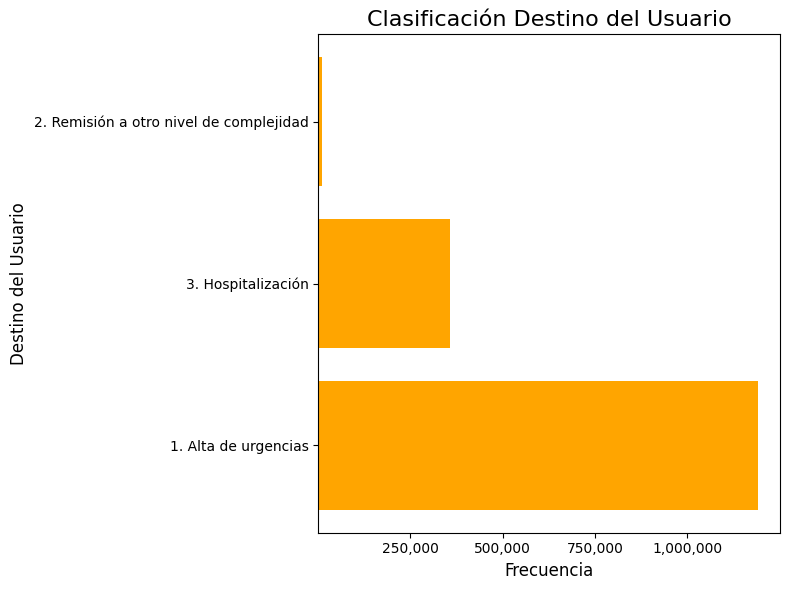

In [ ]:
import matplotlib.pyplot as plt

# Datos
destino_usuario = {
    "1. Alta de urgencias": 1192020,
    "3. Hospitalización": 356183,
    "2. Remisión a otro nivel de complejidad": 9074
}

# Crear la gráfica de barras horizontales
plt.figure(figsize=(8, 6))
plt.barh(list(destino_usuario.keys()), list(destino_usuario.values()), color='orange')

# Agregar título y etiquetas
plt.title('Clasificación Destino del Usuario', fontsize=16)
plt.ylabel('Destino del Usuario', fontsize=12)
plt.xlabel('Frecuencia', fontsize=12)

# Ajustar los valores del eje x para mostrar en 250,000, 500,000, etc.
plt.xticks([250000, 500000, 750000, 1000000], labels=['250,000', '500,000', '750,000', '1,000,000'])

# Mostrar la gráfica
plt.tight_layout()
plt.show()



### NumeroFactura

In [18]:
Preprocess_df.NumeroFactura

0               288306
1           4129237242
2           4129237242
3           4129237242
4           4129237242
              ...     
1557272    GE071242988
1557273    GE132961952
1557274    GE132961951
1557275    GE132959483
1557276    GE132960246
Name: NumeroFactura, Length: 1557277, dtype: object

Esta columna representa la factura que las IPS emiten a las EPS para cobrar por los servicios brindados al paciente. Esta columna no será tenida en cuenta en el desarrollo del modelo, Sin embargo, también es posible analizar cuántos servicios están asociados a cada factura.

In [19]:
Preprocess_df[Preprocess_df['NumeroFactura']=='00020']

,NumeroFactura,Ano,FechaIngreso,HoraIngreso,FechaSalida,HoraSalida,cod_unificado,CodigoPrestador,Nombre prestador,Prestador:publica/privada,...,Día de la semana,Mes,Rango horario ingreso,Rango horario salida,Día del mes,Es fin de semana,Clasificación estancia,Grupo etario,ClasificaciónSalida,ClasificaciónSalidaCrítica
132286,00020,2019,2019-02-05,2025-02-01 14:00:00,2019-02-09,2025-02-01 18:00:00,501,50011427610,Virrey Solís IPS. S.A Tranvía Plaza,IPS Privadas,...,Tuesday,February,Tarde,Noche,5,N,Corta,Niño,Enfermedad pulmonar obstructiva crónica,NO
132287,00020,2019,2019-02-23,2025-02-01 14:00:00,2019-02-27,2025-02-01 18:00:00,501,50011427610,Virrey Solís IPS. S.A Tranvía Plaza,IPS Privadas,...,Saturday,February,Tarde,Noche,23,S,Corta,Niño,Enfermedad pulmonar obstructiva crónica,NO
132288,00020,2019,2019-02-24,2025-02-01 14:00:00,2019-02-25,2025-02-01 18:00:00,501,50011427610,Virrey Solís IPS. S.A Tranvía Plaza,IPS Privadas,...,Sunday,February,Tarde,Noche,24,S,Corta,Adulto,Transmisión alimentaria,SI
132289,00020,2019,2019-02-03,2025-02-01 14:00:00,2019-02-07,2025-02-01 18:00:00,501,50011427610,Virrey Solís IPS. S.A Tranvía Plaza,IPS Privadas,...,Sunday,February,Tarde,Noche,3,S,Corta,Adulto,Enfermedad pulmonar obstructiva crónica,NO
132290,00020,2019,2019-02-08,2025-02-01 14:00:00,2019-02-09,2025-02-01 18:00:00,501,50011427610,Virrey Solís IPS. S.A Tranvía Plaza,IPS Privadas,...,Friday,February,Tarde,Noche,8,N,Corta,Adulto,Enfermedad respiratoria infecciosa,NO
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
826115,00020,2019,2019-02-05,2025-02-01 14:00:00,2019-02-09,2025-02-01 18:00:00,501,50011427610,Virrey Solís IPS. S.A Tranvía Plaza,IPS Privadas,...,Tuesday,February,Tarde,Noche,5,N,Corta,Adulto,Signos y síntomas neurológicos,NO
849543,00020,2019,2019-02-27,2025-02-01 14:00:00,2019-02-28,2025-02-01 18:00:00,501,50011427610,Virrey Solís IPS. S.A Tranvía Plaza,IPS Privadas,...,Wednesday,February,Tarde,Noche,27,N,Corta,Adulto,Signos y síntomas digestivos,NO
849547,00020,2019,2019-02-22,2025-02-01 14:00:00,2019-02-24,2025-02-01 18:00:00,501,50011427610,Virrey Solís IPS. S.A Tranvía Plaza,IPS Privadas,...,Friday,February,Tarde,Noche,22,N,Corta,Adulto,Lesiones traumáticas,NO
878471,00020,2019,2019-02-05,2025-02-01 14:00:00,2019-02-09,2025-02-01 18:00:00,501,50011427610,Virrey Solís IPS. S.A Tranvía Plaza,IPS Privadas,...,Tuesday,February,Tarde,Noche,5,N,Media,Adulto,Enfermedad articular degenerativa,NO


In [20]:
# Asegúrate de reemplazar 'df' por el nombre de tu DataFrame
servicios_por_factura = Preprocess_df.groupby('NumeroFactura').size().reset_index(name='CantidadServicios')

# Mostrar los primeros registros como ejemplo
servicios_por_factura

,NumeroFactura,CantidadServicios
0,00001331721,1
1,00020,1653
2,00021,2
3,00022,2
4,00023,2
...,...,...
1326374,TZ992,1
1326375,TZ993,1
1326376,TZ995,1
1326377,TZ996,1


In [21]:
# Datos preparados previamente
facturas_por_cantidad_servicios = servicios_por_factura.groupby('CantidadServicios').size().reset_index(name='NumeroFacturas')

# Ordenar los datos en orden descendente
facturas_por_cantidad_servicios = facturas_por_cantidad_servicios.sort_values(by='NumeroFacturas', ascending=False)

# Calcular el porcentaje acumulado
facturas_por_cantidad_servicios['PorcentajeAcumulado'] = facturas_por_cantidad_servicios['NumeroFacturas'].cumsum() / facturas_por_cantidad_servicios['NumeroFacturas'].sum() * 100

# Crear gráfico de Pareto dinámico
fig = go.Figure()

# Agregar barras para el número de facturas
fig.add_trace(go.Bar(
    x=facturas_por_cantidad_servicios['CantidadServicios'],
    y=facturas_por_cantidad_servicios['NumeroFacturas'],
    name='Número de Facturas',
    marker_color='skyblue',
    text=facturas_por_cantidad_servicios['NumeroFacturas'],  # Mostrar valores
    textposition='outside'
))

# Agregar línea acumulativa
fig.add_trace(go.Scatter(
    x=facturas_por_cantidad_servicios['CantidadServicios'],
    y=facturas_por_cantidad_servicios['PorcentajeAcumulado'],
    name='Porcentaje Acumulado',
    mode='lines+markers',
    line=dict(color='orange', width=2),
    marker=dict(size=8),
    yaxis='y2'  # Usar segundo eje Y
))

# Configurar diseño del gráfico
fig.update_layout(
    title='Gráfico de Pareto: Distribución de Facturas por Servicios',
    xaxis=dict(title='Cantidad de Servicios'),
    yaxis=dict(
        title='Número de Facturas',
        side='left',
        showgrid=False
    ),
    yaxis2=dict(
        title='Porcentaje Acumulado (%)',
        side='right',
        overlaying='y',
        range=[0, 110],  # Asegura que la línea llegue al 100%
        showgrid=False
    ),
    legend=dict(x=0.8, y=1.2),
    template='plotly_white',
    bargap=0.2
)

# Mostrar gráfico
fig.show()



Se observa que el 97.31% de las instancias están asociadas a un solo servicio. Los casos restantes son atípicos, con excepción de aquellas instancias que están asociadas a dos servicios, que representan solo el 2.61%. Los demás escenarios podrían estar relacionados con jornadas de salud.

### Eliminación duplicados

In [22]:
Preprocess_df.shape

(1557277, 55)

### Eliminación duplicados

In [23]:
### Eliminación duplicados
Preprocess_df = Preprocess_df.drop_duplicates()
Preprocess_df.shape

(1557277, 55)

### CodigoPrestador

Está columna hace referencia a los Instituciones prestadoras de salud 

In [24]:
# ips_df = pd.read_excel('data/Tabla IPS.xlsx')

In [25]:
# ips_df.head(5)

In [26]:
# Preprocess_df = Preprocess_df.merge(ips_df[['codigo','nombre']], left_on='CodigoPrestador', right_on='codigo', how='left')

In [27]:
# Preprocess_df.info()

In [28]:
Preprocess_df.isnull().sum()

NumeroFactura                                    0
Ano                                              0
FechaIngreso                                     0
HoraIngreso                                      0
FechaSalida                                      0
HoraSalida                                       0
cod_unificado                                    0
CodigoPrestador                                  0
Nombre prestador                                 0
Prestador:publica/privada                        0
Tipo Prestador                                   0
CodMunicipio                                     0
Municipio                                        0
Clasifiación casos municipio                     0
CodDepto                                         0
Departamento                                     0
Region_departamento                              0
Cobertura servicios básicos departamento         0
CausaExterna                                     0
CodigoDiagnosticoPrincipalSalid

In [29]:
ips_null =Preprocess_df[Preprocess_df['Nombre prestador'].isnull()]
ips_null

,NumeroFactura,Ano,FechaIngreso,HoraIngreso,FechaSalida,HoraSalida,cod_unificado,CodigoPrestador,Nombre prestador,Prestador:publica/privada,...,Día de la semana,Mes,Rango horario ingreso,Rango horario salida,Día del mes,Es fin de semana,Clasificación estancia,Grupo etario,ClasificaciónSalida,ClasificaciónSalidaCrítica


In [30]:
ips_null.CodigoPrestador.unique()

array([], dtype=int64)

Se realizó una búsqueda y no se logró encontrar los nombres de estás IPS, muy posiblemente estas ya culminaron sus servicios, por lo cual le pondremos una etiqueta de "Sin Definir", para lograr hacer nuestra gráfica

In [31]:
# Agrupar por la columna 'nombre' y contar las instancias
nombre_counts = Preprocess_df['Nombre prestador'].value_counts().reset_index()
nombre_counts.columns = ['Nombre prestador', 'cantidad_instancias']

# Crear el gráfico de barras interactivo
fig = px.bar(nombre_counts, 
             x= 'cantidad_instancias',
             y= 'Nombre prestador',
             title='Frecuencia de Instancias por Nombre prestador', 
             labels={'Nombre prestador': 'Nombre prestador', 'cantidad_instancias': 'Cantidad de Instancias'},
             color='cantidad_instancias',  # Color basado en la cantidad de instancias
             color_continuous_scale='Viridis')  # Escala de colores

# Mostrar el gráfico
fig.show()

In [32]:
# Agrupar por la columna 'nombre' y contar las instancias
nombre_counts = Preprocess_df['Nombre prestador'].value_counts().reset_index()
nombre_counts.columns = ['Nombre prestador', 'cantidad_instancias']

# Ordenar de mayor a menor
nombre_counts = nombre_counts.sort_values(by='cantidad_instancias', ascending=False)

# Calcular el porcentaje acumulado
nombre_counts['percent'] = nombre_counts['cantidad_instancias'] / nombre_counts['cantidad_instancias'].sum() * 100
nombre_counts['percent_cum'] = nombre_counts['percent'].cumsum()

# Crear el gráfico de Pareto (barras + línea acumulada)
fig = go.Figure()

# Agregar las barras
fig.add_trace(go.Bar(
    x=nombre_counts['Nombre prestador'],
    y=nombre_counts['cantidad_instancias'],
    name='Cantidad de Instancias',
    marker_color='blue'
))

# Agregar la línea del porcentaje acumulado
fig.add_trace(go.Scatter(
    x=nombre_counts['Nombre prestador'],
    y=nombre_counts['percent_cum'],
    name='Porcentaje Acumulado',
    mode='lines+markers',
    yaxis='y2',  # Usamos un segundo eje Y para el porcentaje
    marker_color='red',
    line=dict(color='red', width=2)
))

# Configuración del gráfico
fig.update_layout(
    title='Gráfico de Pareto: Frecuencia de Instancias por Nombre prestador',
    xaxis_title='Nombre prestador',
    yaxis_title='Cantidad de Instancias',
    yaxis=dict(
        tickmode='linear',
        dtick=50000,  # Establecer incremento de 10k en el eje Y
    ),
    yaxis2=dict(
        title='Porcentaje Acumulado',
        overlaying='y',
        side='right',
        range=[0, 100]
    ),
    barmode='stack',
    xaxis_tickangle=-45,
    template='plotly_white',
    width=1500,  # Establecer el ancho de la gráfica
    height=800   # Establecer la altura de la gráfica
)

# Mostrar el gráfico
fig.show()


El 80% de los servicios están concentrados en el 18 instituciones

### 'FechaIngreso' y 'HoraIngreso'

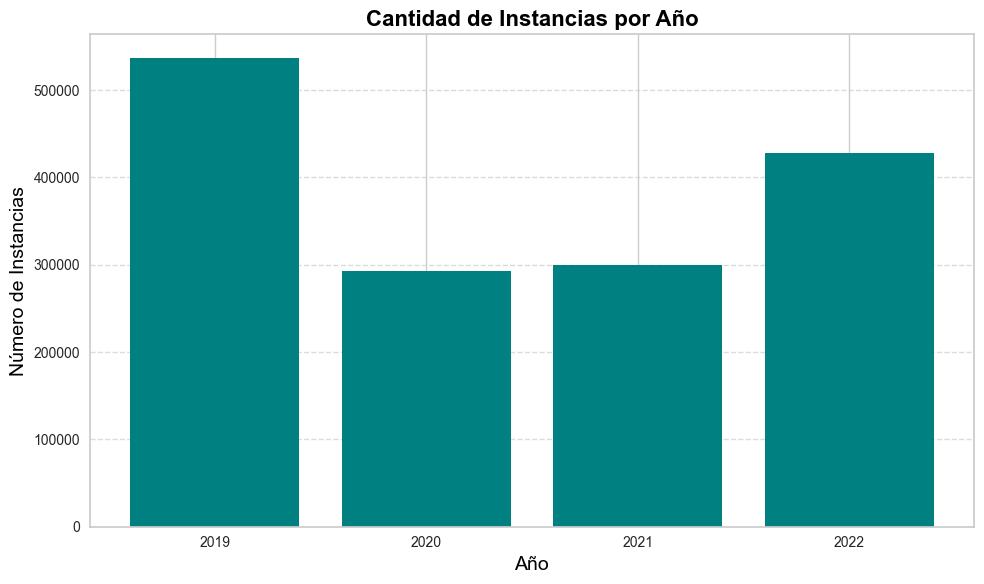

In [33]:
# Convertir 'FechaIngreso' a datetime
Preprocess_df['FechaIngreso'] = pd.to_datetime(Preprocess_df['FechaIngreso'], errors='coerce')

# Extraer el año de 'FechaIngreso'
Preprocess_df['Año'] = Preprocess_df['FechaIngreso'].dt.year

# Agrupar por año y contar el número de instancias
instancias_por_ano = Preprocess_df.groupby('Año').size().reset_index(name='Cantidad de Instancias')

# Crear la figura y los ejes
fig, ax = plt.subplots(figsize=(10, 6))

# Crear el gráfico de barras
ax.bar(instancias_por_ano['Año'], instancias_por_ano['Cantidad de Instancias'], color='teal')

# Agregar un título y etiquetas con un estilo profesional
ax.set_title('Cantidad de Instancias por Año', fontsize=16, fontweight='bold', color='black')
ax.set_xlabel('Año', fontsize=14, color='black')
ax.set_ylabel('Número de Instancias', fontsize=14, color='black')

# Mejorar la legibilidad de las etiquetas del eje X (rotación a 90 grados)
ax.tick_params(axis='x', rotation=0)

# Asegurarse de que el eje X muestre solo valores enteros (años)
ax.set_xticks(instancias_por_ano['Año'])
ax.set_xticklabels(instancias_por_ano['Año'].astype(int))

# Agregar líneas de cuadrícula y ajustar el estilo
ax.grid(True, axis='y', linestyle='--', alpha=0.7)

# Ajustar los márgenes para que el título y las etiquetas no se corten
plt.tight_layout()

# Mostrar el gráfico
plt.show()




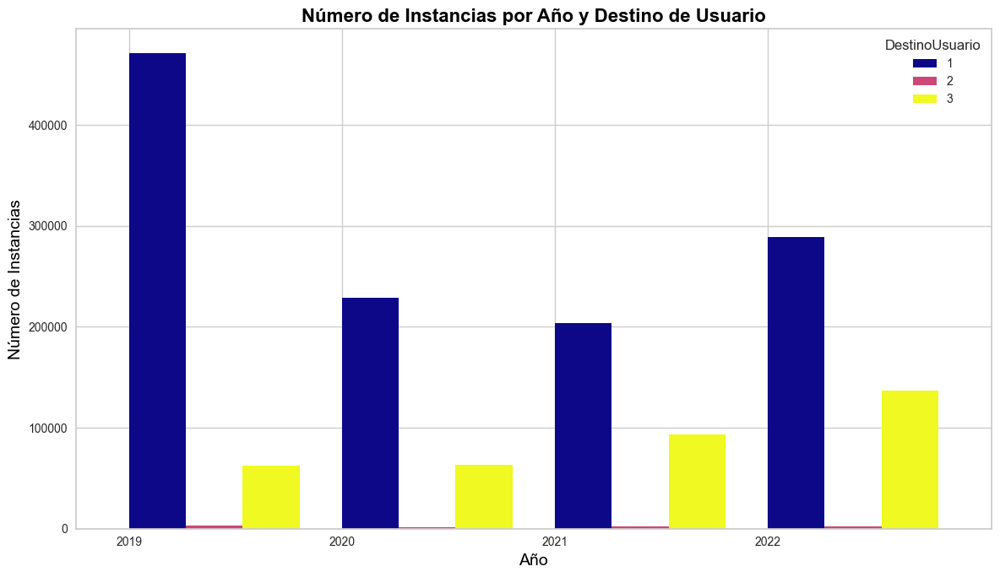

In [34]:
# Convertir 'FechaIngreso' a datetime
Preprocess_df['FechaIngreso'] = pd.to_datetime(Preprocess_df['FechaIngreso'], errors='coerce')

# Extraer el año de 'FechaIngreso'
Preprocess_df['Año'] = Preprocess_df['FechaIngreso'].dt.year

# Agrupar por año y destino de usuario, contando las instancias
destino_usuario_por_ano = Preprocess_df.groupby(['Año', 'DestinoUsuario']).size().unstack(fill_value=0)

# Crear la figura y los ejes
fig, ax = plt.subplots(figsize=(12, 7))

# Crear el gráfico de barras (sin apilar) con una paleta de colores diferente
destino_usuario_por_ano.plot(kind='bar', ax=ax, width=0.8, cmap='plasma', position=0)

# Agregar un título y etiquetas
ax.set_title('Número de Instancias por Año y Destino de Usuario', fontsize=16, fontweight='bold', color='black')
ax.set_xlabel('Año', fontsize=14, color='black')
ax.set_ylabel('Número de Instancias', fontsize=14, color='black')

# Mejorar la legibilidad de las etiquetas del eje X (rotación a 90 grados)
ax.tick_params(axis='x', rotation=0)

# Ajustar el espacio entre las barras para que se vea más claro
plt.tight_layout()

# Mostrar el gráfico
plt.show()


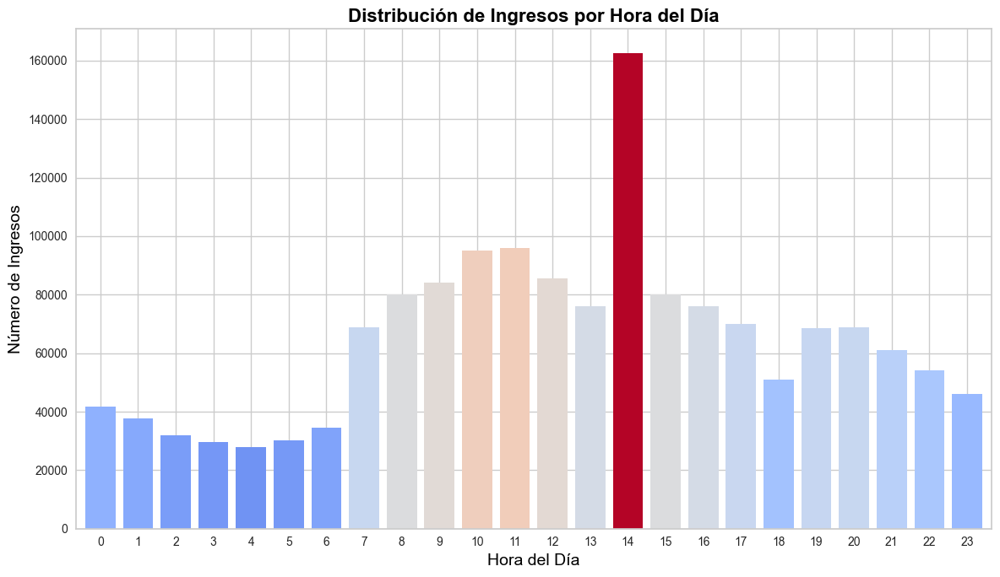

In [35]:
# Convertir 'HoraIngreso' a formato datetime y extraer la hora
Preprocess_df['HoraIngreso'] = pd.to_datetime(Preprocess_df['HoraIngreso'], errors='coerce')
Preprocess_df['Hora'] = Preprocess_df['HoraIngreso'].dt.hour

# Agrupar por hora y contar las instancias
ingresos_por_hora = Preprocess_df.groupby('Hora').size()

# Crear la figura y los ejes
fig, ax = plt.subplots(figsize=(12, 7))

# Crear el gráfico de barras con una paleta de colores diferente
ingresos_por_hora.plot(kind='bar', ax=ax, color=plt.cm.coolwarm(ingresos_por_hora / max(ingresos_por_hora)), width=0.8)

# Agregar un título y etiquetas
ax.set_title('Distribución de Ingresos por Hora del Día', fontsize=16, fontweight='bold', color='black')
ax.set_xlabel('Hora del Día', fontsize=14, color='black')
ax.set_ylabel('Número de Ingresos', fontsize=14, color='black')

# Mejorar la legibilidad de las etiquetas del eje X (rotación a 0 grados para horas)
ax.tick_params(axis='x', rotation=0)

# Ajustar el espacio entre las barras
plt.tight_layout()

# Mostrar el gráfico
plt.show()


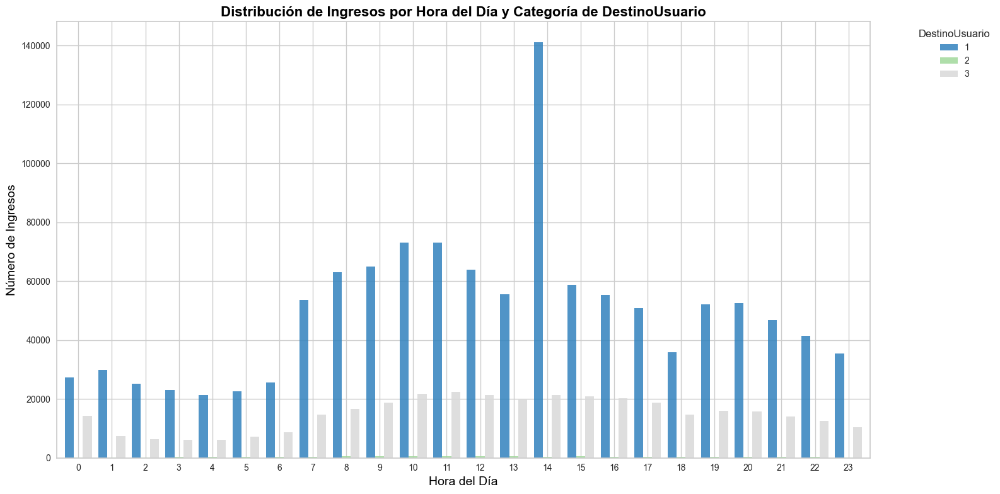

In [36]:
# Convertir 'HoraIngreso' a formato datetime y extraer la hora
Preprocess_df['HoraIngreso'] = pd.to_datetime(Preprocess_df['HoraIngreso'], errors='coerce')
Preprocess_df['Hora'] = Preprocess_df['HoraIngreso'].dt.hour

# Agrupar por hora y categoría de 'DestinoUsuario' y contar instancias
ingresos_por_hora_categoria = Preprocess_df.groupby(['Hora', 'DestinoUsuario']).size().unstack(fill_value=0)

# Crear la figura y los ejes
fig, ax = plt.subplots(figsize=(16, 8))

# Crear un gráfico de barras agrupadas
ingresos_por_hora_categoria.plot(kind='bar', ax=ax, width=0.8, colormap='tab20c', alpha=0.85)

# Agregar título y etiquetas
ax.set_title('Distribución de Ingresos por Hora del Día y Categoría de DestinoUsuario', fontsize=16, fontweight='bold', color='black')
ax.set_xlabel('Hora del Día', fontsize=14, color='black')
ax.set_ylabel('Número de Ingresos', fontsize=14, color='black')

# Rotar las etiquetas del eje X
ax.tick_params(axis='x', rotation=0)

# Agregar una leyenda bien posicionada
ax.legend(title='DestinoUsuario', bbox_to_anchor=(1.05, 1), loc='upper left')

# Ajustar el diseño para evitar superposición
plt.tight_layout()

# Mostrar el gráfico
plt.show()

### HoraSalida

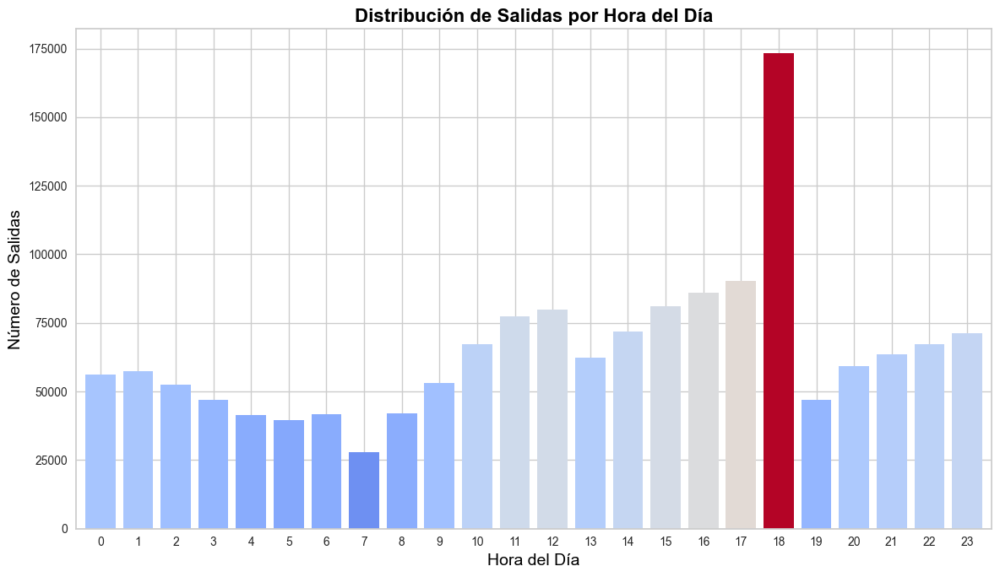

In [37]:
# Convertir 'HoraSalida' a formato datetime y extraer la hora
Preprocess_df['HoraSalida'] = pd.to_datetime(Preprocess_df['HoraSalida'], errors='coerce')
Preprocess_df['HoraSalidaHora'] = Preprocess_df['HoraSalida'].dt.hour

# Agrupar por hora y contar las instancias
salidas_por_hora = Preprocess_df.groupby('HoraSalidaHora').size()

# Crear la figura y los ejes
fig, ax = plt.subplots(figsize=(12, 7))

# Crear el gráfico de barras con una paleta de colores diferente
salidas_por_hora.plot(kind='bar', ax=ax, color=plt.cm.coolwarm(salidas_por_hora / max(salidas_por_hora)), width=0.8)

# Agregar un título y etiquetas
ax.set_title('Distribución de Salidas por Hora del Día', fontsize=16, fontweight='bold', color='black')
ax.set_xlabel('Hora del Día', fontsize=14, color='black')
ax.set_ylabel('Número de Salidas', fontsize=14, color='black')

# Mejorar la legibilidad de las etiquetas del eje X (rotación a 0 grados para horas)
ax.tick_params(axis='x', rotation=0)

# Ajustar el espacio entre las barras
plt.tight_layout()

# Mostrar el gráfico
plt.show()


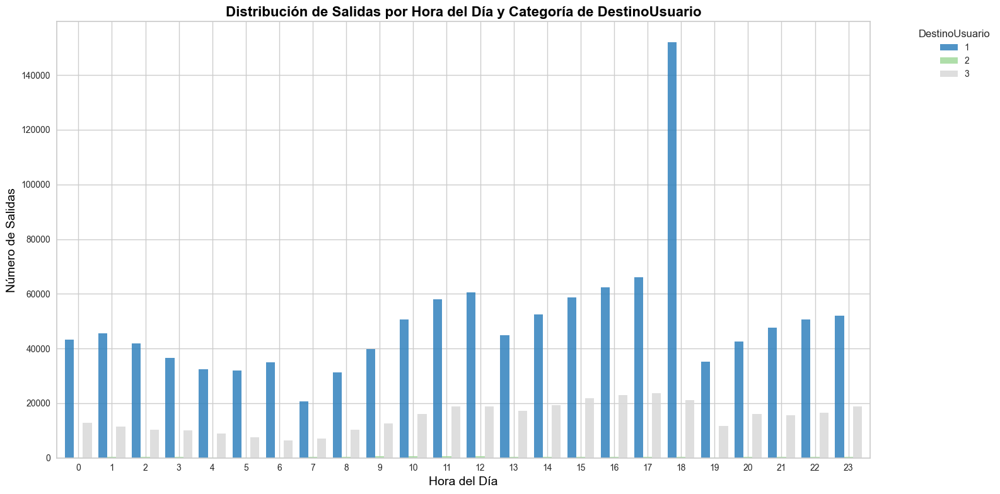

In [38]:
# Convertir 'HoraSalida' a formato datetime y extraer la hora
Preprocess_df['HoraSalida'] = pd.to_datetime(Preprocess_df['HoraSalida'], errors='coerce')
Preprocess_df['HoraSalidaHora'] = Preprocess_df['HoraSalida'].dt.hour

# Agrupar por hora y categoría de 'DestinoUsuario' y contar instancias
salidas_por_hora_categoria = Preprocess_df.groupby(['HoraSalidaHora', 'DestinoUsuario']).size().unstack(fill_value=0)

# Crear la figura y los ejes
fig, ax = plt.subplots(figsize=(16, 8))

# Crear un gráfico de barras agrupadas
salidas_por_hora_categoria.plot(kind='bar', ax=ax, width=0.8, colormap='tab20c', alpha=0.85)

# Agregar título y etiquetas
ax.set_title('Distribución de Salidas por Hora del Día y Categoría de DestinoUsuario', fontsize=16, fontweight='bold', color='black')
ax.set_xlabel('Hora del Día', fontsize=14, color='black')
ax.set_ylabel('Número de Salidas', fontsize=14, color='black')

# Rotar las etiquetas del eje X
ax.tick_params(axis='x', rotation=0)

# Agregar una leyenda bien posicionada
ax.legend(title='DestinoUsuario', bbox_to_anchor=(1.05, 1), loc='upper left')

# Ajustar el diseño para evitar superposición
plt.tight_layout()

# Mostrar el gráfico
plt.show()


### Análisis Edad

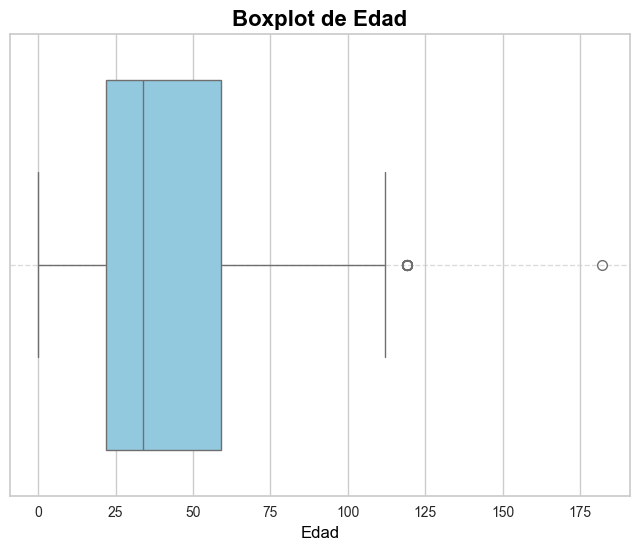

In [39]:
# Crear el boxplot
plt.figure(figsize=(8, 6))  # Tamaño del gráfico
sns.boxplot(data=Preprocess_df, x='Edad', color='skyblue')

# Personalización del gráfico
plt.title('Boxplot de Edad', fontsize=16, fontweight='bold', color='black')
plt.xlabel('Edad', fontsize=12, color='black')
plt.grid(axis='y', linestyle='--', alpha=0.7)

# Mostrar el gráfico
plt.show()

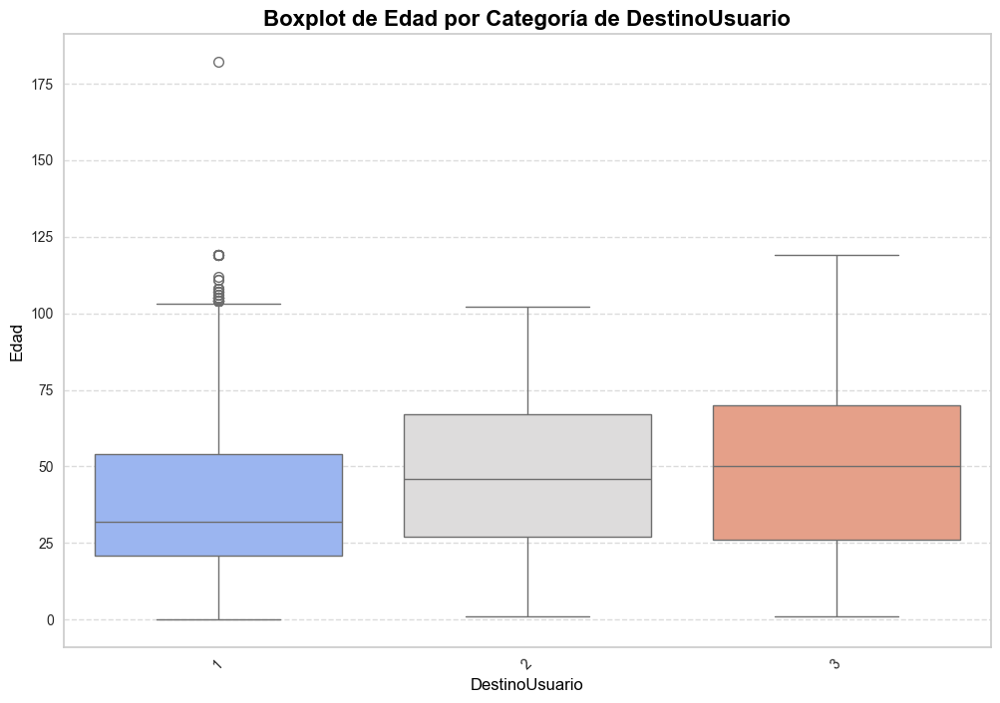

In [40]:
# Crear el boxplot por categoría de 'DestinoUsuario'
plt.figure(figsize=(12, 8))  # Tamaño del gráfico
sns.boxplot(data=Preprocess_df, x='DestinoUsuario', y='Edad', palette='coolwarm')

# Personalización del gráfico
plt.title('Boxplot de Edad por Categoría de DestinoUsuario', fontsize=16, fontweight='bold', color='black')
plt.xlabel('DestinoUsuario', fontsize=12, color='black')
plt.ylabel('Edad', fontsize=12, color='black')
plt.grid(axis='y', linestyle='--', alpha=0.7)

# Rotar las etiquetas del eje x si son muchas categorías
plt.xticks(rotation=45)

# Mostrar el gráfico
plt.show()


In [41]:
# Función para aplicar el método de Tukey a cada grupo
def tukey_outlier_treatment(group):
    Q1 = group['Edad'].quantile(0.25)  # Primer cuartil
    Q3 = group['Edad'].quantile(0.75)  # Tercer cuartil
    IQR = Q3 - Q1  # Rango intercuartílico
    lower_bound = Q1 - 1.5 * IQR  # Límite inferior
    upper_bound = Q3 + 1.5 * IQR  # Límite superior
    group['Edad'] = group['Edad'].clip(lower=lower_bound, upper=upper_bound)  # Ajustar valores
    return group

# Aplicar el método de Tukey a cada categoría de 'DestinoUsuario'
Preprocess_df = Preprocess_df.groupby('DestinoUsuario').apply(tukey_outlier_treatment)

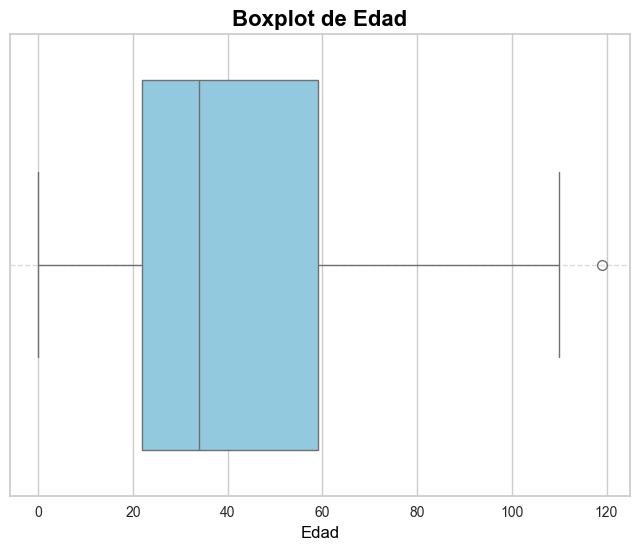

In [42]:
# Crear el boxplot
plt.figure(figsize=(8, 6))  # Tamaño del gráfico
sns.boxplot(data=Preprocess_df, x='Edad', color='skyblue')

# Personalización del gráfico
plt.title('Boxplot de Edad', fontsize=16, fontweight='bold', color='black')
plt.xlabel('Edad', fontsize=12, color='black')
plt.grid(axis='y', linestyle='--', alpha=0.7)

# Mostrar el gráfico
plt.show()

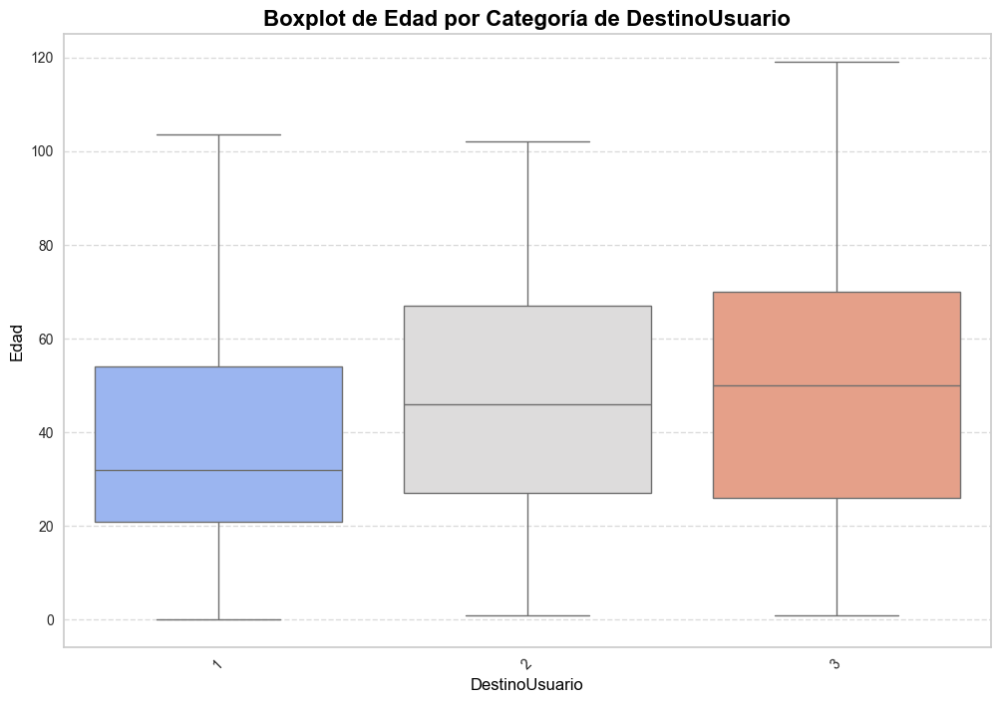

In [43]:
# Crear el boxplot por categoría de 'DestinoUsuario'
plt.figure(figsize=(12, 8))  # Tamaño del gráfico
sns.boxplot(data=Preprocess_df, x='DestinoUsuario', y='Edad', palette='coolwarm')

# Personalización del gráfico
plt.title('Boxplot de Edad por Categoría de DestinoUsuario', fontsize=16, fontweight='bold', color='black')
plt.xlabel('DestinoUsuario', fontsize=12, color='black')
plt.ylabel('Edad', fontsize=12, color='black')
plt.grid(axis='y', linestyle='--', alpha=0.7)

# Rotar las etiquetas del eje x si son muchas categorías
plt.xticks(rotation=45)

# Mostrar el gráfico
plt.show()

In [44]:
# Preprocess_df = Preprocess_df.drop(columns='DestinoUsuario')

In [45]:
Preprocess_df.info()

<class 'pandas.core.frame.DataFrame'>
MultiIndex: 1557277 entries, (1, 1) to (3, 1557266)
Data columns (total 55 columns):
 #   Column                                    Non-Null Count    Dtype         
---  ------                                    --------------    -----         
 0   NumeroFactura                             1557277 non-null  object        
 1   Ano                                       1557277 non-null  int64         
 2   FechaIngreso                              1557277 non-null  datetime64[ns]
 3   HoraIngreso                               1557277 non-null  datetime64[ns]
 4   FechaSalida                               1557277 non-null  object        
 5   HoraSalida                                1557277 non-null  datetime64[ns]
 6   cod_unificado                             1557277 non-null  int64         
 7   CodigoPrestador                           1557277 non-null  int64         
 8   Nombre prestador                          1557277 non-null  object      

### Sexo

In [46]:
Preprocess_df = Preprocess_df[Preprocess_df['Sexo']!='I']

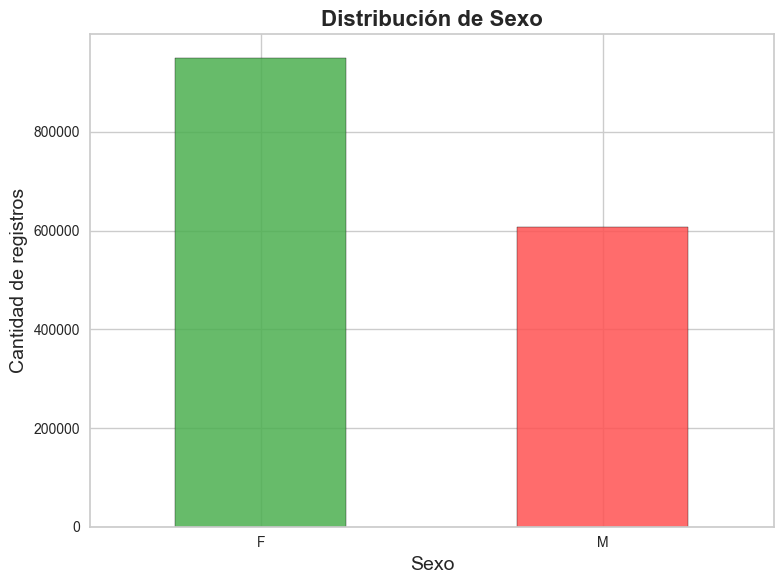

In [47]:
# Agrupar datos por 'Sexo' y contar ocurrencias
festivo_counts = Preprocess_df['Sexo'].value_counts()

# Crear el gráfico de barras
fig, ax = plt.subplots(figsize=(8, 6))
festivo_counts.plot(kind='bar', color=['#4CAF50', '#FF5252'], alpha=0.85, edgecolor='black', ax=ax)

# Agregar título y etiquetas
ax.set_title('Distribución de Sexo', fontsize=16, fontweight='bold')
ax.set_xlabel('Sexo', fontsize=14)
ax.set_ylabel('Cantidad de registros', fontsize=14)
ax.tick_params(axis='x', rotation=0)

# Ajustar el diseño
plt.tight_layout()
plt.show()

### Causa Externa

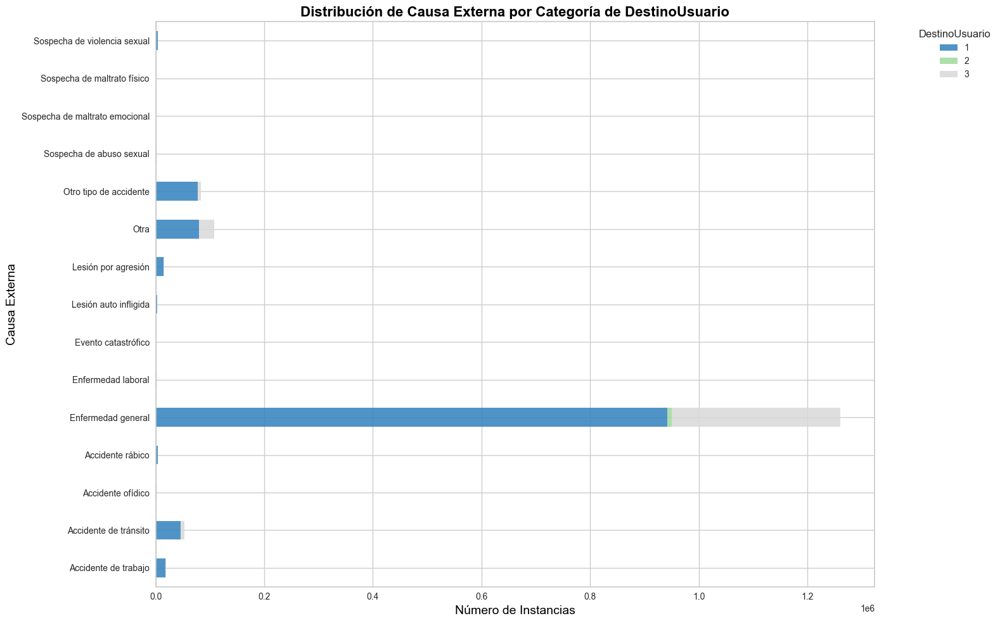

In [48]:
# Crear un diccionario para mapear códigos a descripciones
causa_externa_labels = {
    1: "Accidente de trabajo",
    2: "Accidente de tránsito",
    3: "Accidente rábico",
    4: "Accidente ofídico",
    5: "Otro tipo de accidente",
    6: "Evento catastrófico",
    7: "Lesión por agresión",
    8: "Lesión auto infligida",
    9: "Sospecha de maltrato físico",
    10: "Sospecha de abuso sexual",
    11: "Sospecha de violencia sexual",
    12: "Sospecha de maltrato emocional",
    13: "Enfermedad general",
    14: "Enfermedad laboral",
    15: "Otra"
}

Preprocess_df_reset = Preprocess_df.copy()
Preprocess_df_reset = Preprocess_df_reset.drop(columns='DestinoUsuario')

# Mapear las etiquetas de CausaExterna
Preprocess_df_reset['CausaExterna'] = Preprocess_df['CausaExterna'].map(causa_externa_labels)

# Agrupar por 'CausaExterna' y 'DestinoUsuario' y contar instancias
causa_externa_destino = Preprocess_df_reset.groupby(['CausaExterna', 'DestinoUsuario']).size().unstack(fill_value=0)

# Crear la figura y los ejes
fig, ax = plt.subplots(figsize=(16, 10))

# Crear un gráfico de barras apiladas horizontales
causa_externa_destino.plot(kind='barh', ax=ax, stacked=True, colormap='tab20c', alpha=0.85)

# Agregar título y etiquetas
ax.set_title('Distribución de Causa Externa por Categoría de DestinoUsuario', fontsize=16, fontweight='bold', color='black')
ax.set_xlabel('Número de Instancias', fontsize=14, color='black')
ax.set_ylabel('Causa Externa', fontsize=14, color='black')

# Agregar una leyenda bien posicionada
ax.legend(title='DestinoUsuario', bbox_to_anchor=(1.05, 1), loc='upper left')

# Ajustar el diseño para evitar superposición
plt.tight_layout()

# Mostrar el gráfico
plt.show()

### Zona Residencia

In [49]:
# Filtrar las filas donde 'ZonaResidencia' sea 'U' o 'R'
Preprocess_df = Preprocess_df[Preprocess_df['ZonaResidencia'].isin(['U', 'R'])]

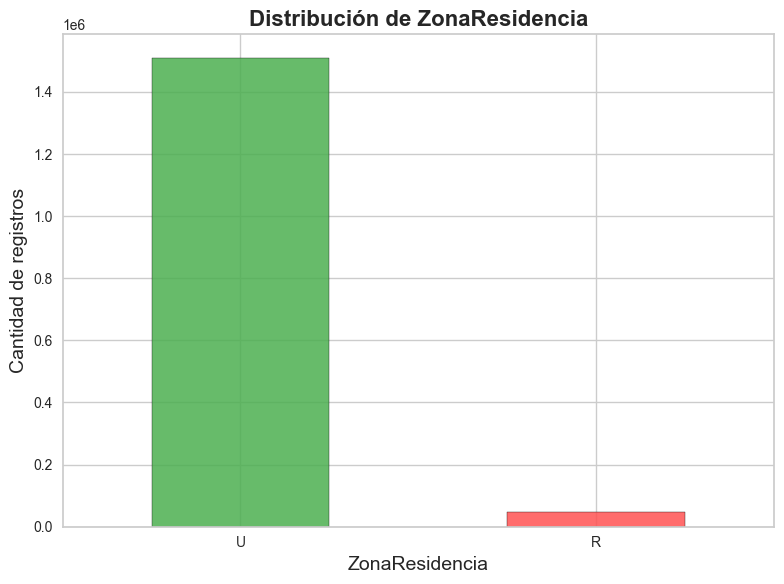

In [50]:
# Agrupar datos por 'ZonaResidencia' y contar ocurrencias
zona_counts = Preprocess_df['ZonaResidencia'].value_counts()

# Crear el gráfico de barras
fig, ax = plt.subplots(figsize=(8, 6))
zona_counts.plot(kind='bar', color=['#4CAF50', '#FF5252'], alpha=0.85, edgecolor='black', ax=ax)

# Agregar título y etiquetas
ax.set_title('Distribución de ZonaResidencia', fontsize=16, fontweight='bold')
ax.set_xlabel('ZonaResidencia', fontsize=14)
ax.set_ylabel('Cantidad de registros', fontsize=14)
ax.tick_params(axis='x', rotation=0)

# Ajustar el diseño
plt.tight_layout()
plt.show()

### ClasificaciónSalida

In [51]:
# Agrupar por la columna 'ClasificaciónSalida' y contar las instancias
clasificacion_counts = Preprocess_df['ClasificaciónSalida'].value_counts().reset_index()
clasificacion_counts.columns = ['ClasificaciónSalida', 'cantidad_instancias']

# Ordenar de mayor a menor
clasificacion_counts = clasificacion_counts.sort_values(by='cantidad_instancias', ascending=False)

# Calcular el porcentaje acumulado
clasificacion_counts['percent'] = clasificacion_counts['cantidad_instancias'] / clasificacion_counts['cantidad_instancias'].sum() * 100
clasificacion_counts['percent_cum'] = clasificacion_counts['percent'].cumsum()

In [52]:
.

SyntaxError: invalid syntax (1933637684.py, line 1)

In [53]:
# Crear el gráfico de Pareto (barras + línea acumulada)
fig = go.Figure()

# Agregar las barras
fig.add_trace(go.Bar(
    x=clasificacion_counts['ClasificaciónSalida'],
    y=clasificacion_counts['cantidad_instancias'],
    name='Cantidad de Instancias',
    marker_color='blue'
))

# Agregar la línea del porcentaje acumulado
fig.add_trace(go.Scatter(
    x=clasificacion_counts['ClasificaciónSalida'],
    y=clasificacion_counts['percent_cum'],
    name='Porcentaje Acumulado',
    mode='lines+markers',
    yaxis='y2',  # Usamos un segundo eje Y para el porcentaje
    marker_color='red',
    line=dict(color='red', width=2)
))

# Configuración del gráfico
fig.update_layout(
    title='Gráfico de Pareto: Frecuencia de Instancias por Clasificación',
    xaxis_title='ClasificaciónSalida',
    yaxis_title='Cantidad de Instancias',
    yaxis=dict(
        tickmode='linear',
        dtick=1,  # Incrementos adecuados para los datos actuales
    ),
    yaxis2=dict(
        title='Porcentaje Acumulado',
        overlaying='y',
        side='right',
        range=[0, 100]
    ),
    barmode='stack',
    xaxis_tickangle=-45,
    template='plotly_white',
    width=1500,  # Establecer el ancho de la gráfica
    height=800   # Establecer la altura de la gráfica
)

# Mostrar el gráfico
fig.show()

In [54]:
clasificacion_counts[clasificacion_counts['percent_cum']<=80]

,ClasificaciónSalida,cantidad_instancias,percent,percent_cum
0,Lesiones traumáticas,185301,11.899062,11.899062
1,Signos y síntomas generales,110066,7.067863,18.966926
2,Signos y síntomas digestivos,100253,6.437724,25.404649
3,Infección respiratoria aguda,68005,4.366926,29.771575
4,Trastorno urinario,64043,4.112507,33.884082
5,Complicación del trabajo de parto,62840,4.035256,37.919339
6,Enfermedad digestiva,48270,3.099647,41.018986
7,Enfermedad musculoesquelética,42456,2.726303,43.745288
8,Signos y síntomas neurológicos,40922,2.627797,46.373085
9,Enfermedad pulmonar obstructiva crónica,36606,2.350646,48.723731


In [55]:
# clasificacion_counts.to_excel('C:/Users/Johan/Downloads/clasificacion_salida.xlsx', index=False)

In [56]:
salida_clasificado_df = pd.read_excel('data/motivoSalida_reclasificado.xlsx')

In [57]:
Preprocess_df_3 = pd.merge(Preprocess_df, salida_clasificado_df, on='ClasificaciónSalida', how='left')

In [58]:
Preprocess_df_3.isnull().sum()

NumeroFactura                                    0
Ano                                              0
FechaIngreso                                     0
HoraIngreso                                      0
FechaSalida                                      0
HoraSalida                                       0
cod_unificado                                    0
CodigoPrestador                                  0
Nombre prestador                                 0
Prestador:publica/privada                        0
Tipo Prestador                                   0
CodMunicipio                                     0
Municipio                                        0
Clasifiación casos municipio                     0
CodDepto                                         0
Departamento                                     0
Region_departamento                              0
Cobertura servicios básicos departamento         0
CausaExterna                                     0
CodigoDiagnosticoPrincipalSalid

In [59]:
Preprocess_df_3 = Preprocess_df_3.rename(columns={'Categoria':'ReClasificaciónSalida'})

In [60]:
.

SyntaxError: invalid syntax (1933637684.py, line 1)

In [62]:
# Agrupar por la columna 'ReClasificaciónSalida' y contar las instancias
clasificacion_counts = Preprocess_df_3['ReClasificaciónSalida'].value_counts().reset_index()
clasificacion_counts.columns = ['ReClasificaciónSalida', 'cantidad_instancias']

# Ordenar de mayor a menor
clasificacion_counts = clasificacion_counts.sort_values(by='cantidad_instancias', ascending=False)

# Calcular el porcentaje acumulado
clasificacion_counts['percent'] = clasificacion_counts['cantidad_instancias'] / clasificacion_counts['cantidad_instancias'].sum() * 100
clasificacion_counts['percent_cum'] = clasificacion_counts['percent'].cumsum()

In [63]:
# Crear el gráfico de Pareto (barras + línea acumulada)
fig = go.Figure()

# Agregar las barras
fig.add_trace(go.Bar(
    x=clasificacion_counts['ReClasificaciónSalida'],
    y=clasificacion_counts['cantidad_instancias'],
    name='Cantidad de Instancias',
    marker_color='blue'
))

# Agregar la línea del porcentaje acumulado
fig.add_trace(go.Scatter(
    x=clasificacion_counts['ReClasificaciónSalida'],
    y=clasificacion_counts['percent_cum'],
    name='Porcentaje Acumulado',
    mode='lines+markers',
    yaxis='y2',  # Usamos un segundo eje Y para el porcentaje
    marker_color='red',
    line=dict(color='red', width=2)
))

# Configuración del gráfico
fig.update_layout(
    title='Gráfico de Pareto: Frecuencia de Instancias por Clasificación',
    xaxis_title='ReClasificaciónSalida',
    yaxis_title='Cantidad de Instancias',
    yaxis=dict(
        tickmode='linear',
        dtick=1,  # Incrementos adecuados para los datos actuales
    ),
    yaxis2=dict(
        title='Porcentaje Acumulado',
        overlaying='y',
        side='right',
        range=[0, 100]
    ),
    barmode='stack',
    xaxis_tickangle=-45,
    template='plotly_white',
    width=1500,  # Establecer el ancho de la gráfica
    height=800   # Establecer la altura de la gráfica
)

# Mostrar el gráfico
fig.show()

In [64]:
Preprocess_df = Preprocess_df_3.copy()

### Tipo usuario

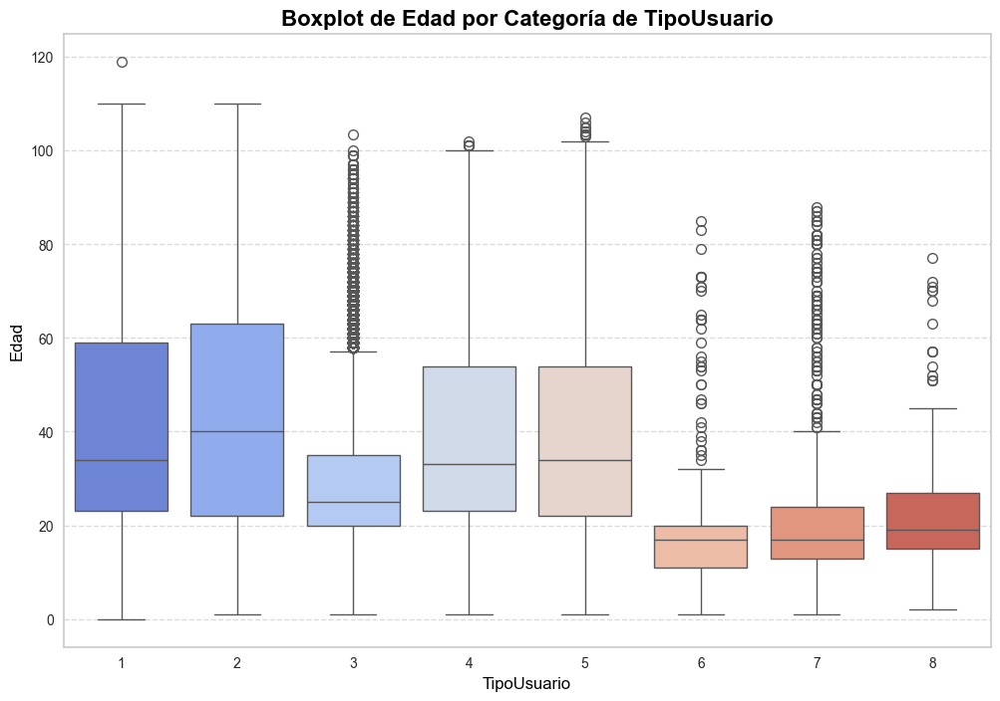

In [65]:
# Crear el boxplot por categoría de 'TipoUsuario'
plt.figure(figsize=(12, 8))  # Tamaño del gráfico
sns.boxplot(data=Preprocess_df, x='TipoUsuario', y='Edad', palette='coolwarm')

# Personalización del gráfico
plt.title('Boxplot de Edad por Categoría de TipoUsuario', fontsize=16, fontweight='bold', color='black')
plt.xlabel('TipoUsuario', fontsize=12, color='black')
plt.ylabel('Edad', fontsize=12, color='black')
plt.grid(axis='y', linestyle='--', alpha=0.7)

# Rotar las etiquetas del eje x si son muchas categorías
plt.xticks(rotation=0)

# Mostrar el gráfico
plt.show()

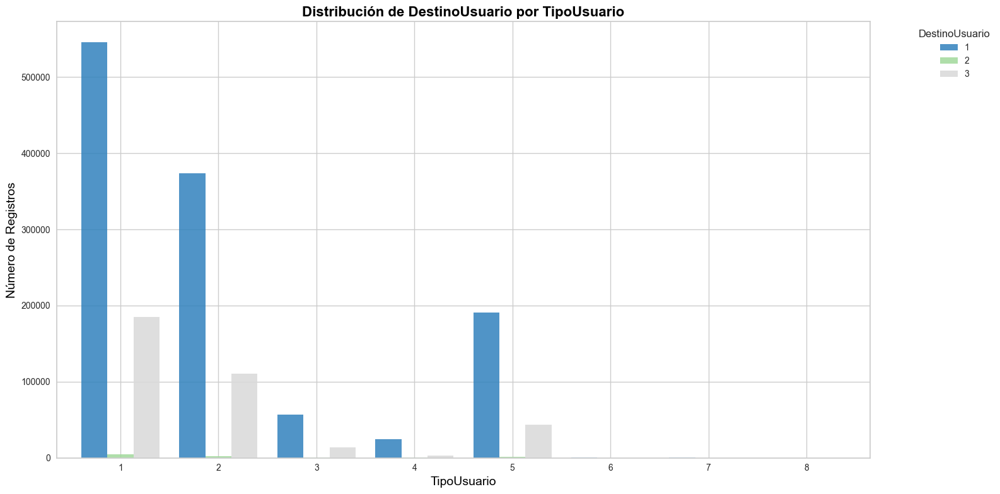

In [66]:
# Agrupar los datos para el análisis
data_grouped = Preprocess_df.groupby(['TipoUsuario', 'DestinoUsuario']).size().unstack()

# Crear la figura y los ejes
fig, ax = plt.subplots(figsize=(16, 8))

# Crear un gráfico de barras agrupadas
data_grouped.plot(kind='bar', ax=ax, width=0.8, colormap='tab20c', alpha=0.85)

# Agregar título y etiquetas
ax.set_title('Distribución de DestinoUsuario por TipoUsuario', fontsize=16, fontweight='bold', color='black')
ax.set_xlabel('TipoUsuario', fontsize=14, color='black')
ax.set_ylabel('Número de Registros', fontsize=14, color='black')

# Rotar las etiquetas del eje X
ax.tick_params(axis='x', rotation=0)

# Agregar una leyenda bien posicionada
ax.legend(title='DestinoUsuario', bbox_to_anchor=(1.05, 1), loc='upper left')

# Ajustar el diseño para evitar superposición
plt.tight_layout()

# Mostrar el gráfico
plt.show()


In [67]:
Preprocess_df.columns

Index(['NumeroFactura', 'Ano', 'FechaIngreso', 'HoraIngreso', 'FechaSalida',
       'HoraSalida', 'cod_unificado', 'CodigoPrestador', 'Nombre prestador',
       'Prestador:publica/privada', 'Tipo Prestador', 'CodMunicipio',
       'Municipio', 'Clasifiación casos municipio', 'CodDepto', 'Departamento',
       'Region_departamento', 'Cobertura servicios básicos departamento',
       'CausaExterna', 'CodigoDiagnosticoPrincipalSalida',
       'CodigoDiagnosticoRelN1Salida', 'CodigoDiagnosticoRelN2Salida',
       'CodigoDiagnosticoRelN3Salida', 'DestinoUsuario', 'EstadoSalida',
       'CausaBasicaMuerteUrgencias', 'CodigoEAPB', 'TipoUsuario', 'Edad',
       'UnidadMedidaEdad', 'Sexo', 'ZonaResidencia',
       'Prestador:1.publica/0.privada', 'CausaExternaNueva', 'nom_ase',
       'count', 'Clasificación aseguradora', 'TpoUsuario_nuevo', 'Año', 'Hora',
       'HoraSalidaHora', 'TiempoDeEstancia horas', 'Es festivo (S/N)',
       'Es víspera (S/N)', 'Día Laborable', 'Día de la semana', 'Mes'

### TpoUsuario_nuevo

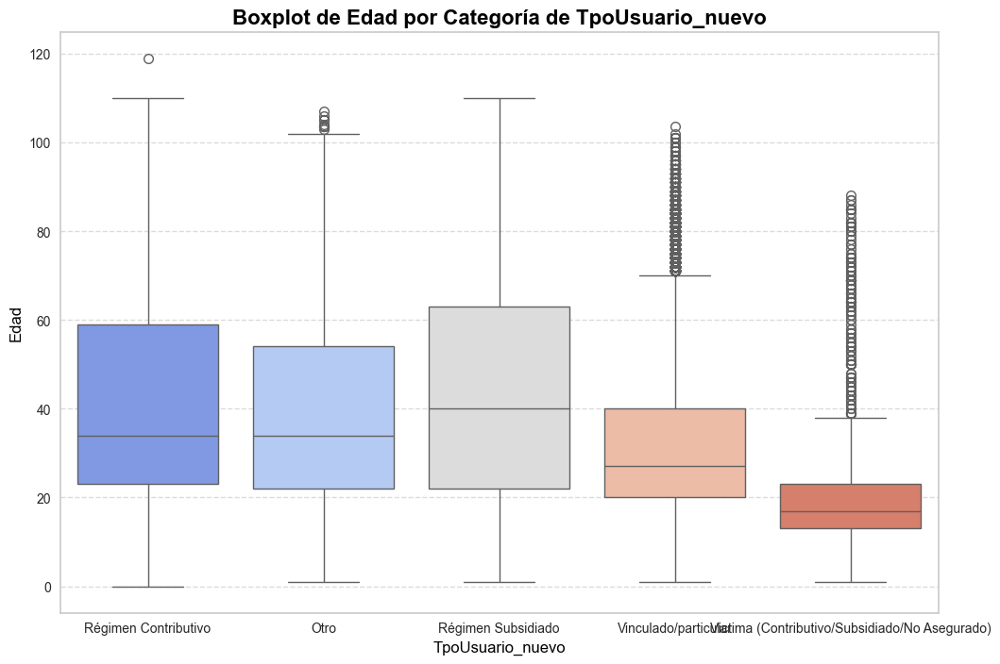

In [68]:
# Crear el boxplot por categoría de 'TpoUsuario_nuevo'
plt.figure(figsize=(12, 8))  # Tamaño del gráfico
sns.boxplot(data=Preprocess_df, x='TpoUsuario_nuevo', y='Edad', palette='coolwarm')

# Personalización del gráfico
plt.title('Boxplot de Edad por Categoría de TpoUsuario_nuevo', fontsize=16, fontweight='bold', color='black')
plt.xlabel('TpoUsuario_nuevo', fontsize=12, color='black')
plt.ylabel('Edad', fontsize=12, color='black')
plt.grid(axis='y', linestyle='--', alpha=0.7)

# Rotar las etiquetas del eje x si son muchas categorías
plt.xticks(rotation=0)

# Mostrar el gráfico
plt.show()

### 

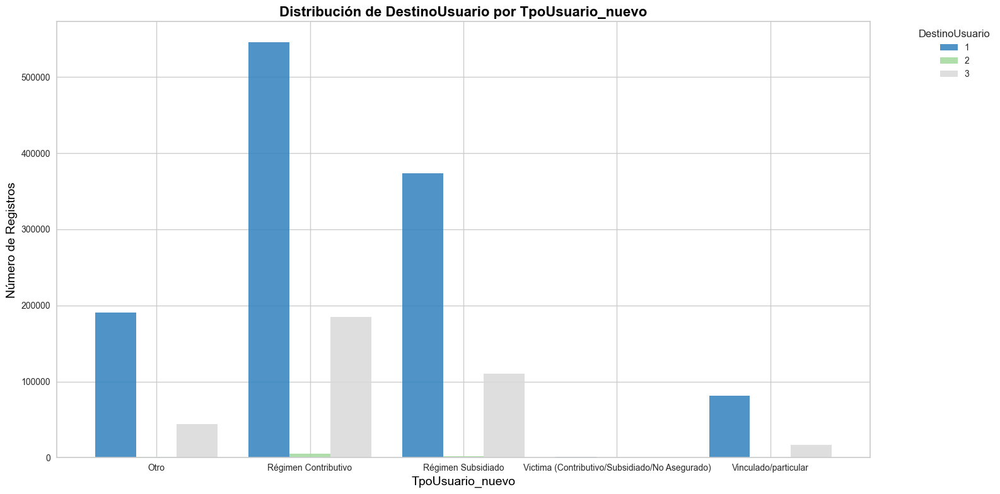

In [69]:
# Agrupar los datos para el análisis
data_grouped = Preprocess_df.groupby(['TpoUsuario_nuevo', 'DestinoUsuario']).size().unstack()

# Crear la figura y los ejes
fig, ax = plt.subplots(figsize=(16, 8))

# Crear un gráfico de barras agrupadas
data_grouped.plot(kind='bar', ax=ax, width=0.8, colormap='tab20c', alpha=0.85)

# Agregar título y etiquetas
ax.set_title('Distribución de DestinoUsuario por TpoUsuario_nuevo', fontsize=16, fontweight='bold', color='black')
ax.set_xlabel('TpoUsuario_nuevo', fontsize=14, color='black')
ax.set_ylabel('Número de Registros', fontsize=14, color='black')

# Rotar las etiquetas del eje X
ax.tick_params(axis='x', rotation=0)

# Agregar una leyenda bien posicionada
ax.legend(title='DestinoUsuario', bbox_to_anchor=(1.05, 1), loc='upper left')

# Ajustar el diseño para evitar superposición
plt.tight_layout()

# Mostrar el gráfico
plt.show()


### Estado Salida

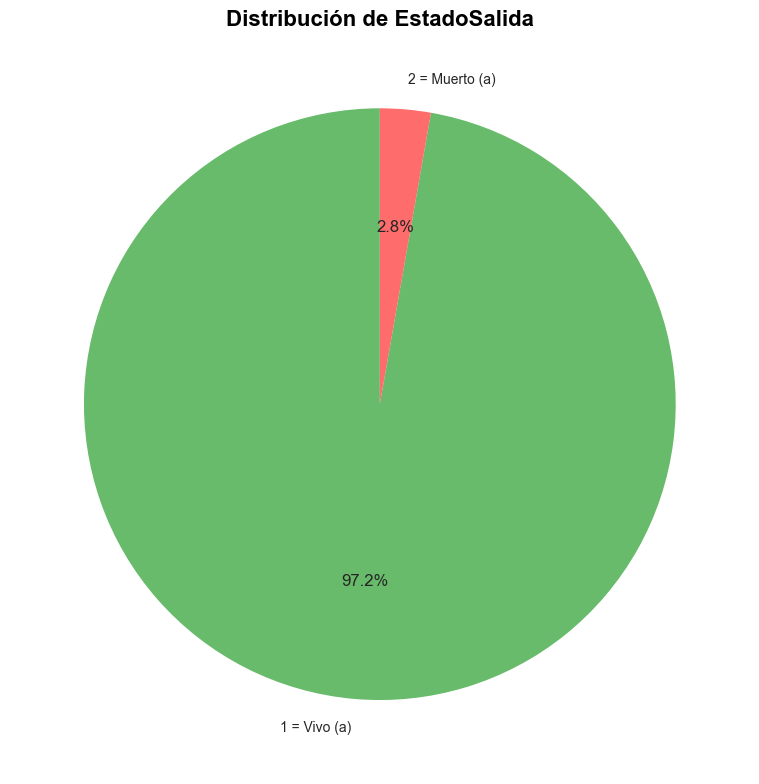

In [70]:
# Agrupar los datos por 'EstadoSalida' para contar ocurrencias
estado_salida_counts = Preprocess_df['EstadoSalida'].value_counts()

# Crear etiquetas personalizadas para el gráfico
labels = ['1 = Vivo (a)', '2 = Muerto (a)']

# Crear un gráfico de pastel
fig, ax = plt.subplots(figsize=(8, 8))
ax.pie(
    estado_salida_counts,
    labels=labels,
    autopct='%1.1f%%',  # Mostrar porcentaje en las secciones
    startangle=90,      # Iniciar el gráfico desde el ángulo 90
    colors=['#4CAF50', '#FF5252'],  # Colores personalizados
    wedgeprops={'alpha': 0.85}  # Transparencia de las secciones
)

# Agregar un título
ax.set_title('Distribución de EstadoSalida', fontsize=16, fontweight='bold', color='black')

# Mostrar el gráfico
plt.tight_layout()
plt.show()

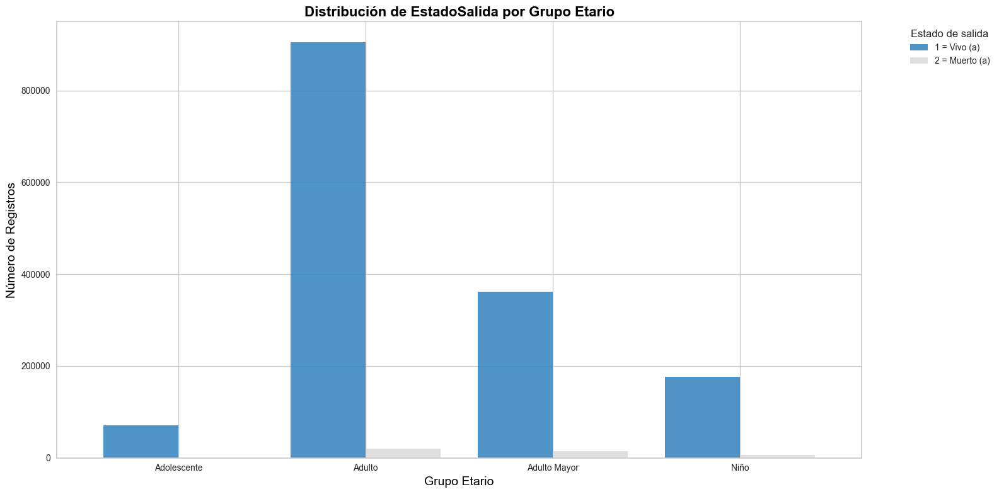

In [71]:
# Agrupar los datos por 'Grupo etario' y 'EstadoSalida' para contar ocurrencias
data_grouped = Preprocess_df.groupby(['Grupo etario', 'EstadoSalida']).size().unstack()

# Crear la figura y los ejes
fig, ax = plt.subplots(figsize=(16, 8))

# Crear un gráfico de barras agrupadas
data_grouped.plot(kind='bar', ax=ax, width=0.8, colormap='tab20c', alpha=0.85)

# Asignar etiquetas personalizadas para la leyenda
custom_labels = ['1 = Vivo (a)', '2 = Muerto (a)']
ax.legend(custom_labels, title='Estado de salida', bbox_to_anchor=(1.05, 1), loc='upper left')

# Agregar título y etiquetas
ax.set_title('Distribución de EstadoSalida por Grupo Etario', fontsize=16, fontweight='bold', color='black')
ax.set_xlabel('Grupo Etario', fontsize=14, color='black')
ax.set_ylabel('Número de Registros', fontsize=14, color='black')

# Rotar las etiquetas del eje X
ax.tick_params(axis='x', rotation=0)

# Ajustar el diseño para evitar superposición
plt.tight_layout()

# Mostrar el gráfico
plt.show()


### Tiempo De Estancia horas

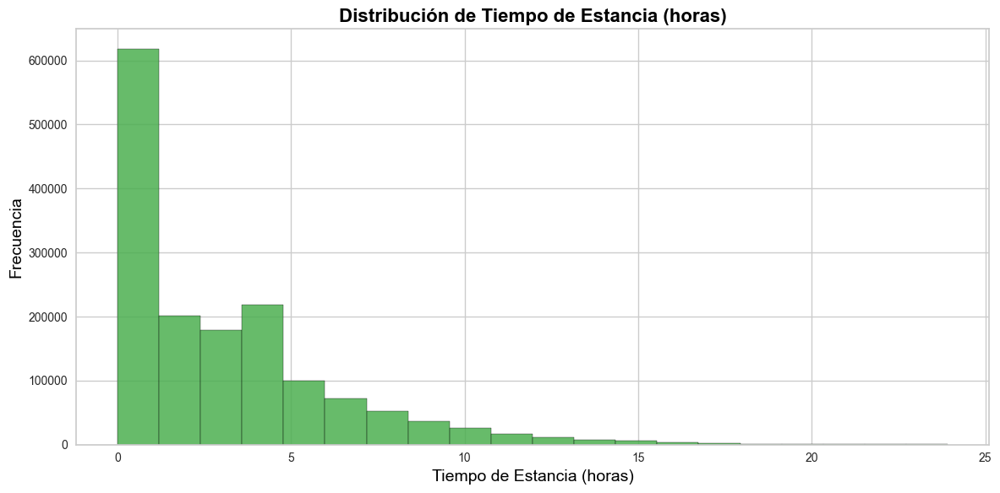

In [72]:
# Crear un histograma para 'TiempoDeEstancia horas'
fig, ax = plt.subplots(figsize=(12, 6))

# Dibujar el histograma
Preprocess_df['TiempoDeEstancia horas'].plot(
    kind='hist',
    bins=20,  # Número de bins (intervalos)
    color='#4CAF50',  # Color del histograma
    alpha=0.85,  # Transparencia
    edgecolor='black',  # Color del borde de las barras
    ax=ax
)

# Agregar título y etiquetas
ax.set_title('Distribución de Tiempo de Estancia (horas)', fontsize=16, fontweight='bold', color='black')
ax.set_xlabel('Tiempo de Estancia (horas)', fontsize=14, color='black')
ax.set_ylabel('Frecuencia', fontsize=14, color='black')

# Ajustar el diseño para evitar superposición
plt.tight_layout()

# Mostrar el gráfico
plt.show()


### Es festivo (S/N)

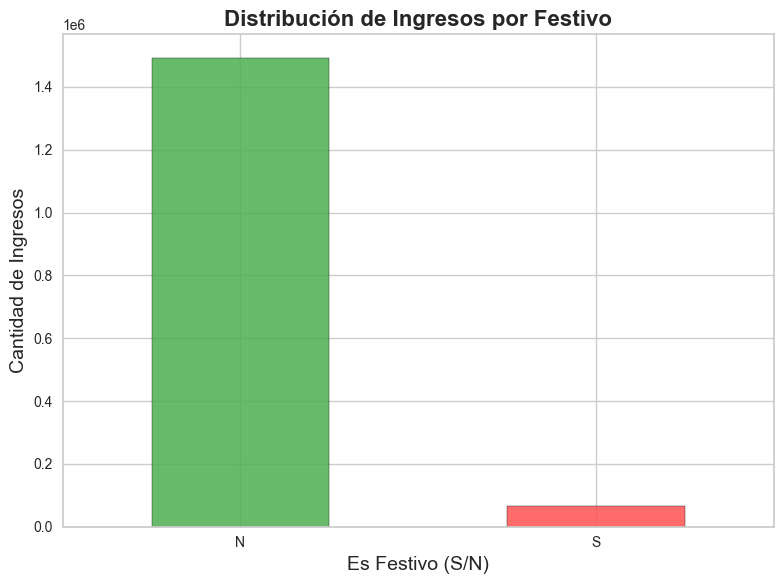

In [73]:
# Agrupar datos por 'Es festivo (S/N)' y contar ocurrencias
festivo_counts = Preprocess_df['Es festivo (S/N)'].value_counts()

# Crear el gráfico de barras
fig, ax = plt.subplots(figsize=(8, 6))
festivo_counts.plot(kind='bar', color=['#4CAF50', '#FF5252'], alpha=0.85, edgecolor='black', ax=ax)

# Agregar título y etiquetas
ax.set_title('Distribución de Ingresos por Festivo', fontsize=16, fontweight='bold')
ax.set_xlabel('Es Festivo (S/N)', fontsize=14)
ax.set_ylabel('Cantidad de Ingresos', fontsize=14)
ax.tick_params(axis='x', rotation=0)

# Ajustar el diseño
plt.tight_layout()
plt.show()



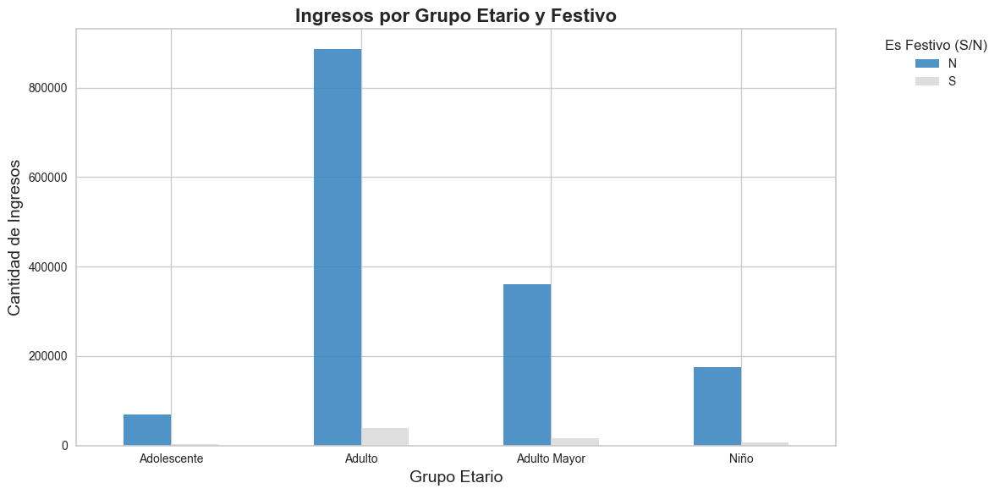

In [74]:
# Agrupar datos por 'Grupo etario' y 'Es festivo (S/N)'
grouped_data = Preprocess_df.groupby(['Grupo etario', 'Es festivo (S/N)']).size().unstack()

# Crear el gráfico de barras agrupadas
fig, ax = plt.subplots(figsize=(12, 6))
grouped_data.plot(kind='bar', ax=ax, colormap='tab20c', alpha=0.85)

# Agregar título y etiquetas
ax.set_title('Ingresos por Grupo Etario y Festivo', fontsize=16, fontweight='bold')
ax.set_xlabel('Grupo Etario', fontsize=14)
ax.set_ylabel('Cantidad de Ingresos', fontsize=14)
ax.legend(title='Es Festivo (S/N)', bbox_to_anchor=(1.05, 1), loc='upper left')
ax.tick_params(axis='x', rotation=0)

# Ajustar el diseño
plt.tight_layout()
plt.show()


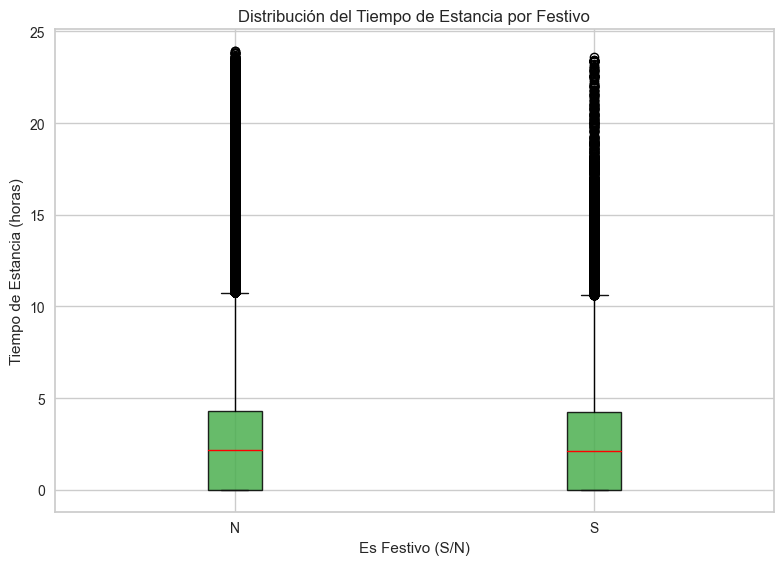

In [75]:
# Crear el box plot
fig, ax = plt.subplots(figsize=(8, 6))
Preprocess_df.boxplot(
    column='TiempoDeEstancia horas',
    by='Es festivo (S/N)',
    patch_artist=True,
    boxprops=dict(facecolor='#4CAF50', alpha=0.85),
    medianprops=dict(color='red'),
    ax=ax
)

# Agregar título y etiquetas
ax.set_title('Distribución del Tiempo de Estancia por Festivo')
ax.set_xlabel('Es Festivo (S/N)')
ax.set_ylabel('Tiempo de Estancia (horas)')
plt.suptitle('')  # Eliminar el título automático del box plot
plt.tight_layout()
plt.show()

### Es víspera (S/N)

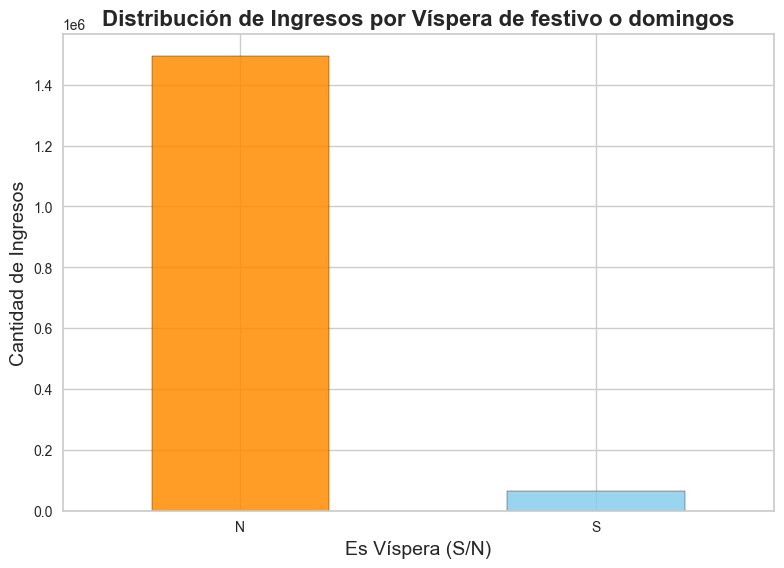

In [76]:
# Agrupar datos por 'Es víspera (S/N)' y contar ocurrencias
vispera_counts = Preprocess_df['Es víspera (S/N)'].value_counts()

# Crear el gráfico de barras
fig, ax = plt.subplots(figsize=(8, 6))
vispera_counts.plot(kind='bar', color=['#FF8C00', '#87CEEB'], alpha=0.85, edgecolor='black', ax=ax)

# Agregar título y etiquetas
ax.set_title('Distribución de Ingresos por Víspera de festivo o domingos', fontsize=16, fontweight='bold')
ax.set_xlabel('Es Víspera (S/N)', fontsize=14)
ax.set_ylabel('Cantidad de Ingresos', fontsize=14)
ax.tick_params(axis='x', rotation=0)

# Ajustar el diseño
plt.tight_layout()
plt.show()


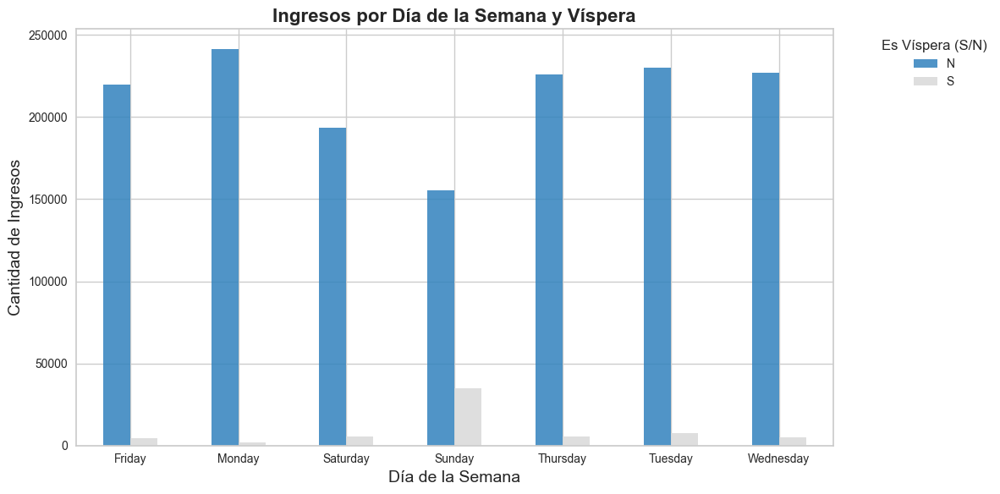

In [77]:
# Agrupar datos por 'Día de la semana' y 'Es víspera (S/N)'
grouped_data = Preprocess_df.groupby(['Día de la semana', 'Es víspera (S/N)']).size().unstack()

# Crear el gráfico de barras agrupadas
fig, ax = plt.subplots(figsize=(12, 6))
grouped_data.plot(kind='bar', ax=ax, colormap='tab20c', alpha=0.85)

# Agregar título y etiquetas
ax.set_title('Ingresos por Día de la Semana y Víspera', fontsize=16, fontweight='bold')
ax.set_xlabel('Día de la Semana', fontsize=14)
ax.set_ylabel('Cantidad de Ingresos', fontsize=14)
ax.legend(title='Es Víspera (S/N)', bbox_to_anchor=(1.05, 1), loc='upper left')
ax.tick_params(axis='x', rotation=0)

# Ajustar el diseño
plt.tight_layout()
plt.show()

### Día Laborable

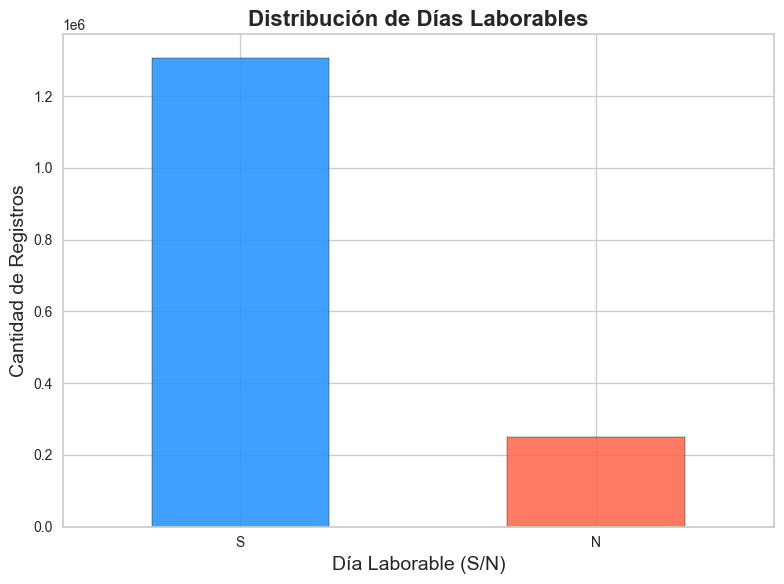

In [78]:
# Agrupar datos por 'Día Laborable' y contar ocurrencias
laborable_counts = Preprocess_df['Día Laborable'].value_counts()

# Crear el gráfico de barras
fig, ax = plt.subplots(figsize=(8, 6))
laborable_counts.plot(kind='bar', color=['#1E90FF', '#FF6347'], alpha=0.85, edgecolor='black', ax=ax)

# Agregar título y etiquetas
ax.set_title('Distribución de Días Laborables', fontsize=16, fontweight='bold')
ax.set_xlabel('Día Laborable (S/N)', fontsize=14)
ax.set_ylabel('Cantidad de Registros', fontsize=14)
ax.tick_params(axis='x', rotation=0)

# Ajustar el diseño
plt.tight_layout()
plt.show()

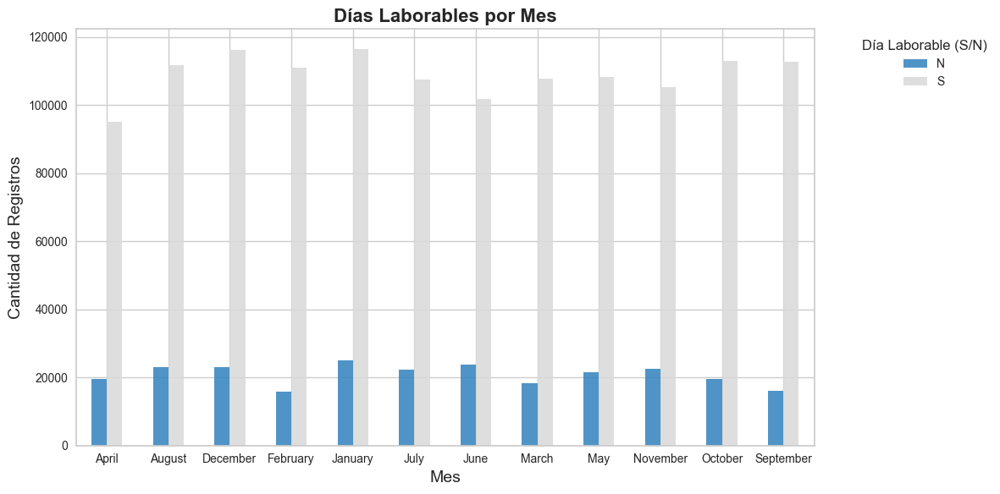

In [79]:
# Agrupar datos por 'Mes' y 'Día Laborable'
grouped_data = Preprocess_df.groupby(['Mes', 'Día Laborable']).size().unstack()

# Crear el gráfico de barras agrupadas
fig, ax = plt.subplots(figsize=(12, 6))
grouped_data.plot(kind='bar', ax=ax, colormap='tab20c', alpha=0.85)

# Agregar título y etiquetas
ax.set_title('Días Laborables por Mes', fontsize=16, fontweight='bold')
ax.set_xlabel('Mes', fontsize=14)
ax.set_ylabel('Cantidad de Registros', fontsize=14)
ax.legend(title='Día Laborable (S/N)', bbox_to_anchor=(1.05, 1), loc='upper left')
ax.tick_params(axis='x', rotation=0)

# Ajustar el diseño
plt.tight_layout()
plt.show()

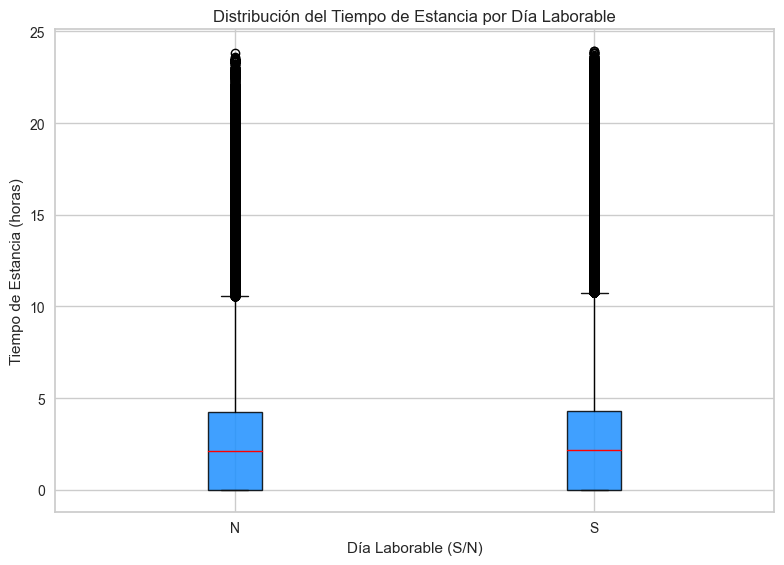

In [80]:
# Crear el box plot
fig, ax = plt.subplots(figsize=(8, 6))
Preprocess_df.boxplot(
    column='TiempoDeEstancia horas',
    by='Día Laborable',
    patch_artist=True,
    boxprops=dict(facecolor='#1E90FF', alpha=0.85),
    medianprops=dict(color='red'),
    ax=ax
)

# Agregar título y etiquetas
ax.set_title('Distribución del Tiempo de Estancia por Día Laborable')
ax.set_xlabel('Día Laborable (S/N)')
ax.set_ylabel('Tiempo de Estancia (horas)')
plt.suptitle('')  # Eliminar el título automático del box plot
plt.tight_layout()
plt.show()

### Día de la semana

In [81]:
Preprocess_df['Día de la semana'].value_counts()

Día de la semana
Monday       243241
Tuesday      237591
Wednesday    232083
Thursday     231380
Friday       224229
Saturday     198783
Sunday       189967
Name: count, dtype: int64

In [82]:
# Crear un diccionario para traducir los días de la semana del inglés al español
dias_mapping = {
    'Monday': 'Lunes', 'Tuesday': 'Martes', 'Wednesday': 'Miércoles',
    'Thursday': 'Jueves', 'Friday': 'Viernes', 'Saturday': 'Sábado', 'Sunday': 'Domingo'
}

# Reemplazar los valores en la columna 'Día de la semana' por sus traducciones al español
Preprocess_df['Día de la semana'] = Preprocess_df['Día de la semana'].map(dias_mapping)

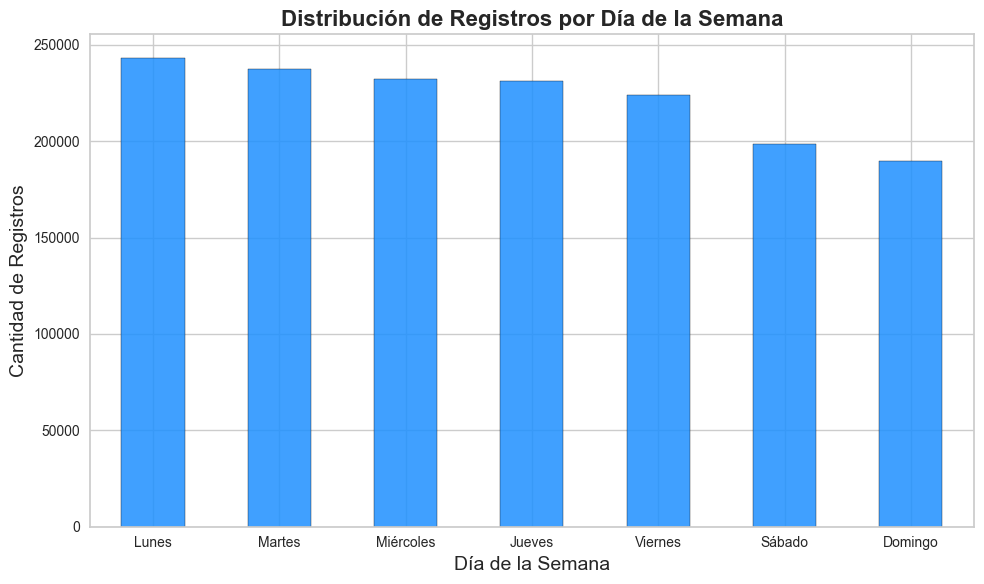

In [83]:
# Crear una lista con el orden deseado de los días de la semana en español
orden_dias = ['Lunes', 'Martes', 'Miércoles', 'Jueves', 'Viernes', 'Sábado', 'Domingo']

# Contar ocurrencias por día de la semana y reordenar según la lista
semana_counts = Preprocess_df['Día de la semana'].value_counts()
semana_counts = semana_counts.reindex(orden_dias)

# Crear el gráfico de barras
fig, ax = plt.subplots(figsize=(10, 6))
semana_counts.plot(kind='bar', color='#1E90FF', alpha=0.85, edgecolor='black', ax=ax)

# Agregar título y etiquetas
ax.set_title('Distribución de Registros por Día de la Semana', fontsize=16, fontweight='bold')
ax.set_xlabel('Día de la Semana', fontsize=14)
ax.set_ylabel('Cantidad de Registros', fontsize=14)

# Rotar las etiquetas del eje X para mayor claridad
ax.tick_params(axis='x', rotation=0)

# Ajustar el diseño
plt.tight_layout()
plt.show()



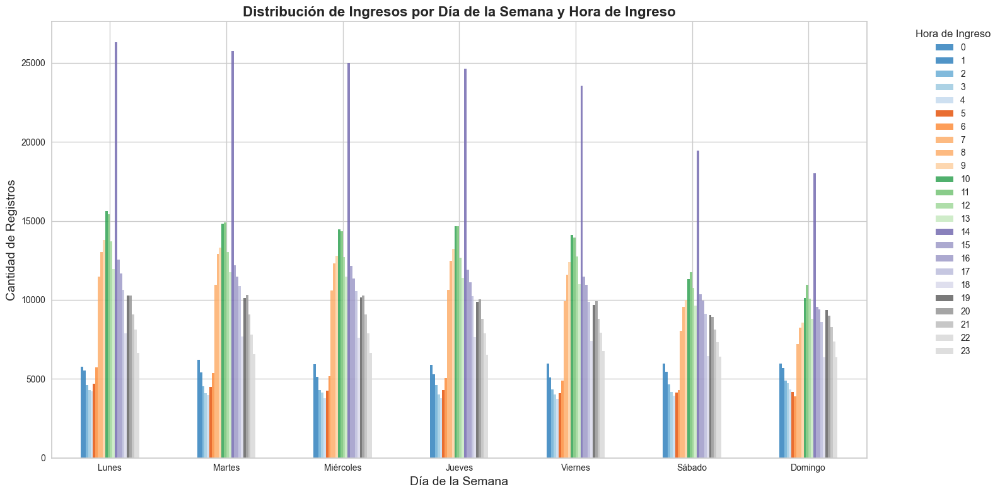

In [84]:
# Crear una lista con el orden deseado de los días de la semana en español
orden_dias = ['Lunes', 'Martes', 'Miércoles', 'Jueves', 'Viernes', 'Sábado', 'Domingo']

# Agrupar los datos por 'Día de la semana' y 'Hora'
grouped_data = Preprocess_df.groupby(['Día de la semana', 'Hora']).size().unstack()

# Reindexar las filas del DataFrame para asegurar el orden correcto
grouped_data = grouped_data.reindex(orden_dias)

# Crear el gráfico de barras agrupadas
fig, ax = plt.subplots(figsize=(16, 8))
grouped_data.plot(kind='bar', stacked=False, colormap='tab20c', alpha=0.85, ax=ax)

# Agregar título y etiquetas
ax.set_title('Distribución de Ingresos por Día de la Semana y Hora de Ingreso', fontsize=16, fontweight='bold')
ax.set_xlabel('Día de la Semana', fontsize=14)
ax.set_ylabel('Cantidad de Registros', fontsize=14)
ax.legend(title='Hora de Ingreso', bbox_to_anchor=(1.05, 1), loc='upper left')

# Rotar las etiquetas del eje X para mayor claridad
ax.tick_params(axis='x', rotation=0)

# Ajustar el diseño
plt.tight_layout()
plt.show()


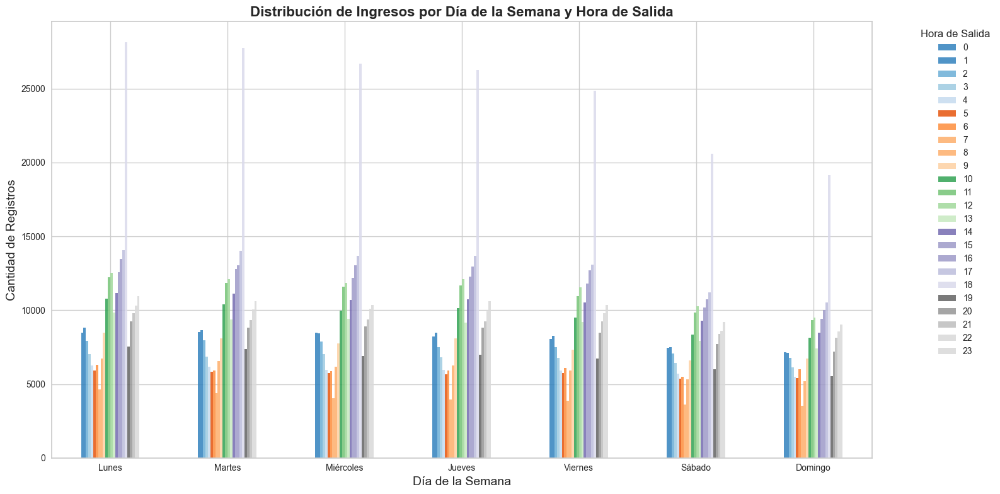

In [85]:
# Crear una lista con el orden deseado de los días de la semana en español
orden_dias = ['Lunes', 'Martes', 'Miércoles', 'Jueves', 'Viernes', 'Sábado', 'Domingo']

# Agrupar los datos por 'Día de la semana' y 'HoraSalidaHora'
grouped_data = Preprocess_df.groupby(['Día de la semana', 'HoraSalidaHora']).size().unstack()

# Reindexar las filas del DataFrame para asegurar el orden correcto de los días
grouped_data = grouped_data.reindex(orden_dias)

# Crear el gráfico de barras agrupadas
fig, ax = plt.subplots(figsize=(16, 8))
grouped_data.plot(kind='bar', stacked=False, colormap='tab20c', alpha=0.85, ax=ax)

# Agregar título y etiquetas
ax.set_title('Distribución de Ingresos por Día de la Semana y Hora de Salida', fontsize=16, fontweight='bold')
ax.set_xlabel('Día de la Semana', fontsize=14)
ax.set_ylabel('Cantidad de Registros', fontsize=14)
ax.legend(title='Hora de Salida', bbox_to_anchor=(1.05, 1), loc='upper left')

# Rotar las etiquetas del eje X para mejor legibilidad
ax.tick_params(axis='x', rotation=0)

# Ajustar el diseño
plt.tight_layout()
plt.show()

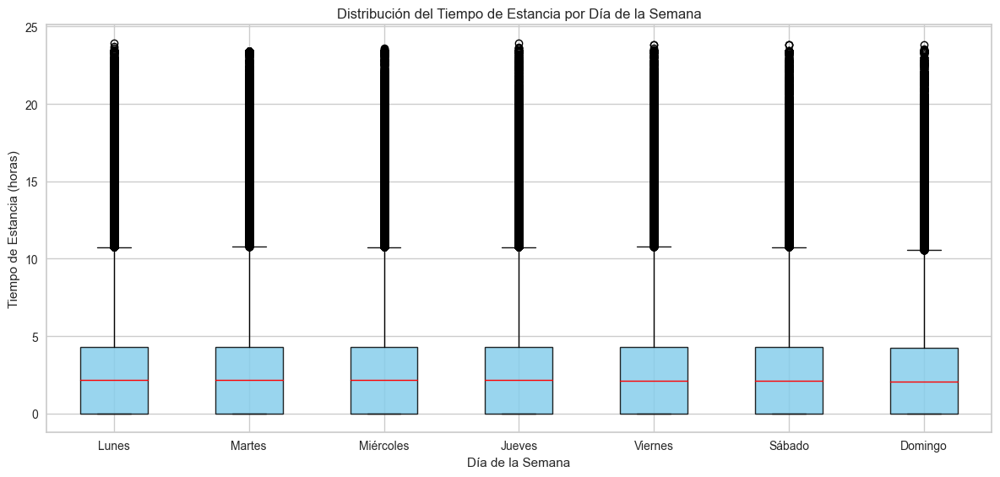

In [86]:
# Crear una lista con el orden deseado de los días de la semana en español
orden_dias = ['Lunes', 'Martes', 'Miércoles', 'Jueves', 'Viernes', 'Sábado', 'Domingo']

# Reordenar el DataFrame según el orden deseado
Preprocess_df['Día de la semana'] = pd.Categorical(
    Preprocess_df['Día de la semana'], categories=orden_dias, ordered=True
)

# Crear el box plot
fig, ax = plt.subplots(figsize=(12, 6))
Preprocess_df.boxplot(
    column='TiempoDeEstancia horas',
    by='Día de la semana',
    patch_artist=True,
    boxprops=dict(facecolor='#87CEEB', alpha=0.85),
    medianprops=dict(color='red'),
    ax=ax
)

# Agregar título y etiquetas
ax.set_title('Distribución del Tiempo de Estancia por Día de la Semana')
ax.set_xlabel('Día de la Semana')
ax.set_ylabel('Tiempo de Estancia (horas)')
plt.suptitle('')  # Eliminar el título automático del box plot
plt.tight_layout()
plt.show()

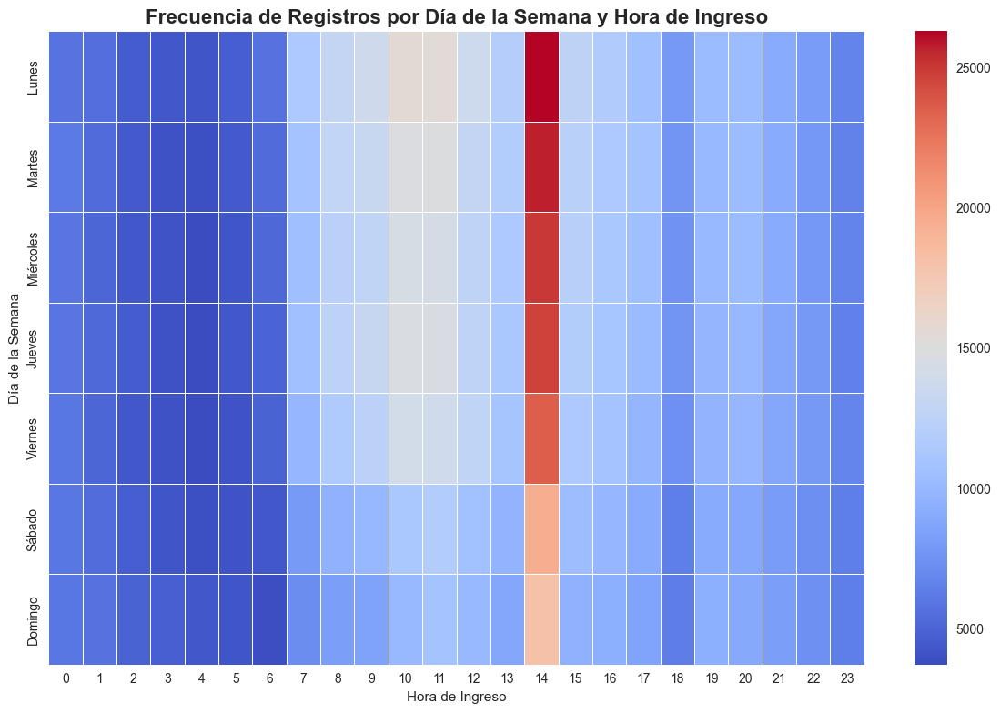

In [87]:
# Crear una lista con el orden deseado de los días de la semana en español
orden_dias = ['Lunes', 'Martes', 'Miércoles', 'Jueves', 'Viernes', 'Sábado', 'Domingo']

# Reindexar la tabla cruzada con el orden deseado
heatmap_data = Preprocess_df.pivot_table(index='Día de la semana', columns='Hora', aggfunc='size', fill_value=0)
heatmap_data = heatmap_data.reindex(orden_dias)

# Crear el heatmap
plt.figure(figsize=(12, 8))
sns.heatmap(heatmap_data, cmap='coolwarm', linewidths=.5)

# Agregar título y etiquetas
plt.title('Frecuencia de Registros por Día de la Semana y Hora de Ingreso', fontsize=16, fontweight='bold')
plt.xlabel('Hora de Ingreso')
plt.ylabel('Día de la Semana')

# Ajustar el diseño
plt.tight_layout()
plt.show()


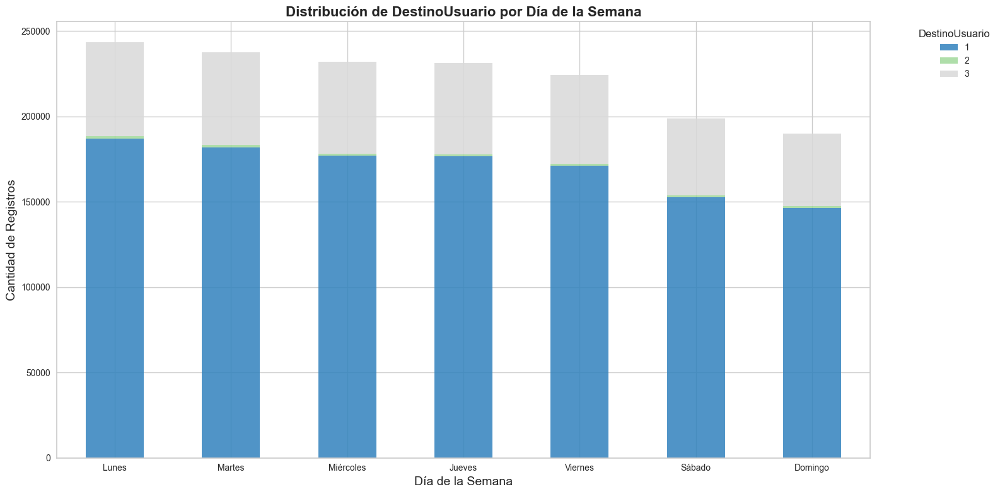

In [88]:
# Crear una lista con el orden deseado de los días de la semana en español
orden_dias = ['Lunes', 'Martes', 'Miércoles', 'Jueves', 'Viernes', 'Sábado', 'Domingo']

# Agrupar los datos por 'Día de la semana' y 'DestinoUsuario'
grouped_data = Preprocess_df.groupby(['Día de la semana', 'DestinoUsuario']).size().unstack()

# Reindexar las filas del DataFrame para asegurar el orden correcto
grouped_data = grouped_data.reindex(orden_dias)

# Crear el gráfico de barras apiladas
fig, ax = plt.subplots(figsize=(16, 8))
grouped_data.plot(kind='bar', stacked=True, colormap='tab20c', alpha=0.85, ax=ax)

# Agregar título y etiquetas
ax.set_title('Distribución de DestinoUsuario por Día de la Semana', fontsize=16, fontweight='bold')
ax.set_xlabel('Día de la Semana', fontsize=14)
ax.set_ylabel('Cantidad de Registros', fontsize=14)
ax.legend(title='DestinoUsuario', bbox_to_anchor=(1.05, 1), loc='upper left')

# Rotar las etiquetas del eje X para mayor legibilidad
ax.tick_params(axis='x', rotation=0)

# Ajustar el diseño
plt.tight_layout()
plt.show()


### Mes

In [89]:
Preprocess_df['Mes'].value_counts()

Mes
January      141614
December     139281
August       134716
October      132511
July         129924
May          129775
September    128862
November     127776
February     126593
March        126032
June         125527
April        114663
Name: count, dtype: int64

In [90]:
# Crear un diccionario para traducir los nombres de los meses del inglés al español
mes_mapping = {
    'January': 'Enero', 'February': 'Febrero', 'March': 'Marzo', 'April': 'Abril',
    'May': 'Mayo', 'June': 'Junio', 'July': 'Julio', 'August': 'Agosto',
    'September': 'Septiembre', 'October': 'Octubre', 'November': 'Noviembre', 'December': 'Diciembre'
}

# Reemplazar los nombres de los meses en inglés por español en la columna 'Mes'
Preprocess_df['Mes'] = Preprocess_df['Mes'].map(mes_mapping)

In [91]:
Preprocess_df['Mes'].value_counts()

Mes
Enero         141614
Diciembre     139281
Agosto        134716
Octubre       132511
Julio         129924
Mayo          129775
Septiembre    128862
Noviembre     127776
Febrero       126593
Marzo         126032
Junio         125527
Abril         114663
Name: count, dtype: int64

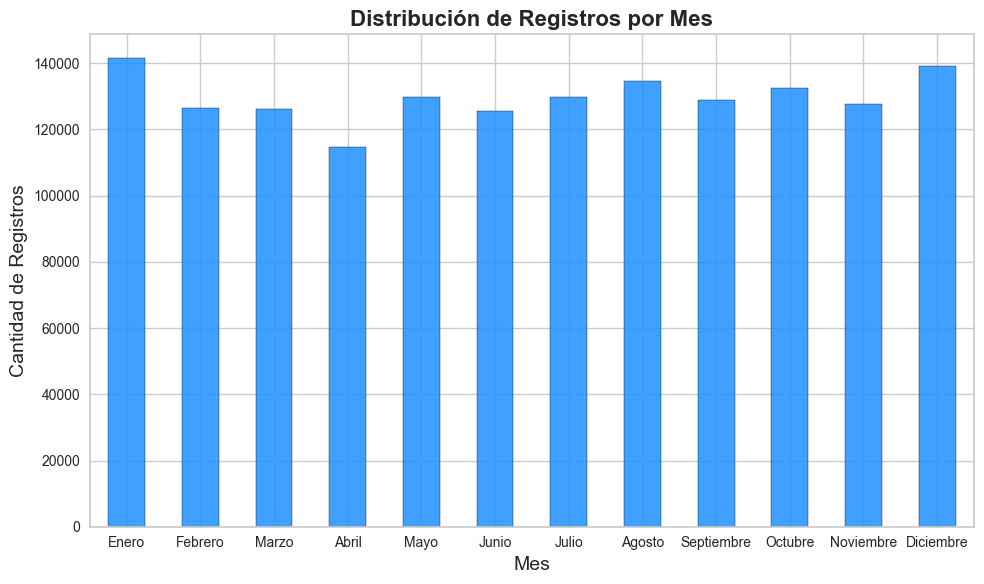

In [92]:
# Crear una lista con el orden deseado de los meses en español
orden_meses = ['Enero', 'Febrero', 'Marzo', 'Abril', 'Mayo', 'Junio', 
               'Julio', 'Agosto', 'Septiembre', 'Octubre', 'Noviembre', 'Diciembre']

# Contar ocurrencias por mes y ordenar según la lista
mes_counts = Preprocess_df['Mes'].value_counts()
mes_counts = mes_counts.reindex(orden_meses)

# Crear el gráfico de barras
fig, ax = plt.subplots(figsize=(10, 6))
mes_counts.plot(kind='bar', color='#1E90FF', alpha=0.85, edgecolor='black', ax=ax)

# Agregar título y etiquetas
ax.set_title('Distribución de Registros por Mes', fontsize=16, fontweight='bold')
ax.set_xlabel('Mes', fontsize=14)
ax.set_ylabel('Cantidad de Registros', fontsize=14)

# Rotar las etiquetas del eje X para mejor legibilidad
ax.tick_params(axis='x', rotation=0)

# Ajustar el diseño
plt.tight_layout()
plt.show()

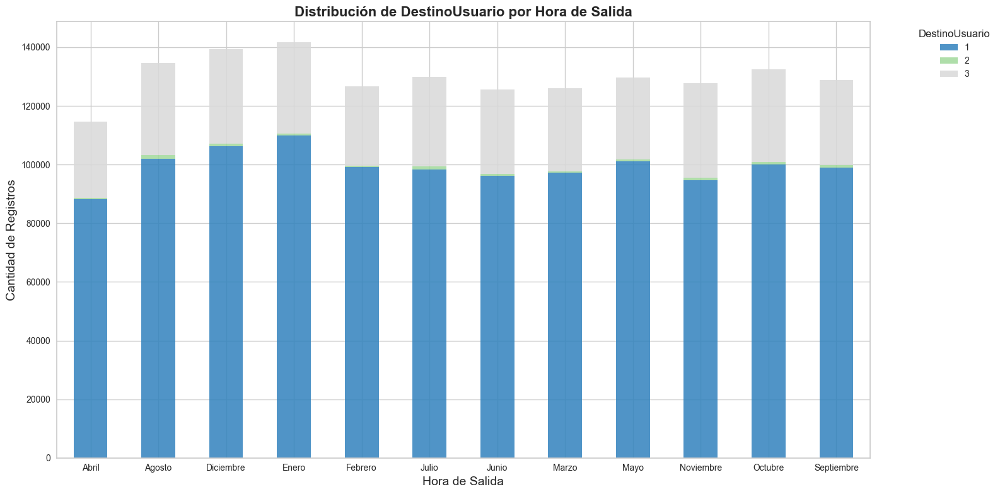

In [93]:
# Agrupar los datos por 'Mes' y 'DestinoUsuario'
grouped_data = Preprocess_df.groupby(['Mes', 'DestinoUsuario']).size().unstack()

# Crear el gráfico de barras apiladas
fig, ax = plt.subplots(figsize=(16, 8))
grouped_data.plot(kind='bar', stacked=True, colormap='tab20c', alpha=0.85, ax=ax)

# Agregar título y etiquetas
ax.set_title('Distribución de DestinoUsuario por Hora de Salida', fontsize=16, fontweight='bold')
ax.set_xlabel('Hora de Salida', fontsize=14)
ax.set_ylabel('Cantidad de Registros', fontsize=14)
ax.legend(title='DestinoUsuario', bbox_to_anchor=(1.05, 1), loc='upper left')

# Rotar las etiquetas del eje X para mayor legibilidad
ax.tick_params(axis='x', rotation=0)

# Ajustar el diseño
plt.tight_layout()
plt.show()

### Hora ingreso

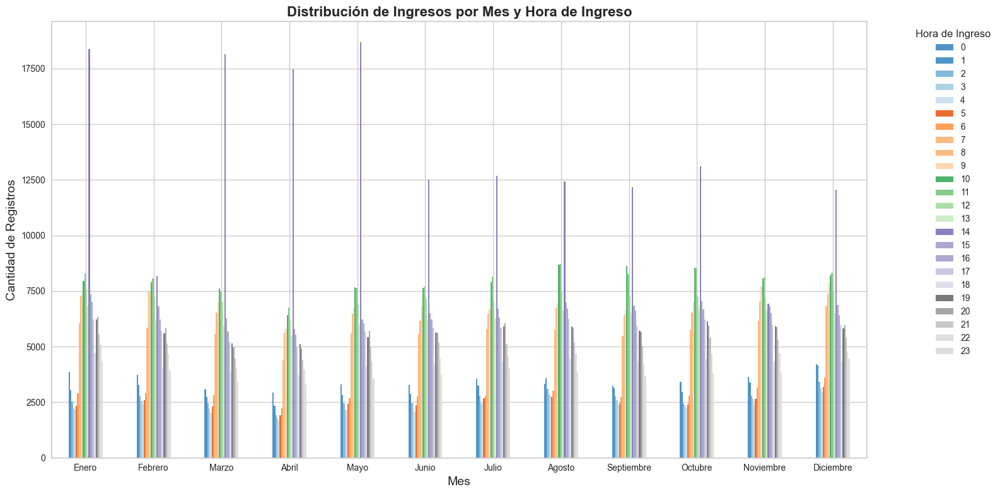

In [94]:
# Crear una lista con el orden deseado de los meses en español
orden_meses = ['Enero', 'Febrero', 'Marzo', 'Abril', 'Mayo', 'Junio', 
               'Julio', 'Agosto', 'Septiembre', 'Octubre', 'Noviembre', 'Diciembre']

# Agrupar los datos por 'Mes' y 'Hora'
grouped_data = Preprocess_df.groupby(['Mes', 'Hora']).size().unstack()

# Reindexar las filas del DataFrame para asegurar el orden correcto
grouped_data = grouped_data.reindex(orden_meses)

# Crear el gráfico de barras agrupadas
fig, ax = plt.subplots(figsize=(16, 8))
grouped_data.plot(kind='bar', stacked=False, colormap='tab20c', alpha=0.85, ax=ax)

# Agregar título y etiquetas
ax.set_title('Distribución de Ingresos por Mes y Hora de Ingreso', fontsize=16, fontweight='bold')
ax.set_xlabel('Mes', fontsize=14)
ax.set_ylabel('Cantidad de Registros', fontsize=14)
ax.legend(title='Hora de Ingreso', bbox_to_anchor=(1.05, 1), loc='upper left')

# Rotar las etiquetas del eje X para mejor legibilidad
ax.tick_params(axis='x', rotation=0)

# Ajustar el diseño
plt.tight_layout()
plt.show()

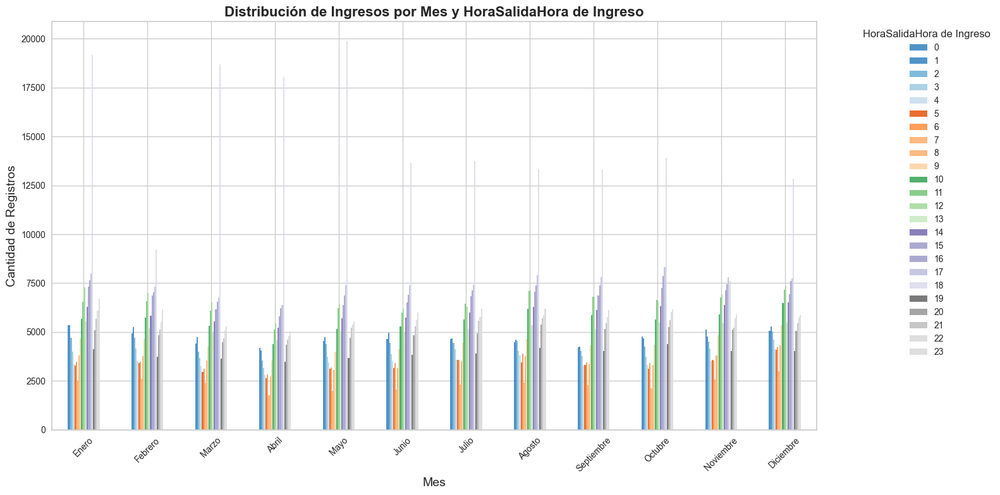

In [95]:
# Crear una lista con el orden deseado de los meses en español
orden_meses = ['Enero', 'Febrero', 'Marzo', 'Abril', 'Mayo', 'Junio', 
               'Julio', 'Agosto', 'Septiembre', 'Octubre', 'Noviembre', 'Diciembre']

# Agrupar los datos por 'Mes' y 'HoraSalidaHora'
grouped_data = Preprocess_df.groupby(['Mes', 'HoraSalidaHora']).size().unstack()

# Reindexar las filas del DataFrame para asegurar el orden correcto
grouped_data = grouped_data.reindex(orden_meses)

# Crear el gráfico de barras agrupadas
fig, ax = plt.subplots(figsize=(16, 8))
grouped_data.plot(kind='bar', stacked=False, colormap='tab20c', alpha=0.85, ax=ax)

# Agregar título y etiquetas
ax.set_title('Distribución de Ingresos por Mes y HoraSalidaHora de Ingreso', fontsize=16, fontweight='bold')
ax.set_xlabel('Mes', fontsize=14)
ax.set_ylabel('Cantidad de Registros', fontsize=14)
ax.legend(title='HoraSalidaHora de Ingreso', bbox_to_anchor=(1.05, 1), loc='upper left')

# Rotar las etiquetas del eje X para mejor legibilidad
ax.tick_params(axis='x', rotation=45)

# Ajustar el diseño
plt.tight_layout()
plt.show()

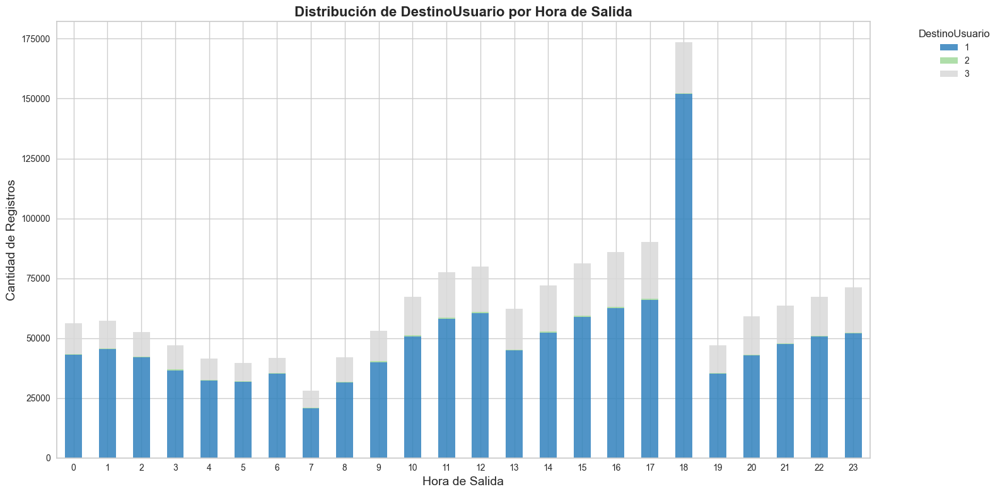

In [96]:
# Agrupar los datos por 'HoraSalidaHora' y 'DestinoUsuario'
grouped_data = Preprocess_df.groupby(['HoraSalidaHora', 'DestinoUsuario']).size().unstack()

# Crear el gráfico de barras apiladas
fig, ax = plt.subplots(figsize=(16, 8))
grouped_data.plot(kind='bar', stacked=True, colormap='tab20c', alpha=0.85, ax=ax)

# Agregar título y etiquetas
ax.set_title('Distribución de DestinoUsuario por Hora de Salida', fontsize=16, fontweight='bold')
ax.set_xlabel('Hora de Salida', fontsize=14)
ax.set_ylabel('Cantidad de Registros', fontsize=14)
ax.legend(title='DestinoUsuario', bbox_to_anchor=(1.05, 1), loc='upper left')

# Rotar las etiquetas del eje X para mayor legibilidad
ax.tick_params(axis='x', rotation=0)

# Ajustar el diseño
plt.tight_layout()
plt.show()


### Rango horario ingreso

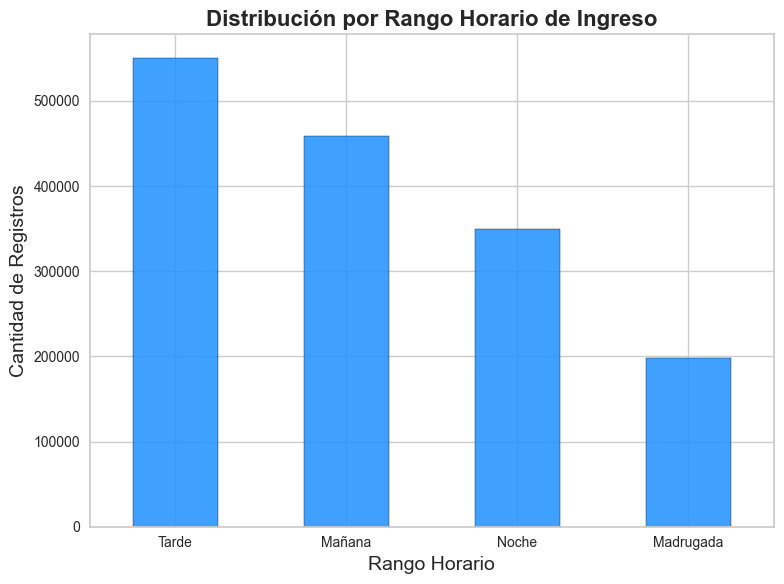

In [97]:
# Contar ocurrencias por rango horario
rango_counts = Preprocess_df['Rango horario ingreso'].value_counts()

# Crear el gráfico de barras
fig, ax = plt.subplots(figsize=(8, 6))
rango_counts.plot(kind='bar', color='#1E90FF', alpha=0.85, edgecolor='black', ax=ax)

# Agregar título y etiquetas
ax.set_title('Distribución por Rango Horario de Ingreso', fontsize=16, fontweight='bold')
ax.set_xlabel('Rango Horario', fontsize=14)
ax.set_ylabel('Cantidad de Registros', fontsize=14)
ax.tick_params(axis='x', rotation=0)

# Ajustar el diseño
plt.tight_layout()
plt.show()


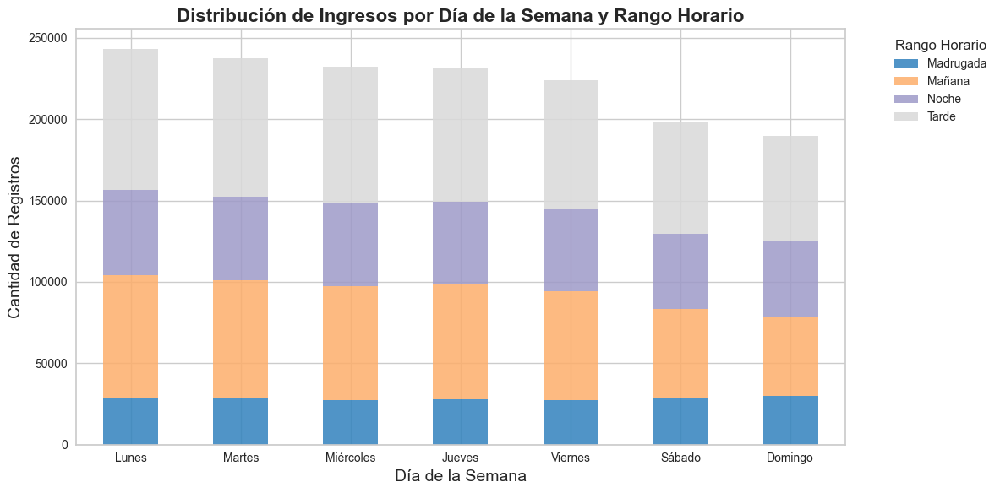

In [98]:
# Agrupar datos por 'Día de la semana' y 'Rango horario ingreso'
grouped_data = Preprocess_df.groupby(['Día de la semana', 'Rango horario ingreso']).size().unstack()

# Crear el gráfico de barras apiladas
fig, ax = plt.subplots(figsize=(12, 6))
grouped_data.plot(kind='bar', stacked=True, colormap='tab20c', alpha=0.85, ax=ax)

# Agregar título y etiquetas
ax.set_title('Distribución de Ingresos por Día de la Semana y Rango Horario', fontsize=16, fontweight='bold')
ax.set_xlabel('Día de la Semana', fontsize=14)
ax.set_ylabel('Cantidad de Registros', fontsize=14)
ax.legend(title='Rango Horario', bbox_to_anchor=(1.05, 1), loc='upper left')
ax.tick_params(axis='x', rotation=0)

# Ajustar el diseño
plt.tight_layout()
plt.show()

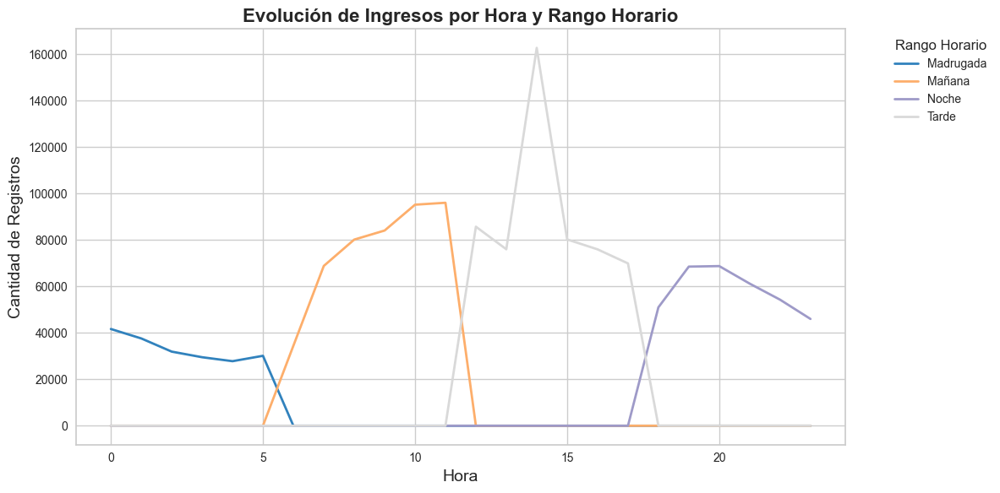

In [99]:
# Crear una tabla cruzada con 'Hora' y 'Rango horario ingreso'
line_data = Preprocess_df.pivot_table(index='Hora', columns='Rango horario ingreso', aggfunc='size', fill_value=0)

# Crear el gráfico de líneas
fig, ax = plt.subplots(figsize=(12, 6))
line_data.plot(kind='line', ax=ax, colormap='tab20c', linewidth=2)

# Agregar título y etiquetas
ax.set_title('Evolución de Ingresos por Hora y Rango Horario', fontsize=16, fontweight='bold')
ax.set_xlabel('Hora', fontsize=14)
ax.set_ylabel('Cantidad de Registros', fontsize=14)
ax.legend(title='Rango Horario', bbox_to_anchor=(1.05, 1), loc='upper left')

# Ajustar el diseño
plt.tight_layout()
plt.show()

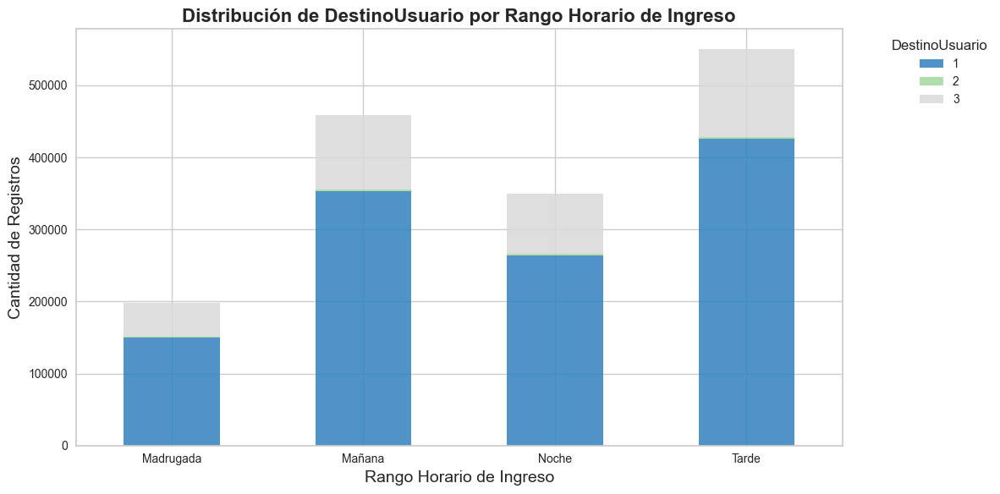

In [100]:
# Agrupar los datos por 'Rango horario ingreso' y 'DestinoUsuario'
grouped_data = Preprocess_df.groupby(['Rango horario ingreso', 'DestinoUsuario']).size().unstack()

# Crear el gráfico de barras apiladas
fig, ax = plt.subplots(figsize=(12, 6))
grouped_data.plot(kind='bar', stacked=True, colormap='tab20c', alpha=0.85, ax=ax)

# Agregar título y etiquetas
ax.set_title('Distribución de DestinoUsuario por Rango Horario de Ingreso', fontsize=16, fontweight='bold')
ax.set_xlabel('Rango Horario de Ingreso', fontsize=14)
ax.set_ylabel('Cantidad de Registros', fontsize=14)
ax.legend(title='DestinoUsuario', bbox_to_anchor=(1.05, 1), loc='upper left')

# Rotar las etiquetas del eje X para mejor legibilidad
ax.tick_params(axis='x', rotation=0)

# Ajustar el diseño
plt.tight_layout()
plt.show()


### Rango horario salida

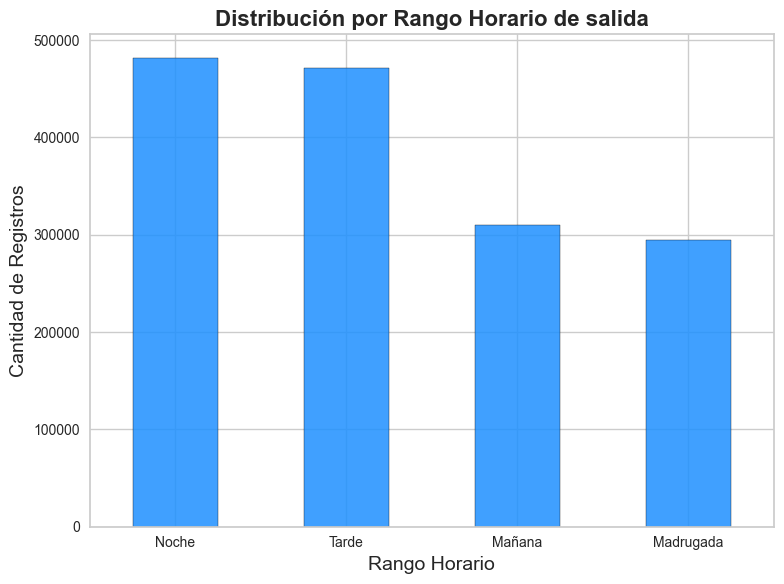

In [101]:
# Contar ocurrencias por rango horario
rango_counts = Preprocess_df['Rango horario salida'].value_counts()

# Crear el gráfico de barras
fig, ax = plt.subplots(figsize=(8, 6))
rango_counts.plot(kind='bar', color='#1E90FF', alpha=0.85, edgecolor='black', ax=ax)

# Agregar título y etiquetas
ax.set_title('Distribución por Rango Horario de salida', fontsize=16, fontweight='bold')
ax.set_xlabel('Rango Horario', fontsize=14)
ax.set_ylabel('Cantidad de Registros', fontsize=14)
ax.tick_params(axis='x', rotation=0)

# Ajustar el diseño
plt.tight_layout()
plt.show()

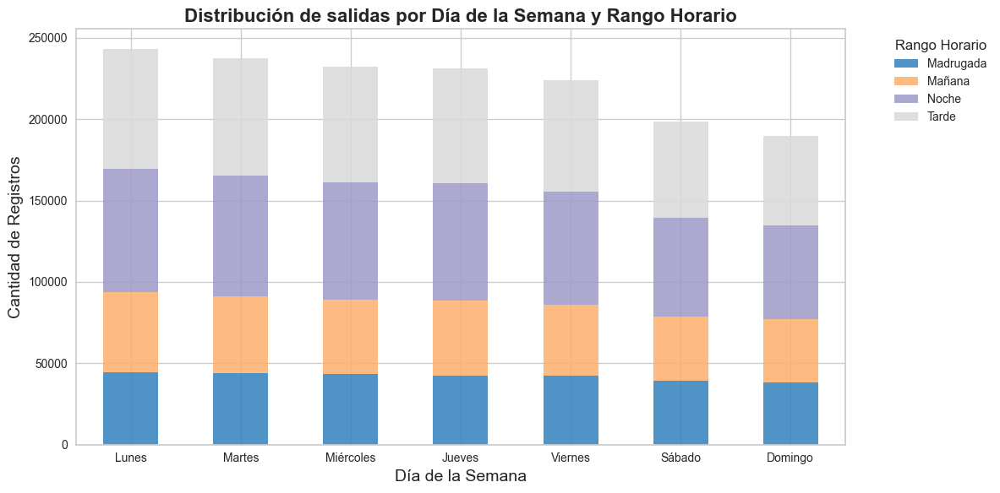

In [102]:
# Agrupar datos por 'Día de la semana' y 'Rango horario salida'
grouped_data = Preprocess_df.groupby(['Día de la semana', 'Rango horario salida']).size().unstack()

# Crear el gráfico de barras apiladas
fig, ax = plt.subplots(figsize=(12, 6))
grouped_data.plot(kind='bar', stacked=True, colormap='tab20c', alpha=0.85, ax=ax)

# Agregar título y etiquetas
ax.set_title('Distribución de salidas por Día de la Semana y Rango Horario', fontsize=16, fontweight='bold')
ax.set_xlabel('Día de la Semana', fontsize=14)
ax.set_ylabel('Cantidad de Registros', fontsize=14)
ax.legend(title='Rango Horario', bbox_to_anchor=(1.05, 1), loc='upper left')
ax.tick_params(axis='x', rotation=0)

# Ajustar el diseño
plt.tight_layout()
plt.show()

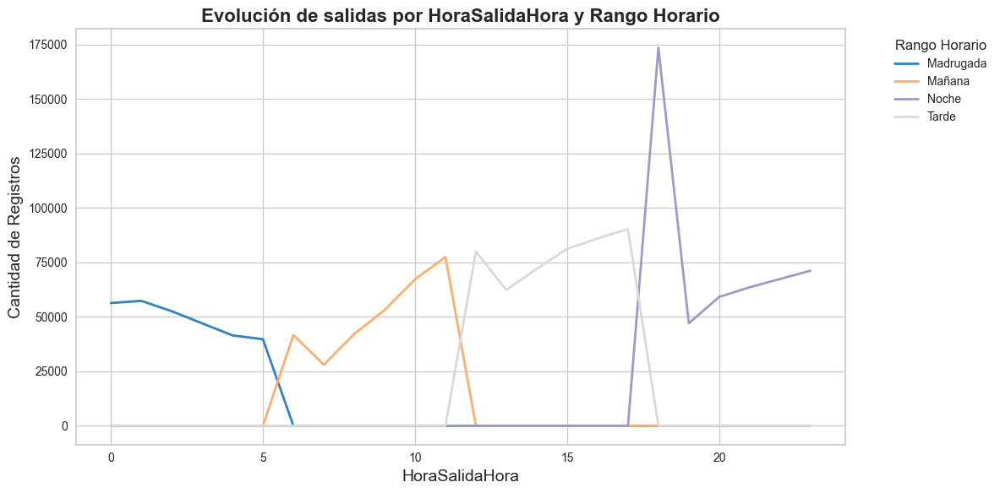

In [103]:
# Crear una tabla cruzada con 'Hora' y 'Rango horario salida'
line_data = Preprocess_df.pivot_table(index='HoraSalidaHora', columns='Rango horario salida', aggfunc='size', fill_value=0)

# Crear el gráfico de líneas
fig, ax = plt.subplots(figsize=(12, 6))
line_data.plot(kind='line', ax=ax, colormap='tab20c', linewidth=2)

# Agregar título y etiquetas
ax.set_title('Evolución de salidas por HoraSalidaHora y Rango Horario', fontsize=16, fontweight='bold')
ax.set_xlabel('HoraSalidaHora', fontsize=14)
ax.set_ylabel('Cantidad de Registros', fontsize=14)
ax.legend(title='Rango Horario', bbox_to_anchor=(1.05, 1), loc='upper left')

# Ajustar el diseño
plt.tight_layout()
plt.show()

### Destino Usuario

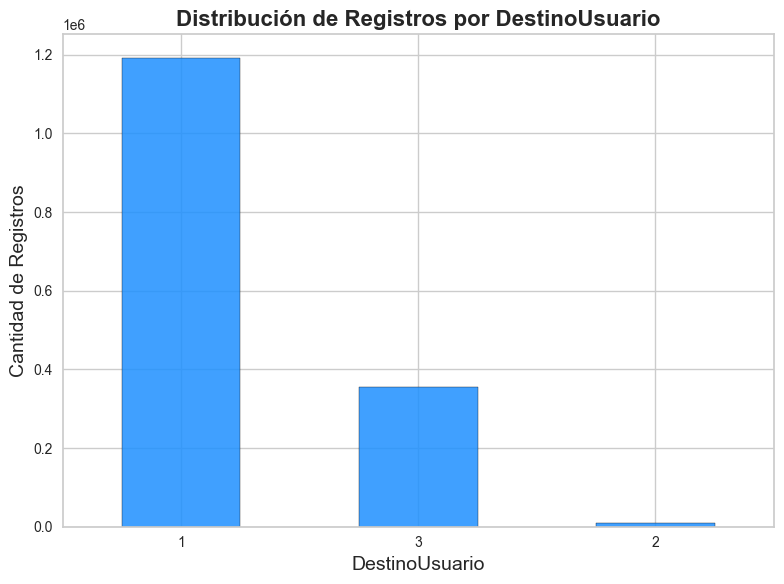

In [104]:
# Contar ocurrencias por 'DestinoUsuario'
destino_counts = Preprocess_df['DestinoUsuario'].value_counts()

# Crear el gráfico de barras
fig, ax = plt.subplots(figsize=(8, 6))
destino_counts.plot(kind='bar', color='#1E90FF', alpha=0.85, edgecolor='black', ax=ax)

# Agregar título y etiquetas
ax.set_title('Distribución de Registros por DestinoUsuario', fontsize=16, fontweight='bold')
ax.set_xlabel('DestinoUsuario', fontsize=14)
ax.set_ylabel('Cantidad de Registros', fontsize=14)
ax.tick_params(axis='x', rotation=0)

# Ajustar el diseño
plt.tight_layout()
plt.show()

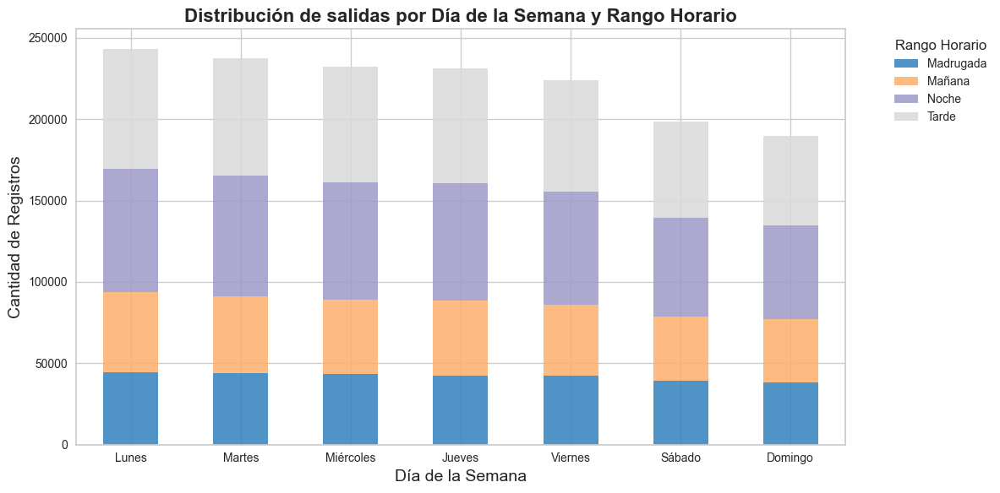

In [105]:
# Agrupar datos por 'Día de la semana' y 'Rango horario salida'
grouped_data = Preprocess_df.groupby(['Día de la semana', 'Rango horario salida']).size().unstack()

# Crear el gráfico de barras apiladas
fig, ax = plt.subplots(figsize=(12, 6))
grouped_data.plot(kind='bar', stacked=True, colormap='tab20c', alpha=0.85, ax=ax)

# Agregar título y etiquetas
ax.set_title('Distribución de salidas por Día de la Semana y Rango Horario', fontsize=16, fontweight='bold')
ax.set_xlabel('Día de la Semana', fontsize=14)
ax.set_ylabel('Cantidad de Registros', fontsize=14)
ax.legend(title='Rango Horario', bbox_to_anchor=(1.05, 1), loc='upper left')
ax.tick_params(axis='x', rotation=0)

# Ajustar el diseño
plt.tight_layout()
plt.show()

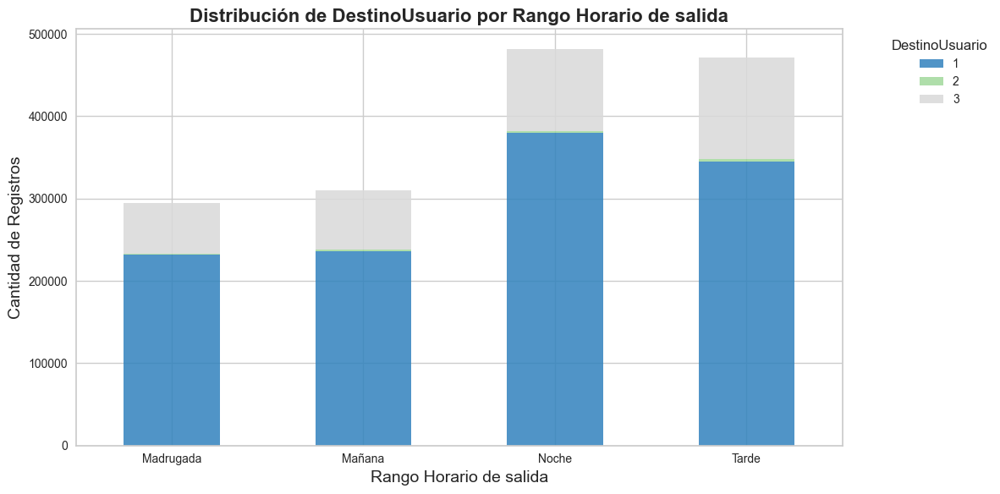

In [106]:
# Agrupar los datos por 'Rango horario salida' y 'DestinoUsuario'
grouped_data = Preprocess_df.groupby(['Rango horario salida', 'DestinoUsuario']).size().unstack()

# Crear el gráfico de barras apiladas
fig, ax = plt.subplots(figsize=(12, 6))
grouped_data.plot(kind='bar', stacked=True, colormap='tab20c', alpha=0.85, ax=ax)

# Agregar título y etiquetas
ax.set_title('Distribución de DestinoUsuario por Rango Horario de salida', fontsize=16, fontweight='bold')
ax.set_xlabel('Rango Horario de salida', fontsize=14)
ax.set_ylabel('Cantidad de Registros', fontsize=14)
ax.legend(title='DestinoUsuario', bbox_to_anchor=(1.05, 1), loc='upper left')

# Rotar las etiquetas del eje X para mejor legibilidad
ax.tick_params(axis='x', rotation=0)

# Ajustar el diseño
plt.tight_layout()
plt.show()

### Día del mes

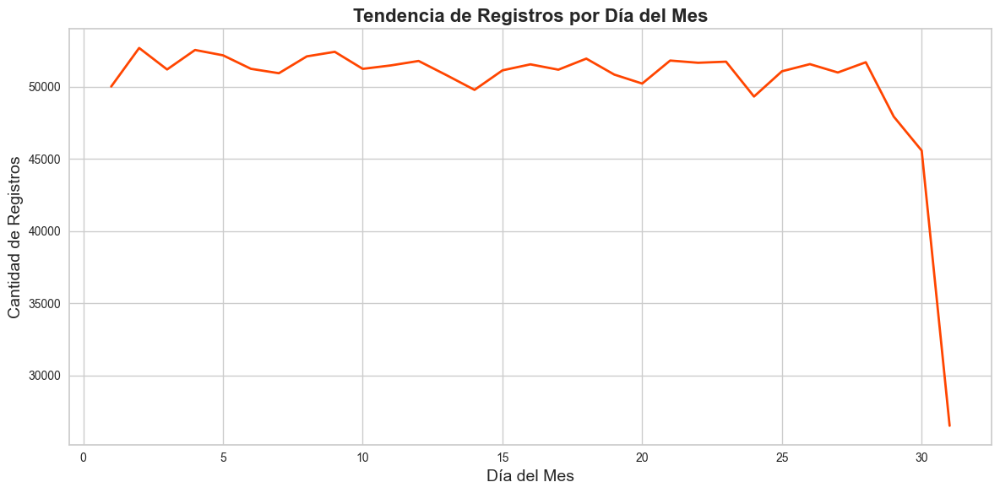

In [107]:
# Contar ocurrencias por día del mes
dia_counts = Preprocess_df['Día del mes'].value_counts().sort_index()

# Crear el gráfico de líneas
fig, ax = plt.subplots(figsize=(12, 6))
dia_counts.plot(kind='line', color='#FF4500', linewidth=2, ax=ax)

# Agregar título y etiquetas
ax.set_title('Tendencia de Registros por Día del Mes', fontsize=16, fontweight='bold')
ax.set_xlabel('Día del Mes', fontsize=14)
ax.set_ylabel('Cantidad de Registros', fontsize=14)

# Ajustar el diseño
plt.tight_layout()
plt.show()

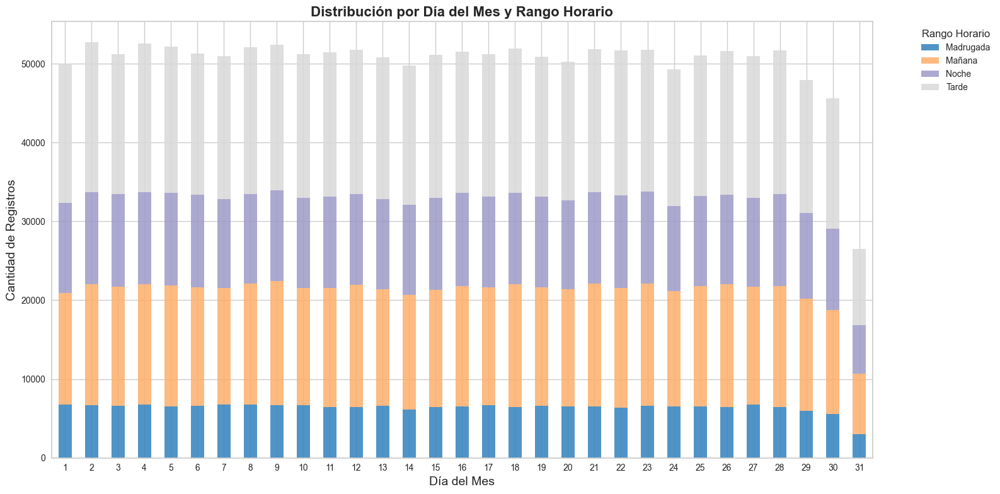

In [108]:
# Agrupar los datos por 'Día del mes' y 'Rango horario ingreso'
grouped_data = Preprocess_df.groupby(['Día del mes', 'Rango horario ingreso']).size().unstack()

# Crear el gráfico de barras apiladas
fig, ax = plt.subplots(figsize=(16, 8))
grouped_data.plot(kind='bar', stacked=True, colormap='tab20c', alpha=0.85, ax=ax)

# Agregar título y etiquetas
ax.set_title('Distribución por Día del Mes y Rango Horario', fontsize=16, fontweight='bold')
ax.set_xlabel('Día del Mes', fontsize=14)
ax.set_ylabel('Cantidad de Registros', fontsize=14)
ax.legend(title='Rango Horario', bbox_to_anchor=(1.05, 1), loc='upper left')
ax.tick_params(axis='x', rotation=0)

# Ajustar el diseño
plt.tight_layout()
plt.show()

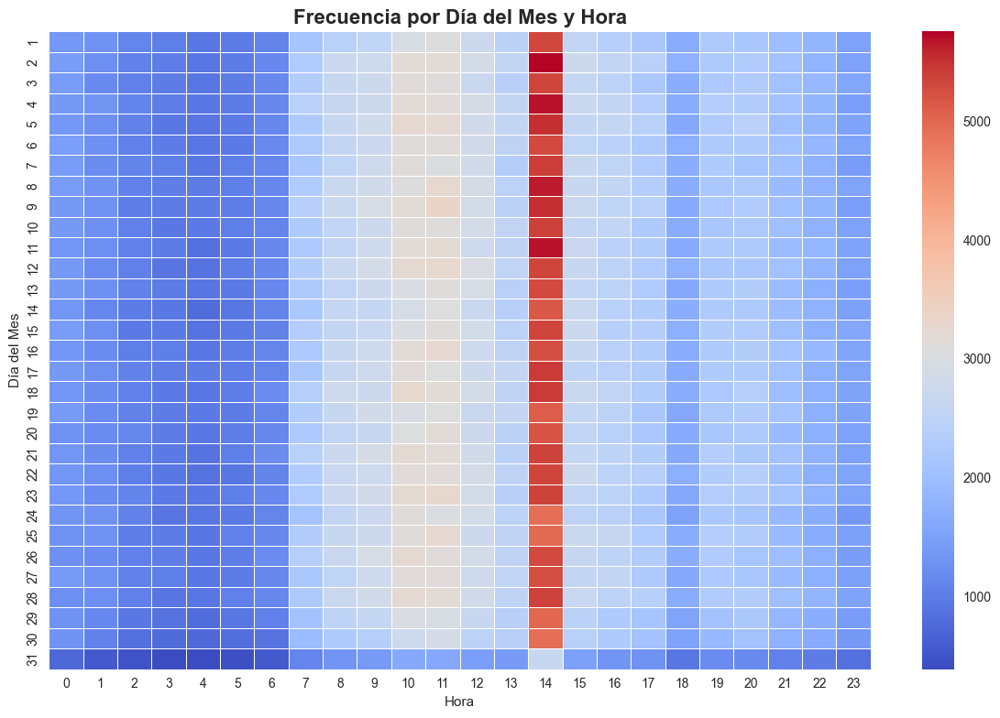

In [109]:
# Crear una tabla cruzada con 'Día del mes' y 'Hora'
heatmap_data = Preprocess_df.pivot_table(index='Día del mes', columns='Hora', aggfunc='size', fill_value=0)

# Crear el heatmap
plt.figure(figsize=(12, 8))
sns.heatmap(heatmap_data, cmap='coolwarm', linewidths=.5)  # Eliminado 'annot=True'

# Agregar título y etiquetas
plt.title('Frecuencia por Día del Mes y Hora', fontsize=16, fontweight='bold')
plt.xlabel('Hora')
plt.ylabel('Día del Mes')
plt.tight_layout()
plt.show()

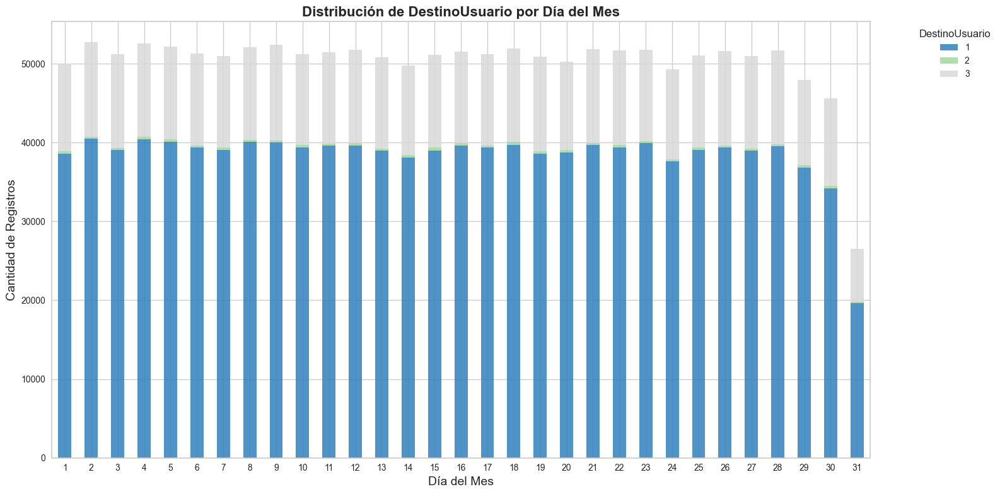

In [110]:
# Agrupar los datos por 'Día del mes' y 'DestinoUsuario'
grouped_data = Preprocess_df.groupby(['Día del mes', 'DestinoUsuario']).size().unstack()

# Crear el gráfico de barras apiladas
fig, ax = plt.subplots(figsize=(16, 8))
grouped_data.plot(kind='bar', stacked=True, colormap='tab20c', alpha=0.85, ax=ax)

# Agregar título y etiquetas
ax.set_title('Distribución de DestinoUsuario por Día del Mes', fontsize=16, fontweight='bold')
ax.set_xlabel('Día del Mes', fontsize=14)
ax.set_ylabel('Cantidad de Registros', fontsize=14)
ax.legend(title='DestinoUsuario', bbox_to_anchor=(1.05, 1), loc='upper left')

# Rotar las etiquetas del eje X para mejor legibilidad
ax.tick_params(axis='x', rotation=0)

# Ajustar el diseño
plt.tight_layout()
plt.show()

### Es fin de semana

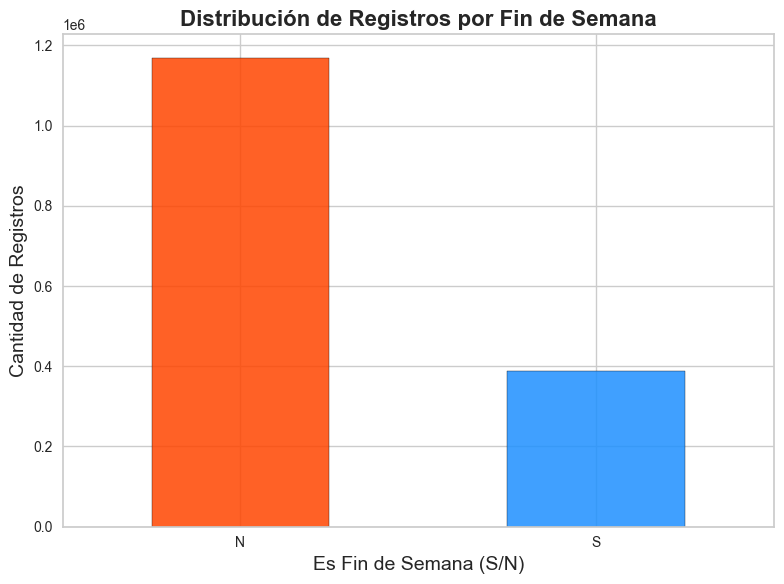

In [111]:
# Contar ocurrencias por 'Es fin de semana'
fin_semana_counts = Preprocess_df['Es fin de semana'].value_counts()

# Crear el gráfico de barras
fig, ax = plt.subplots(figsize=(8, 6))
fin_semana_counts.plot(kind='bar', color=['#FF4500', '#1E90FF'], alpha=0.85, edgecolor='black', ax=ax)

# Agregar título y etiquetas
ax.set_title('Distribución de Registros por Fin de Semana', fontsize=16, fontweight='bold')
ax.set_xlabel('Es Fin de Semana (S/N)', fontsize=14)
ax.set_ylabel('Cantidad de Registros', fontsize=14)
ax.tick_params(axis='x', rotation=0)

# Ajustar el diseño
plt.tight_layout()
plt.show()

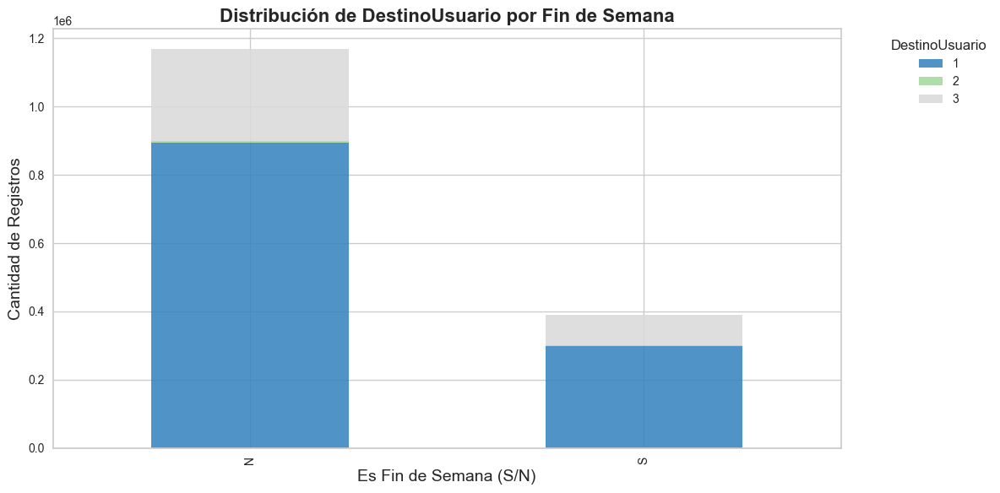

In [112]:
# Agrupar datos por 'Es fin de semana' y 'DestinoUsuario'
grouped_data = Preprocess_df.groupby(['Es fin de semana', 'DestinoUsuario']).size().unstack()

# Crear el gráfico de barras apiladas
fig, ax = plt.subplots(figsize=(12, 6))
grouped_data.plot(kind='bar', stacked=True, colormap='tab20c', alpha=0.85, ax=ax)

# Agregar título y etiquetas
ax.set_title('Distribución de DestinoUsuario por Fin de Semana', fontsize=16, fontweight='bold')
ax.set_xlabel('Es Fin de Semana (S/N)', fontsize=14)
ax.set_ylabel('Cantidad de Registros', fontsize=14)
ax.legend(title='DestinoUsuario', bbox_to_anchor=(1.05, 1), loc='upper left')

# Ajustar el diseño
plt.tight_layout()
plt.show()

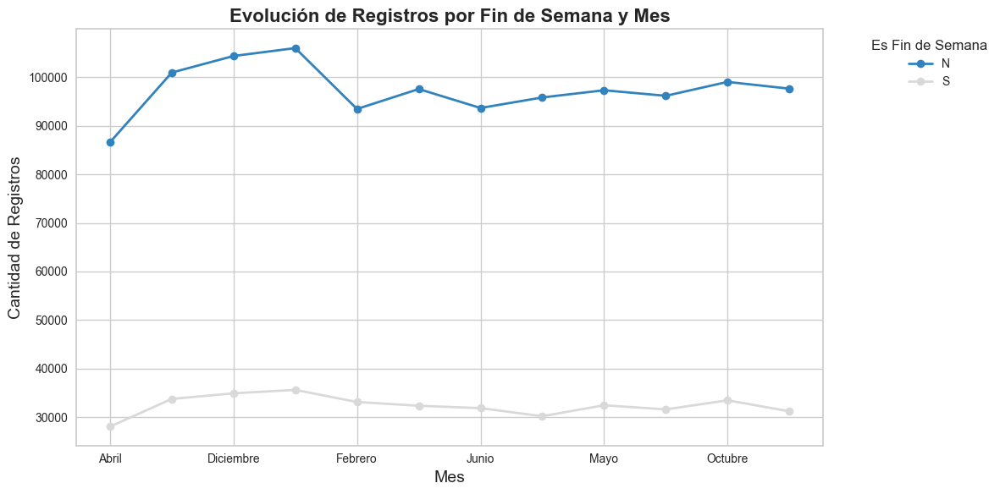

In [113]:
# Agrupar los datos por 'Mes' y 'Es fin de semana'
grouped_data = Preprocess_df.groupby(['Mes', 'Es fin de semana']).size().unstack()

# Crear el gráfico de líneas
fig, ax = plt.subplots(figsize=(12, 6))
grouped_data.plot(kind='line', marker='o', colormap='tab20c', linewidth=2, ax=ax)

# Agregar título y etiquetas
ax.set_title('Evolución de Registros por Fin de Semana y Mes', fontsize=16, fontweight='bold')
ax.set_xlabel('Mes', fontsize=14)
ax.set_ylabel('Cantidad de Registros', fontsize=14)
ax.legend(title='Es Fin de Semana', bbox_to_anchor=(1.05, 1), loc='upper left')

# Ajustar el diseño
plt.tight_layout()
plt.show()

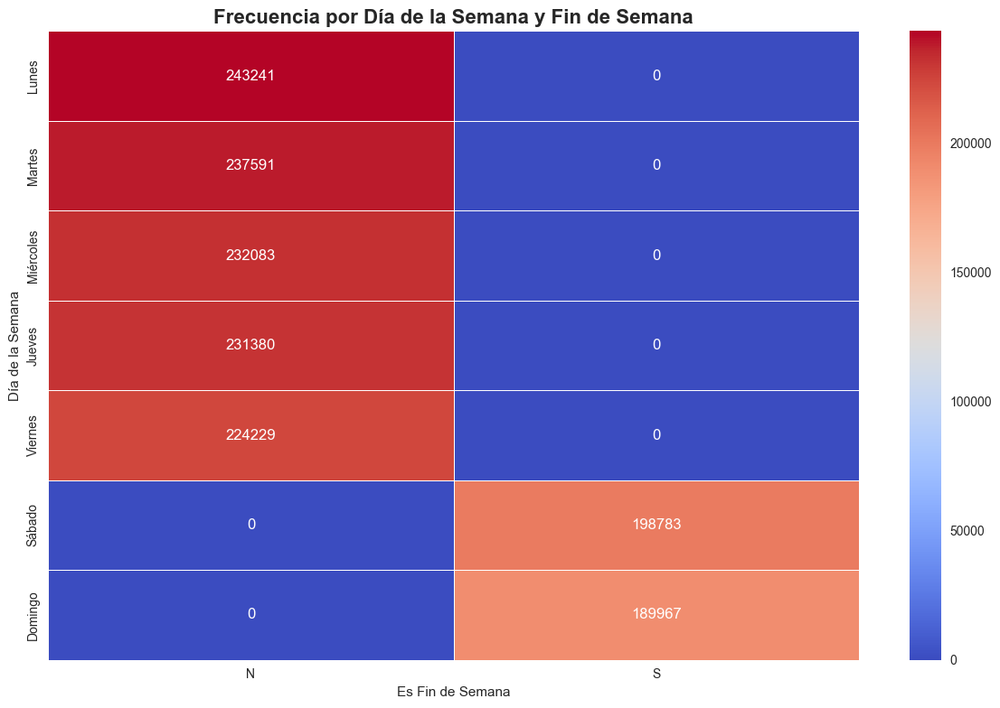

In [114]:
# Crear una tabla cruzada con 'Día de la semana' y 'Es fin de semana'
heatmap_data = Preprocess_df.pivot_table(index='Día de la semana', columns='Es fin de semana', aggfunc='size', fill_value=0)

# Crear el heatmap
plt.figure(figsize=(12, 8))
sns.heatmap(heatmap_data, cmap='coolwarm', annot=True, fmt='d', linewidths=.5)

# Agregar título y etiquetas
plt.title('Frecuencia por Día de la Semana y Fin de Semana', fontsize=16, fontweight='bold')
plt.xlabel('Es Fin de Semana')
plt.ylabel('Día de la Semana')
plt.tight_layout()
plt.show()

## Análisis Bivariante

In [145]:
# Vamos a seleccionar las columas serán incluidas en el modelamiento

df_original_2 = Preprocess_df[[
       'Tipo Prestador', 'Municipio',
       'Clasifiación casos municipio', 
       'Region_departamento', 'Cobertura servicios básicos departamento',
       'DestinoUsuario', 
       'Edad', 'Sexo', 'ZonaResidencia',
       'Prestador:1.publica/0.privada', 'CausaExternaNueva', 'Clasificación aseguradora', 
       'TpoUsuario_nuevo', 'Año', 'Hora',
       'HoraSalidaHora', 'TiempoDeEstancia horas', 'Es festivo (S/N)',
       'Es víspera (S/N)', 'Día Laborable', 'Día de la semana', 'Mes',
       'Rango horario ingreso', 'Rango horario salida', 'Día del mes',
       'Es fin de semana', 'Clasificación estancia', 'Grupo etario',
     'ClasificaciónSalidaCrítica',
       'ReClasificaciónSalida']]

In [146]:
df_original_2.isnull().sum()

Tipo Prestador                              0
Municipio                                   0
Clasifiación casos municipio                0
Region_departamento                         0
Cobertura servicios básicos departamento    0
DestinoUsuario                              0
Edad                                        0
Sexo                                        0
ZonaResidencia                              0
Prestador:1.publica/0.privada               0
CausaExternaNueva                           0
Clasificación aseguradora                   0
TpoUsuario_nuevo                            0
Año                                         0
Hora                                        0
HoraSalidaHora                              0
TiempoDeEstancia horas                      0
Es festivo (S/N)                            0
Es víspera (S/N)                            0
Día Laborable                               0
Día de la semana                            0
Mes                               

In [147]:
# Configurar pandas para mostrar todas las columnas
pd.set_option('display.max_columns', None)

# Mostrar las primeras filas del DataFrame
df_original_2.head()

,Tipo Prestador,Municipio,Clasifiación casos municipio,Region_departamento,Cobertura servicios básicos departamento,DestinoUsuario,Edad,Sexo,ZonaResidencia,Prestador:1.publica/0.privada,CausaExternaNueva,Clasificación aseguradora,TpoUsuario_nuevo,Año,Hora,HoraSalidaHora,TiempoDeEstancia horas,Es festivo (S/N),Es víspera (S/N),Día Laborable,Día de la semana,Mes,Rango horario ingreso,Rango horario salida,Día del mes,Es fin de semana,Clasificación estancia,Grupo etario,ClasificaciónSalidaCrítica,ReClasificaciónSalida
0,IPS,MEDELLIN,Muy Alto,Andina,Alta,1,45.0,M,U,0,Enfermedad general,EPS,Régimen Contributivo,2019,5,7,2.266667,N,N,S,Sábado,Diciembre,Madrugada,Mañana,21,S,Corta,Adulto,NO,Síntomas Generales y Varios
1,IPS,MEDELLIN,Muy Alto,Andina,Alta,1,43.0,M,U,0,Enfermedad general,EPS,Régimen Contributivo,2019,7,11,3.933333,N,N,S,Lunes,Diciembre,Mañana,Mañana,23,N,Corta,Adulto,NO,Trastornos Crónicos o No Infecciosos
2,IPS,MEDELLIN,Muy Alto,Andina,Alta,1,44.0,M,U,0,Enfermedad general,EPS,Régimen Contributivo,2019,12,3,0.000000,N,N,N,Domingo,Diciembre,Tarde,Madrugada,29,S,Corta,Adulto,NO,Traumatismos y Lesiones
3,IPS,MEDELLIN,Muy Alto,Andina,Alta,1,41.0,M,U,0,Enfermedad general,EPS,Régimen Contributivo,2019,9,10,0.733333,N,N,N,Domingo,Diciembre,Mañana,Mañana,29,S,Corta,Adulto,NO,Otros Motivos o No Especificados
4,IPS,BARRANQUILLA (DISTRITO ESPECIAL INDUSTRIAL Y ...,Bajo,Caribe,Alta,1,40.0,M,U,0,Enfermedad general,EPS,Régimen Contributivo,2019,4,6,1.766667,N,N,S,Viernes,Diciembre,Madrugada,Mañana,20,N,Corta,Adulto,NO,Trastornos Crónicos o No Infecciosos


In [148]:
df_original_2.columns

Index(['Tipo Prestador', 'Municipio', 'Clasifiación casos municipio',
       'Region_departamento', 'Cobertura servicios básicos departamento',
       'DestinoUsuario', 'Edad', 'Sexo', 'ZonaResidencia',
       'Prestador:1.publica/0.privada', 'CausaExternaNueva',
       'Clasificación aseguradora', 'TpoUsuario_nuevo', 'Año', 'Hora',
       'HoraSalidaHora', 'TiempoDeEstancia horas', 'Es festivo (S/N)',
       'Es víspera (S/N)', 'Día Laborable', 'Día de la semana', 'Mes',
       'Rango horario ingreso', 'Rango horario salida', 'Día del mes',
       'Es fin de semana', 'Clasificación estancia', 'Grupo etario',
       'ClasificaciónSalidaCrítica', 'ReClasificaciónSalida'],
      dtype='object')

In [149]:
df_original_2 = df_original_2.rename(columns={'Hora':'HoraIngreso', 'HoraSalidaHora':'HoraSalida'})

In [150]:
df_original_2.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1557274 entries, 0 to 1557273
Data columns (total 30 columns):
 #   Column                                    Non-Null Count    Dtype   
---  ------                                    --------------    -----   
 0   Tipo Prestador                            1557274 non-null  object  
 1   Municipio                                 1557274 non-null  object  
 2   Clasifiación casos municipio              1557274 non-null  object  
 3   Region_departamento                       1557274 non-null  object  
 4   Cobertura servicios básicos departamento  1557274 non-null  object  
 5   DestinoUsuario                            1557274 non-null  int64   
 6   Edad                                      1557274 non-null  float64 
 7   Sexo                                      1557274 non-null  object  
 8   ZonaResidencia                            1557274 non-null  object  
 9   Prestador:1.publica/0.privada             1557274 non-null  int64   

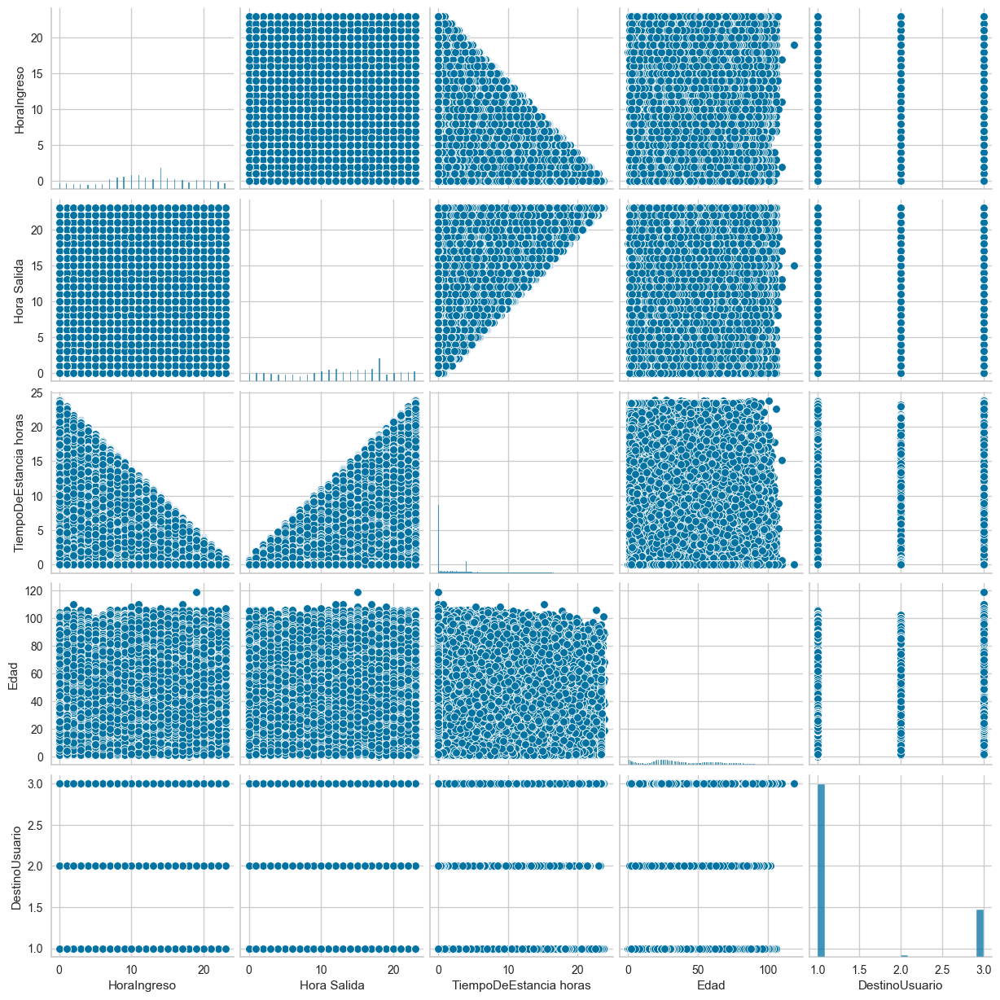

In [123]:
sns.pairplot(df_original_2[['HoraIngreso', 'Hora Salida', 'TiempoDeEstancia horas', 'Edad',
       'DestinoUsuario']])

<Figure size 700x700 with 0 Axes>

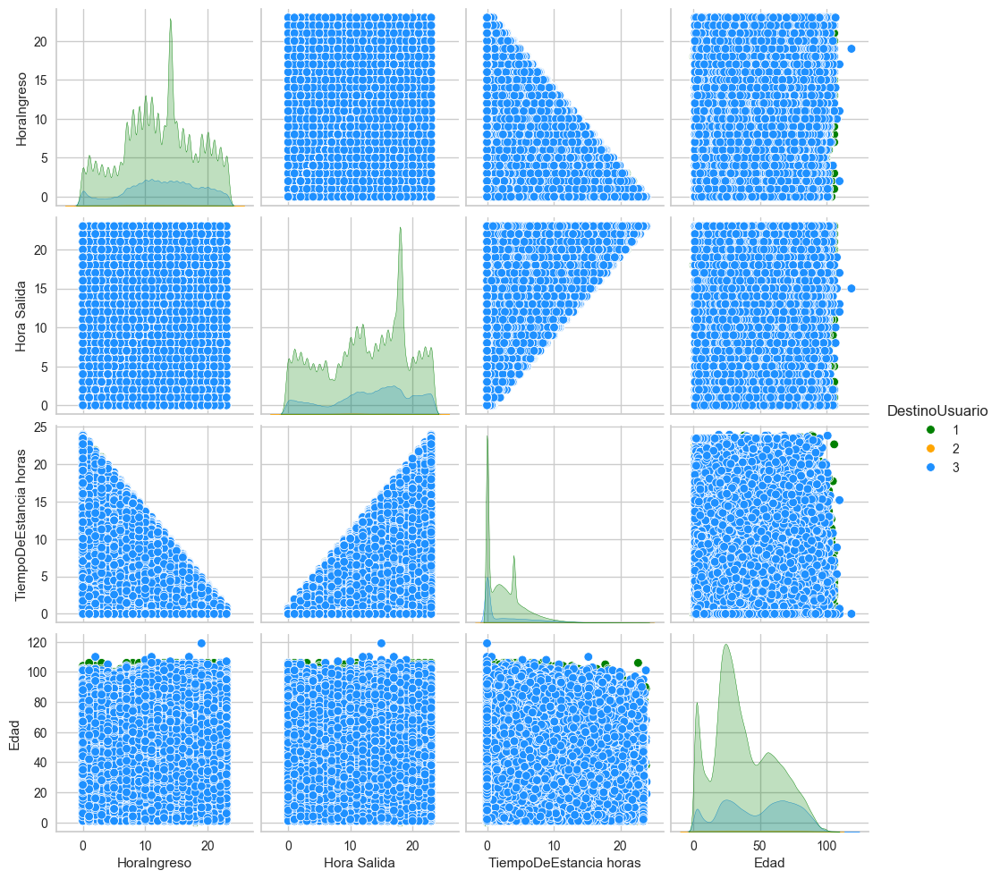

In [124]:
plt.figure(figsize=(7,7))
sns.set_style('whitegrid')
sns.pairplot(data=df_original_2[['HoraIngreso', 'Hora Salida', 'TiempoDeEstancia horas', 'Edad',
       'DestinoUsuario']], hue='DestinoUsuario', palette=['green','orange','dodgerblue'])

### 

## Eliminar variables

In [597]:
# # Vamos a eliminar las columas que por su tipo de dato no serán incluidas en el modelamiento

# df_original_2 = df_original_2.drop(columns=['NumeroFactura','FechaIngreso','HoraIngreso', 'CodigoDiagnosticoRelN1Salida', 'CodigoDiagnosticoRelN2Salida', 'CodigoDiagnosticoRelN3Salida',
#                                            'FechaSalida', 'HoraSalida', 'UnidadMedidaEdad', 'Ano', 'Departamento', 'Municipio', 'codigo', 'nombre', 'Año', 'Hora'])

In [151]:
df_original_2.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1557274 entries, 0 to 1557273
Data columns (total 30 columns):
 #   Column                                    Non-Null Count    Dtype   
---  ------                                    --------------    -----   
 0   Tipo Prestador                            1557274 non-null  object  
 1   Municipio                                 1557274 non-null  object  
 2   Clasifiación casos municipio              1557274 non-null  object  
 3   Region_departamento                       1557274 non-null  object  
 4   Cobertura servicios básicos departamento  1557274 non-null  object  
 5   DestinoUsuario                            1557274 non-null  int64   
 6   Edad                                      1557274 non-null  float64 
 7   Sexo                                      1557274 non-null  object  
 8   ZonaResidencia                            1557274 non-null  object  
 9   Prestador:1.publica/0.privada             1557274 non-null  int64   

In [152]:
df_original_2.columns

Index(['Tipo Prestador', 'Municipio', 'Clasifiación casos municipio',
       'Region_departamento', 'Cobertura servicios básicos departamento',
       'DestinoUsuario', 'Edad', 'Sexo', 'ZonaResidencia',
       'Prestador:1.publica/0.privada', 'CausaExternaNueva',
       'Clasificación aseguradora', 'TpoUsuario_nuevo', 'Año', 'HoraIngreso',
       'HoraSalida', 'TiempoDeEstancia horas', 'Es festivo (S/N)',
       'Es víspera (S/N)', 'Día Laborable', 'Día de la semana', 'Mes',
       'Rango horario ingreso', 'Rango horario salida', 'Día del mes',
       'Es fin de semana', 'Clasificación estancia', 'Grupo etario',
       'ClasificaciónSalidaCrítica', 'ReClasificaciónSalida'],
      dtype='object')

In [153]:
df_original_2.to_csv('data/Preprocess_df_2_exp2.csv', index=False)

# Convetir variables object a int

In [3]:
df_original = pd.read_csv('data/Preprocess_df_2_exp2.csv')

In [4]:
# Identificar variables categóricas
categorical_vars = df_original.select_dtypes(include=['object', 'category']).columns.tolist()

# Identificar variables numéricas
numerical_vars = df_original.select_dtypes(include=['int64', 'float64']).columns.tolist()

# Mostrar las listas
print("Variables Categóricas:", categorical_vars)
print("Variables Numéricas:", numerical_vars)

Variables Categóricas: ['Tipo Prestador', 'Municipio', 'Clasifiación casos municipio', 'Region_departamento', 'Cobertura servicios básicos departamento', 'Sexo', 'ZonaResidencia', 'CausaExternaNueva', 'Clasificación aseguradora', 'TpoUsuario_nuevo', 'Es festivo (S/N)', 'Es víspera (S/N)', 'Día Laborable', 'Día de la semana', 'Mes', 'Rango horario ingreso', 'Rango horario salida', 'Es fin de semana', 'Clasificación estancia', 'Grupo etario', 'ClasificaciónSalidaCrítica', 'ReClasificaciónSalida']
Variables Numéricas: ['DestinoUsuario', 'Edad', 'Prestador:1.publica/0.privada', 'Año', 'HoraIngreso', 'HoraSalida', 'TiempoDeEstancia horas', 'Día del mes']


In [5]:
df_model = df_original.copy()

### Tipo Prestador

In [6]:
df_model['Tipo Prestador'].value_counts()

Tipo Prestador
HOSPITAL    599453
CLINICA     571254
OTRA        202153
IPS         184414
Name: count, dtype: int64

In [7]:
df_model = pd.get_dummies(df_model, columns=['Tipo Prestador'], dtype=int)  

In [8]:
df_model.columns

Index(['Municipio', 'Clasifiación casos municipio', 'Region_departamento',
       'Cobertura servicios básicos departamento', 'DestinoUsuario', 'Edad',
       'Sexo', 'ZonaResidencia', 'Prestador:1.publica/0.privada',
       'CausaExternaNueva', 'Clasificación aseguradora', 'TpoUsuario_nuevo',
       'Año', 'HoraIngreso', 'HoraSalida', 'TiempoDeEstancia horas',
       'Es festivo (S/N)', 'Es víspera (S/N)', 'Día Laborable',
       'Día de la semana', 'Mes', 'Rango horario ingreso',
       'Rango horario salida', 'Día del mes', 'Es fin de semana',
       'Clasificación estancia', 'Grupo etario', 'ClasificaciónSalidaCrítica',
       'ReClasificaciónSalida', 'Tipo Prestador_CLINICA',
       'Tipo Prestador_HOSPITAL', 'Tipo Prestador_IPS', 'Tipo Prestador_OTRA'],
      dtype='object')

### Clasifiación casos municipio

In [9]:

df_model['Clasifiación casos municipio'].value_counts()

Clasifiación casos municipio
Muy Alto    1357744
Alto          87388
Medio         65747
Bajo          41404
Muy Bajo       4991
Name: count, dtype: int64

In [10]:
# Diccionario de mapeo manual
categoria_mapeo = {
    'Muy Bajo': 0,
    'Bajo': 1,
    'Medio': 2,
    'Alto': 3,
    'Muy Alto': 4
}

# Aplicar el mapeo a la columna
df_model['Clasificación casos municipio_int'] = df_model['Clasifiación casos municipio'].map(categoria_mapeo)

# Verificar la transformación
df_model



,Municipio,Clasifiación casos municipio,Region_departamento,Cobertura servicios básicos departamento,DestinoUsuario,Edad,Sexo,ZonaResidencia,Prestador:1.publica/0.privada,CausaExternaNueva,...,Es fin de semana,Clasificación estancia,Grupo etario,ClasificaciónSalidaCrítica,ReClasificaciónSalida,Tipo Prestador_CLINICA,Tipo Prestador_HOSPITAL,Tipo Prestador_IPS,Tipo Prestador_OTRA,Clasificación casos municipio_int
0,MEDELLIN,Muy Alto,Andina,Alta,1,45.0,M,U,0,Enfermedad general,...,S,Corta,Adulto,NO,Síntomas Generales y Varios,0,0,1,0,4
1,MEDELLIN,Muy Alto,Andina,Alta,1,43.0,M,U,0,Enfermedad general,...,N,Corta,Adulto,NO,Trastornos Crónicos o No Infecciosos,0,0,1,0,4
2,MEDELLIN,Muy Alto,Andina,Alta,1,44.0,M,U,0,Enfermedad general,...,S,Corta,Adulto,NO,Traumatismos y Lesiones,0,0,1,0,4
3,MEDELLIN,Muy Alto,Andina,Alta,1,41.0,M,U,0,Enfermedad general,...,S,Corta,Adulto,NO,Otros Motivos o No Especificados,0,0,1,0,4
4,BARRANQUILLA (DISTRITO ESPECIAL INDUSTRIAL Y ...,Bajo,Caribe,Alta,1,40.0,M,U,0,Enfermedad general,...,N,Corta,Adulto,NO,Trastornos Crónicos o No Infecciosos,0,0,1,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1557269,MEDELLIN,Muy Alto,Andina,Alta,3,32.0,M,U,0,Enfermedad general,...,N,Corta,Adulto,NO,Otros Motivos o No Especificados,0,1,0,0,4
1557270,MEDELLIN,Muy Alto,Andina,Alta,3,32.0,M,U,0,Enfermedad general,...,N,Corta,Adulto,NO,Trastornos Crónicos o No Infecciosos,0,1,0,0,4
1557271,ITAGUI,Alto,Andina,Alta,3,28.0,M,U,0,Enfermedad general,...,N,Corta,Adulto,NO,Trastornos Crónicos o No Infecciosos,0,1,0,0,3
1557272,MEDELLIN,Muy Alto,Andina,Alta,3,31.0,M,U,0,Enfermedad general,...,N,Corta,Adulto,NO,Trastornos Crónicos o No Infecciosos,0,1,0,0,4


### Region_departamento

In [11]:
df_original['Region_departamento'].value_counts()

Region_departamento
Andina       1548413
Pacifica        4847
Caribe          3688
Orinoquía        213
Amazonica        113
Name: count, dtype: int64

In [12]:
# Aplicar One-Hot Encoding y guardar en nuevas columnas
df_model = pd.get_dummies(df_model, columns=['Region_departamento'], dtype=int)

# Verificar la transformación
df_model.head(3)

,Municipio,Clasifiación casos municipio,Cobertura servicios básicos departamento,DestinoUsuario,Edad,Sexo,ZonaResidencia,Prestador:1.publica/0.privada,CausaExternaNueva,Clasificación aseguradora,...,Tipo Prestador_CLINICA,Tipo Prestador_HOSPITAL,Tipo Prestador_IPS,Tipo Prestador_OTRA,Clasificación casos municipio_int,Region_departamento_Amazonica,Region_departamento_Andina,Region_departamento_Caribe,Region_departamento_Orinoquía,Region_departamento_Pacifica
0,MEDELLIN,Muy Alto,Alta,1,45.0,M,U,0,Enfermedad general,EPS,...,0,0,1,0,4,0,1,0,0,0
1,MEDELLIN,Muy Alto,Alta,1,43.0,M,U,0,Enfermedad general,EPS,...,0,0,1,0,4,0,1,0,0,0
2,MEDELLIN,Muy Alto,Alta,1,44.0,M,U,0,Enfermedad general,EPS,...,0,0,1,0,4,0,1,0,0,0


### Cobertura servicios básicos departamento

In [13]:
df_original['Cobertura servicios básicos departamento'].value_counts()

Cobertura servicios básicos departamento
Alta     1547794
Media       5131
Baja        4349
Name: count, dtype: int64

In [14]:
# Diccionario de mapeo manual
cobertura_mapeo = {
    'Baja': 0,
    'Media': 1,
    'Alta': 2
}

# Crear la nueva columna con valores numéricos
df_model['Cobertura servicios básicos departamento_int'] = df_model['Cobertura servicios básicos departamento'].map(cobertura_mapeo)

# Verificar la transformación
df_model.head(3)

,Municipio,Clasifiación casos municipio,Cobertura servicios básicos departamento,DestinoUsuario,Edad,Sexo,ZonaResidencia,Prestador:1.publica/0.privada,CausaExternaNueva,Clasificación aseguradora,...,Tipo Prestador_HOSPITAL,Tipo Prestador_IPS,Tipo Prestador_OTRA,Clasificación casos municipio_int,Region_departamento_Amazonica,Region_departamento_Andina,Region_departamento_Caribe,Region_departamento_Orinoquía,Region_departamento_Pacifica,Cobertura servicios básicos departamento_int
0,MEDELLIN,Muy Alto,Alta,1,45.0,M,U,0,Enfermedad general,EPS,...,0,1,0,4,0,1,0,0,0,2
1,MEDELLIN,Muy Alto,Alta,1,43.0,M,U,0,Enfermedad general,EPS,...,0,1,0,4,0,1,0,0,0,2
2,MEDELLIN,Muy Alto,Alta,1,44.0,M,U,0,Enfermedad general,EPS,...,0,1,0,4,0,1,0,0,0,2


### Sexo

In [15]:
df_original['Sexo'].value_counts()

Sexo
F    950154
M    607120
Name: count, dtype: int64

In [16]:
# Mapeo binario manual
sexo_mapeo = {'F': 0, 'M': 1}

# Crear la nueva columna con valores numéricos
df_model['Sexo_int_F0_M1'] = df_model['Sexo'].map(sexo_mapeo)

# Verificar la transformación
df_model.head(3)

,Municipio,Clasifiación casos municipio,Cobertura servicios básicos departamento,DestinoUsuario,Edad,Sexo,ZonaResidencia,Prestador:1.publica/0.privada,CausaExternaNueva,Clasificación aseguradora,...,Tipo Prestador_IPS,Tipo Prestador_OTRA,Clasificación casos municipio_int,Region_departamento_Amazonica,Region_departamento_Andina,Region_departamento_Caribe,Region_departamento_Orinoquía,Region_departamento_Pacifica,Cobertura servicios básicos departamento_int,Sexo_int_F0_M1
0,MEDELLIN,Muy Alto,Alta,1,45.0,M,U,0,Enfermedad general,EPS,...,1,0,4,0,1,0,0,0,2,1
1,MEDELLIN,Muy Alto,Alta,1,43.0,M,U,0,Enfermedad general,EPS,...,1,0,4,0,1,0,0,0,2,1
2,MEDELLIN,Muy Alto,Alta,1,44.0,M,U,0,Enfermedad general,EPS,...,1,0,4,0,1,0,0,0,2,1


### ZonaResidencia

In [17]:
df_original['ZonaResidencia'].value_counts()

ZonaResidencia
U    1509953
R      47321
Name: count, dtype: int64

In [18]:
# Mapeo binario manual
zona_mapeo = {'U': 0, 'R': 1}

# Crear la nueva columna con valores numéricos
df_model['ZonaResidencia_int_U0-R1'] = df_model['ZonaResidencia'].map(zona_mapeo)

# Verificar la transformación
df_model.head(3)

,Municipio,Clasifiación casos municipio,Cobertura servicios básicos departamento,DestinoUsuario,Edad,Sexo,ZonaResidencia,Prestador:1.publica/0.privada,CausaExternaNueva,Clasificación aseguradora,...,Tipo Prestador_OTRA,Clasificación casos municipio_int,Region_departamento_Amazonica,Region_departamento_Andina,Region_departamento_Caribe,Region_departamento_Orinoquía,Region_departamento_Pacifica,Cobertura servicios básicos departamento_int,Sexo_int_F0_M1,ZonaResidencia_int_U0-R1
0,MEDELLIN,Muy Alto,Alta,1,45.0,M,U,0,Enfermedad general,EPS,...,0,4,0,1,0,0,0,2,1,0
1,MEDELLIN,Muy Alto,Alta,1,43.0,M,U,0,Enfermedad general,EPS,...,0,4,0,1,0,0,0,2,1,0
2,MEDELLIN,Muy Alto,Alta,1,44.0,M,U,0,Enfermedad general,EPS,...,0,4,0,1,0,0,0,2,1,0


### CausaExternaNueva

In [19]:
df_original['CausaExternaNueva'].value_counts()

CausaExternaNueva
Enfermedad general                    1260779
Otros accidentes                       191622
Accidente de tránsito                   53083
Violencia y maltrato                    25091
Accidente de trabajo                    19300
Mordeduras y picaduras de animales       5555
Enfermedad laboral                       1844
Name: count, dtype: int64

In [20]:
# Aplicar One-Hot Encoding y guardar en nuevas columnas
df_model = pd.get_dummies(df_model, columns=['CausaExternaNueva'], dtype=int)

# Verificar la transformación
df_model.head(3)


,Municipio,Clasifiación casos municipio,Cobertura servicios básicos departamento,DestinoUsuario,Edad,Sexo,ZonaResidencia,Prestador:1.publica/0.privada,Clasificación aseguradora,TpoUsuario_nuevo,...,Cobertura servicios básicos departamento_int,Sexo_int_F0_M1,ZonaResidencia_int_U0-R1,CausaExternaNueva_Accidente de trabajo,CausaExternaNueva_Accidente de tránsito,CausaExternaNueva_Enfermedad general,CausaExternaNueva_Enfermedad laboral,CausaExternaNueva_Mordeduras y picaduras de animales,CausaExternaNueva_Otros accidentes,CausaExternaNueva_Violencia y maltrato
0,MEDELLIN,Muy Alto,Alta,1,45.0,M,U,0,EPS,Régimen Contributivo,...,2,1,0,0,0,1,0,0,0,0
1,MEDELLIN,Muy Alto,Alta,1,43.0,M,U,0,EPS,Régimen Contributivo,...,2,1,0,0,0,1,0,0,0,0
2,MEDELLIN,Muy Alto,Alta,1,44.0,M,U,0,EPS,Régimen Contributivo,...,2,1,0,0,0,1,0,0,0,0


### Clasificación aseguradora

In [21]:
df_original['Clasificación aseguradora'].value_counts()

Clasificación aseguradora
EPS                             1264981
Otras Instituciones de Salud     102167
ARL                               74486
Compañía de Seguros               58713
Medicina Prepagada                56927
Name: count, dtype: int64

In [22]:
# Aplicar One-Hot Encoding y guardar en nuevas columnas
df_model = pd.get_dummies(df_model, columns=['Clasificación aseguradora'], dtype=int)

# Verificar la transformación
df_model.head(3)

,Municipio,Clasifiación casos municipio,Cobertura servicios básicos departamento,DestinoUsuario,Edad,Sexo,ZonaResidencia,Prestador:1.publica/0.privada,TpoUsuario_nuevo,Año,...,CausaExternaNueva_Enfermedad general,CausaExternaNueva_Enfermedad laboral,CausaExternaNueva_Mordeduras y picaduras de animales,CausaExternaNueva_Otros accidentes,CausaExternaNueva_Violencia y maltrato,Clasificación aseguradora_ARL,Clasificación aseguradora_Compañía de Seguros,Clasificación aseguradora_EPS,Clasificación aseguradora_Medicina Prepagada,Clasificación aseguradora_Otras Instituciones de Salud
0,MEDELLIN,Muy Alto,Alta,1,45.0,M,U,0,Régimen Contributivo,2019,...,1,0,0,0,0,0,0,1,0,0
1,MEDELLIN,Muy Alto,Alta,1,43.0,M,U,0,Régimen Contributivo,2019,...,1,0,0,0,0,0,0,1,0,0
2,MEDELLIN,Muy Alto,Alta,1,44.0,M,U,0,Régimen Contributivo,2019,...,1,0,0,0,0,0,0,1,0,0


### TpoUsuario_nuevo

In [23]:
df_model.rename(columns={'TpoUsuario_nuevo':'TipoUsuario_nuevo'}, inplace=True)

In [24]:
df_model['TipoUsuario_nuevo'].value_counts()

TipoUsuario_nuevo
Régimen Contributivo                              735369
Régimen Subsidiado                                486379
Otro                                              235671
Vinculado/particular                               98400
Victima (Contributivo/Subsidiado/No Asegurado)      1455
Name: count, dtype: int64

In [25]:
# Aplicar One-Hot Encoding y guardar en nuevas columnas
df_model = pd.get_dummies(df_model, columns=['TipoUsuario_nuevo'], dtype=int)

# Verificar la transformación
df_model.head(3)

,Municipio,Clasifiación casos municipio,Cobertura servicios básicos departamento,DestinoUsuario,Edad,Sexo,ZonaResidencia,Prestador:1.publica/0.privada,Año,HoraIngreso,...,Clasificación aseguradora_ARL,Clasificación aseguradora_Compañía de Seguros,Clasificación aseguradora_EPS,Clasificación aseguradora_Medicina Prepagada,Clasificación aseguradora_Otras Instituciones de Salud,TipoUsuario_nuevo_Otro,TipoUsuario_nuevo_Régimen Contributivo,TipoUsuario_nuevo_Régimen Subsidiado,TipoUsuario_nuevo_Victima (Contributivo/Subsidiado/No Asegurado),TipoUsuario_nuevo_Vinculado/particular
0,MEDELLIN,Muy Alto,Alta,1,45.0,M,U,0,2019,5,...,0,0,1,0,0,0,1,0,0,0
1,MEDELLIN,Muy Alto,Alta,1,43.0,M,U,0,2019,7,...,0,0,1,0,0,0,1,0,0,0
2,MEDELLIN,Muy Alto,Alta,1,44.0,M,U,0,2019,12,...,0,0,1,0,0,0,1,0,0,0


### Es festivo (S/N)

In [26]:
df_model['Es festivo (S/N)'].value_counts()    

Es festivo (S/N)
N    1492173
S      65101
Name: count, dtype: int64

In [27]:
# Mapeo binario manual
festivo_mapeo = {'N': 0, 'S': 1}

# Crear la nueva columna con valores numéricos
df_model['Es festivo (S1/N0)'] = df_model['Es festivo (S/N)'].map(festivo_mapeo)

# Verificar la transformación
df_model.head(3)

,Municipio,Clasifiación casos municipio,Cobertura servicios básicos departamento,DestinoUsuario,Edad,Sexo,ZonaResidencia,Prestador:1.publica/0.privada,Año,HoraIngreso,...,Clasificación aseguradora_Compañía de Seguros,Clasificación aseguradora_EPS,Clasificación aseguradora_Medicina Prepagada,Clasificación aseguradora_Otras Instituciones de Salud,TipoUsuario_nuevo_Otro,TipoUsuario_nuevo_Régimen Contributivo,TipoUsuario_nuevo_Régimen Subsidiado,TipoUsuario_nuevo_Victima (Contributivo/Subsidiado/No Asegurado),TipoUsuario_nuevo_Vinculado/particular,Es festivo (S1/N0)
0,MEDELLIN,Muy Alto,Alta,1,45.0,M,U,0,2019,5,...,0,1,0,0,0,1,0,0,0,0
1,MEDELLIN,Muy Alto,Alta,1,43.0,M,U,0,2019,7,...,0,1,0,0,0,1,0,0,0,0
2,MEDELLIN,Muy Alto,Alta,1,44.0,M,U,0,2019,12,...,0,1,0,0,0,1,0,0,0,0


### Es víspera (S/N)

In [28]:
df_model['Es víspera (S/N)'].value_counts()  

Es víspera (S/N)
N    1493034
S      64240
Name: count, dtype: int64

In [29]:
# Mapeo binario manual
mapeo = {'N': 0, 'S': 1}

# Crear la nueva columna con valores numéricos
df_model['Es víspera (S1/N0)'] = df_model['Es víspera (S/N)'].map(mapeo)

# Verificar la transformación
df_model.head(3)

,Municipio,Clasifiación casos municipio,Cobertura servicios básicos departamento,DestinoUsuario,Edad,Sexo,ZonaResidencia,Prestador:1.publica/0.privada,Año,HoraIngreso,...,Clasificación aseguradora_EPS,Clasificación aseguradora_Medicina Prepagada,Clasificación aseguradora_Otras Instituciones de Salud,TipoUsuario_nuevo_Otro,TipoUsuario_nuevo_Régimen Contributivo,TipoUsuario_nuevo_Régimen Subsidiado,TipoUsuario_nuevo_Victima (Contributivo/Subsidiado/No Asegurado),TipoUsuario_nuevo_Vinculado/particular,Es festivo (S1/N0),Es víspera (S1/N0)
0,MEDELLIN,Muy Alto,Alta,1,45.0,M,U,0,2019,5,...,1,0,0,0,1,0,0,0,0,0
1,MEDELLIN,Muy Alto,Alta,1,43.0,M,U,0,2019,7,...,1,0,0,0,1,0,0,0,0,0
2,MEDELLIN,Muy Alto,Alta,1,44.0,M,U,0,2019,12,...,1,0,0,0,1,0,0,0,0,0


### Día Laborable

In [30]:
df_model['Día Laborable'].value_counts()

Día Laborable
S    1306707
N     250567
Name: count, dtype: int64

In [31]:
# Mapeo binario manual
mapeo = {'N': 0, 'S': 1}

# Crear la nueva columna con valores numéricos
df_model['Día Laborable S1 N0'] = df_model['Día Laborable'].map(mapeo)

# Verificar la transformación
df_model.head(3)

,Municipio,Clasifiación casos municipio,Cobertura servicios básicos departamento,DestinoUsuario,Edad,Sexo,ZonaResidencia,Prestador:1.publica/0.privada,Año,HoraIngreso,...,Clasificación aseguradora_Medicina Prepagada,Clasificación aseguradora_Otras Instituciones de Salud,TipoUsuario_nuevo_Otro,TipoUsuario_nuevo_Régimen Contributivo,TipoUsuario_nuevo_Régimen Subsidiado,TipoUsuario_nuevo_Victima (Contributivo/Subsidiado/No Asegurado),TipoUsuario_nuevo_Vinculado/particular,Es festivo (S1/N0),Es víspera (S1/N0),Día Laborable S1 N0
0,MEDELLIN,Muy Alto,Alta,1,45.0,M,U,0,2019,5,...,0,0,0,1,0,0,0,0,0,1
1,MEDELLIN,Muy Alto,Alta,1,43.0,M,U,0,2019,7,...,0,0,0,1,0,0,0,0,0,1
2,MEDELLIN,Muy Alto,Alta,1,44.0,M,U,0,2019,12,...,0,0,0,1,0,0,0,0,0,0


### Día de la semana

In [32]:
df_model['Día de la semana'].value_counts()

Día de la semana
Lunes        243241
Martes       237591
Miércoles    232083
Jueves       231380
Viernes      224229
Sábado       198783
Domingo      189967
Name: count, dtype: int64

In [33]:
dias_mapeo = {
    'Lunes': 0, 'Martes': 1, 'Miércoles': 2, 'Jueves': 3, 
    'Viernes': 4, 'Sábado': 5, 'Domingo': 6
}
df_model['Día de la semana_int'] = df_model['Día de la semana'].map(dias_mapeo)

### Mes

In [34]:
import numpy as np

# Diccionario de mapeo de meses a valores numéricos
meses_mapeo = {
    'Enero': 1, 'Febrero': 2, 'Marzo': 3, 'Abril': 4, 
    'Mayo': 5, 'Junio': 6, 'Julio': 7, 'Agosto': 8, 
    'Septiembre': 9, 'Octubre': 10, 'Noviembre': 11, 'Diciembre': 12
}

# Aplicar el mapeo
df_model['Mes_num'] = df_model['Mes'].map(meses_mapeo)

# Aplicar transformación cíclica
df_model['Mes_sin'] = np.sin(2 * np.pi * df_model['Mes_num'] / 12)
df_model['Mes_cos'] = np.cos(2 * np.pi * df_model['Mes_num'] / 12)

# Eliminar la columna original si ya no es necesaria
df_model.drop(columns=['Mes', 'Mes_num'], inplace=True)

# Verificar la transformación
df_model.head(3)


,Municipio,Clasifiación casos municipio,Cobertura servicios básicos departamento,DestinoUsuario,Edad,Sexo,ZonaResidencia,Prestador:1.publica/0.privada,Año,HoraIngreso,...,TipoUsuario_nuevo_Régimen Contributivo,TipoUsuario_nuevo_Régimen Subsidiado,TipoUsuario_nuevo_Victima (Contributivo/Subsidiado/No Asegurado),TipoUsuario_nuevo_Vinculado/particular,Es festivo (S1/N0),Es víspera (S1/N0),Día Laborable S1 N0,Día de la semana_int,Mes_sin,Mes_cos
0,MEDELLIN,Muy Alto,Alta,1,45.0,M,U,0,2019,5,...,1,0,0,0,0,0,1,5,-2.449294e-16,1.0
1,MEDELLIN,Muy Alto,Alta,1,43.0,M,U,0,2019,7,...,1,0,0,0,0,0,1,0,-2.449294e-16,1.0
2,MEDELLIN,Muy Alto,Alta,1,44.0,M,U,0,2019,12,...,1,0,0,0,0,0,0,6,-2.449294e-16,1.0


### Rango horario ingreso

In [36]:
df_model['Rango horario ingreso'].value_counts()

Rango horario ingreso
Tarde        550410
Mañana       458608
Noche        349686
Madrugada    198570
Name: count, dtype: int64

In [37]:
import numpy as np

# Asignar valores numéricos a cada rango horario basados en su posición en el ciclo de 24 horas
horario_mapeo = {
    'Madrugada': 0,   # 00:00 - 05:59
    'Mañana': 6,      # 06:00 - 11:59
    'Tarde': 12,      # 12:00 - 17:59
    'Noche': 18       # 18:00 - 23:59
}

# Aplicar el mapeo
df_model['Rango_horario_num'] = df_model['Rango horario ingreso'].map(horario_mapeo)

# Aplicar transformación cíclica
df_model['Rango_horario_sin'] = np.sin(2 * np.pi * df_model['Rango_horario_num'] / 24)
df_model['Rango_horario_cos'] = np.cos(2 * np.pi * df_model['Rango_horario_num'] / 24)

# Eliminar la columna original si ya no es necesaria
df_model.drop(columns=['Rango horario ingreso', 'Rango_horario_num'], inplace=True)

# Verificar la transformación
df_model.head(3)


,Municipio,Clasifiación casos municipio,Cobertura servicios básicos departamento,DestinoUsuario,Edad,Sexo,ZonaResidencia,Prestador:1.publica/0.privada,Año,HoraIngreso,...,TipoUsuario_nuevo_Victima (Contributivo/Subsidiado/No Asegurado),TipoUsuario_nuevo_Vinculado/particular,Es festivo (S1/N0),Es víspera (S1/N0),Día Laborable S1 N0,Día de la semana_int,Mes_sin,Mes_cos,Rango_horario_sin,Rango_horario_cos
0,MEDELLIN,Muy Alto,Alta,1,45.0,M,U,0,2019,5,...,0,0,0,0,1,5,-2.449294e-16,1.0,0.000000e+00,1.000000e+00
1,MEDELLIN,Muy Alto,Alta,1,43.0,M,U,0,2019,7,...,0,0,0,0,1,0,-2.449294e-16,1.0,1.000000e+00,6.123234e-17
2,MEDELLIN,Muy Alto,Alta,1,44.0,M,U,0,2019,12,...,0,0,0,0,0,6,-2.449294e-16,1.0,1.224647e-16,-1.000000e+00


### Rango horario salida

In [38]:
df_model['Rango horario salida'].value_counts()

Rango horario salida
Noche        481639
Tarde        471645
Mañana       309603
Madrugada    294387
Name: count, dtype: int64

In [39]:
# Asignar valores numéricos a cada rango horario basados en su posición en el ciclo de 24 horas
horario_mapeo = {
    'Madrugada': 0,   # 00:00 - 05:59
    'Mañana': 6,      # 06:00 - 11:59
    'Tarde': 12,      # 12:00 - 17:59
    'Noche': 18       # 18:00 - 23:59
}

# Aplicar el mapeo
df_model['Rango_horario_salida_num'] = df_model['Rango horario salida'].map(horario_mapeo)

# Aplicar transformación cíclica
df_model['Rango_horario_salida_sin'] = np.sin(2 * np.pi * df_model['Rango_horario_salida_num'] / 24)
df_model['Rango_horario_salida_cos'] = np.cos(2 * np.pi * df_model['Rango_horario_salida_num'] / 24)

# Eliminar la columna original si ya no es necesaria
df_model.drop(columns=['Rango horario salida', 'Rango_horario_salida_num'], inplace=True)

# Verificar la transformación
df_model.head(3)


,Municipio,Clasifiación casos municipio,Cobertura servicios básicos departamento,DestinoUsuario,Edad,Sexo,ZonaResidencia,Prestador:1.publica/0.privada,Año,HoraIngreso,...,Es festivo (S1/N0),Es víspera (S1/N0),Día Laborable S1 N0,Día de la semana_int,Mes_sin,Mes_cos,Rango_horario_sin,Rango_horario_cos,Rango_horario_salida_sin,Rango_horario_salida_cos
0,MEDELLIN,Muy Alto,Alta,1,45.0,M,U,0,2019,5,...,0,0,1,5,-2.449294e-16,1.0,0.000000e+00,1.000000e+00,1.0,6.123234e-17
1,MEDELLIN,Muy Alto,Alta,1,43.0,M,U,0,2019,7,...,0,0,1,0,-2.449294e-16,1.0,1.000000e+00,6.123234e-17,1.0,6.123234e-17
2,MEDELLIN,Muy Alto,Alta,1,44.0,M,U,0,2019,12,...,0,0,0,6,-2.449294e-16,1.0,1.224647e-16,-1.000000e+00,0.0,1.000000e+00


### Es fin de semana

In [40]:
df_model['Es fin de semana'].value_counts()

Es fin de semana
N    1168524
S     388750
Name: count, dtype: int64

In [41]:
# Diccionario de mapeo para binarizar la variable
fin_semana_mapeo = {'N': 0, 'S': 1}

# Aplicar la transformación
df_model['Es_fin_de_semana_bin S1 N0'] = df_model['Es fin de semana'].map(fin_semana_mapeo)

# Verificar la transformación
df_model.head()

,Municipio,Clasifiación casos municipio,Cobertura servicios básicos departamento,DestinoUsuario,Edad,Sexo,ZonaResidencia,Prestador:1.publica/0.privada,Año,HoraIngreso,...,Es víspera (S1/N0),Día Laborable S1 N0,Día de la semana_int,Mes_sin,Mes_cos,Rango_horario_sin,Rango_horario_cos,Rango_horario_salida_sin,Rango_horario_salida_cos,Es_fin_de_semana_bin S1 N0
0,MEDELLIN,Muy Alto,Alta,1,45.0,M,U,0,2019,5,...,0,1,5,-2.449294e-16,1.0,0.000000e+00,1.000000e+00,1.0,6.123234e-17,1
1,MEDELLIN,Muy Alto,Alta,1,43.0,M,U,0,2019,7,...,0,1,0,-2.449294e-16,1.0,1.000000e+00,6.123234e-17,1.0,6.123234e-17,0
2,MEDELLIN,Muy Alto,Alta,1,44.0,M,U,0,2019,12,...,0,0,6,-2.449294e-16,1.0,1.224647e-16,-1.000000e+00,0.0,1.000000e+00,1
3,MEDELLIN,Muy Alto,Alta,1,41.0,M,U,0,2019,9,...,0,0,6,-2.449294e-16,1.0,1.000000e+00,6.123234e-17,1.0,6.123234e-17,1
4,BARRANQUILLA (DISTRITO ESPECIAL INDUSTRIAL Y ...,Bajo,Alta,1,40.0,M,U,0,2019,4,...,0,1,4,-2.449294e-16,1.0,0.000000e+00,1.000000e+00,1.0,6.123234e-17,0


### Clasificación estancia

In [42]:
df_model['Clasificación estancia'].value_counts()

Clasificación estancia
Corta    1317685
Media     239589
Name: count, dtype: int64

In [43]:
# Diccionario de mapeo manual para reflejar el orden ordinal
clasificacion_estancia_mapeo = {
    'Corta': 0,
    'Media': 1
}

# Aplicar la transformación
df_model['Clasificación_estancia_int C0 M1'] = df_model['Clasificación estancia'].map(clasificacion_estancia_mapeo)

# Verificar la transformación
df_model.head()

,Municipio,Clasifiación casos municipio,Cobertura servicios básicos departamento,DestinoUsuario,Edad,Sexo,ZonaResidencia,Prestador:1.publica/0.privada,Año,HoraIngreso,...,Día Laborable S1 N0,Día de la semana_int,Mes_sin,Mes_cos,Rango_horario_sin,Rango_horario_cos,Rango_horario_salida_sin,Rango_horario_salida_cos,Es_fin_de_semana_bin S1 N0,Clasificación_estancia_int C0 M1
0,MEDELLIN,Muy Alto,Alta,1,45.0,M,U,0,2019,5,...,1,5,-2.449294e-16,1.0,0.000000e+00,1.000000e+00,1.0,6.123234e-17,1,0
1,MEDELLIN,Muy Alto,Alta,1,43.0,M,U,0,2019,7,...,1,0,-2.449294e-16,1.0,1.000000e+00,6.123234e-17,1.0,6.123234e-17,0,0
2,MEDELLIN,Muy Alto,Alta,1,44.0,M,U,0,2019,12,...,0,6,-2.449294e-16,1.0,1.224647e-16,-1.000000e+00,0.0,1.000000e+00,1,0
3,MEDELLIN,Muy Alto,Alta,1,41.0,M,U,0,2019,9,...,0,6,-2.449294e-16,1.0,1.000000e+00,6.123234e-17,1.0,6.123234e-17,1,0
4,BARRANQUILLA (DISTRITO ESPECIAL INDUSTRIAL Y ...,Bajo,Alta,1,40.0,M,U,0,2019,4,...,1,4,-2.449294e-16,1.0,0.000000e+00,1.000000e+00,1.0,6.123234e-17,0,0


### Grupo etario

In [44]:
df_model['Grupo etario'].value_counts()

Grupo etario
Adulto          925112
Adulto Mayor    377190
Niño            182514
Adolescente      72458
Name: count, dtype: int64

In [45]:
# Diccionario de mapeo manual basado en la progresión etaria
grupo_etario_mapeo = {
    'Niño': 0,
    'Adolescente': 1,
    'Adulto': 2,
    'Adulto Mayor': 3
}

# Aplicar la transformación
df_model['Grupo_etario_int'] = df_model['Grupo etario'].map(grupo_etario_mapeo)

# Verificar la transformación
df_model.head(3)

,Municipio,Clasifiación casos municipio,Cobertura servicios básicos departamento,DestinoUsuario,Edad,Sexo,ZonaResidencia,Prestador:1.publica/0.privada,Año,HoraIngreso,...,Día de la semana_int,Mes_sin,Mes_cos,Rango_horario_sin,Rango_horario_cos,Rango_horario_salida_sin,Rango_horario_salida_cos,Es_fin_de_semana_bin S1 N0,Clasificación_estancia_int C0 M1,Grupo_etario_int
0,MEDELLIN,Muy Alto,Alta,1,45.0,M,U,0,2019,5,...,5,-2.449294e-16,1.0,0.000000e+00,1.000000e+00,1.0,6.123234e-17,1,0,2
1,MEDELLIN,Muy Alto,Alta,1,43.0,M,U,0,2019,7,...,0,-2.449294e-16,1.0,1.000000e+00,6.123234e-17,1.0,6.123234e-17,0,0,2
2,MEDELLIN,Muy Alto,Alta,1,44.0,M,U,0,2019,12,...,6,-2.449294e-16,1.0,1.224647e-16,-1.000000e+00,0.0,1.000000e+00,1,0,2


### ClasificaciónSalidaCrítica

In [46]:
df_model['ClasificaciónSalidaCrítica'].value_counts()

ClasificaciónSalidaCrítica
NO    1403117
SI     154157
Name: count, dtype: int64

In [47]:
# Diccionario de mapeo para binarizar la variable
salida_critica_mapeo = {'NO': 0, 'SI': 1}

# Aplicar la transformación
df_model['ClasificaciónSalidaCrítica_bin S1 N0'] = df_model['ClasificaciónSalidaCrítica'].map(salida_critica_mapeo)

# Verificar la transformación
df_model.head(3)

,Municipio,Clasifiación casos municipio,Cobertura servicios básicos departamento,DestinoUsuario,Edad,Sexo,ZonaResidencia,Prestador:1.publica/0.privada,Año,HoraIngreso,...,Mes_sin,Mes_cos,Rango_horario_sin,Rango_horario_cos,Rango_horario_salida_sin,Rango_horario_salida_cos,Es_fin_de_semana_bin S1 N0,Clasificación_estancia_int C0 M1,Grupo_etario_int,ClasificaciónSalidaCrítica_bin S1 N0
0,MEDELLIN,Muy Alto,Alta,1,45.0,M,U,0,2019,5,...,-2.449294e-16,1.0,0.000000e+00,1.000000e+00,1.0,6.123234e-17,1,0,2,0
1,MEDELLIN,Muy Alto,Alta,1,43.0,M,U,0,2019,7,...,-2.449294e-16,1.0,1.000000e+00,6.123234e-17,1.0,6.123234e-17,0,0,2,0
2,MEDELLIN,Muy Alto,Alta,1,44.0,M,U,0,2019,12,...,-2.449294e-16,1.0,1.224647e-16,-1.000000e+00,0.0,1.000000e+00,1,0,2,0


### ReClasificaciónSalida

In [48]:
df_model['ReClasificaciónSalida'].value_counts()

ReClasificaciónSalida
Trastornos Crónicos o No Infecciosos    580215
Otros Motivos o No Especificados        329660
Síntomas Generales y Varios             313868
Traumatismos y Lesiones                 235142
Infecciones                              98389
Name: count, dtype: int64

In [49]:
# Aplicar One-Hot Encoding y guardar en nuevas columnas
df_model = pd.get_dummies(df_model, columns=['ReClasificaciónSalida'], dtype=int)

# Verificar la transformación
df_model.head()

,Municipio,Clasifiación casos municipio,Cobertura servicios básicos departamento,DestinoUsuario,Edad,Sexo,ZonaResidencia,Prestador:1.publica/0.privada,Año,HoraIngreso,...,Rango_horario_salida_cos,Es_fin_de_semana_bin S1 N0,Clasificación_estancia_int C0 M1,Grupo_etario_int,ClasificaciónSalidaCrítica_bin S1 N0,ReClasificaciónSalida_Infecciones,ReClasificaciónSalida_Otros Motivos o No Especificados,ReClasificaciónSalida_Síntomas Generales y Varios,ReClasificaciónSalida_Trastornos Crónicos o No Infecciosos,ReClasificaciónSalida_Traumatismos y Lesiones
0,MEDELLIN,Muy Alto,Alta,1,45.0,M,U,0,2019,5,...,6.123234e-17,1,0,2,0,0,0,1,0,0
1,MEDELLIN,Muy Alto,Alta,1,43.0,M,U,0,2019,7,...,6.123234e-17,0,0,2,0,0,0,0,1,0
2,MEDELLIN,Muy Alto,Alta,1,44.0,M,U,0,2019,12,...,1.000000e+00,1,0,2,0,0,0,0,0,1
3,MEDELLIN,Muy Alto,Alta,1,41.0,M,U,0,2019,9,...,6.123234e-17,1,0,2,0,0,1,0,0,0
4,BARRANQUILLA (DISTRITO ESPECIAL INDUSTRIAL Y ...,Bajo,Alta,1,40.0,M,U,0,2019,4,...,6.123234e-17,0,0,2,0,0,0,0,1,0


In [50]:
df_model.to_csv('data/model_df_exp2.csv', index=False)